# Library Imports / Setup

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [2]:
# change current working directory
import os
os.chdir('/content/drive/My Drive/CISC 6210: Natural Language Processing/Final Project (NLP)')
os.getcwd()

'/content/drive/My Drive/CISC 6210: Natural Language Processing/Final Project (NLP)'

In [3]:
%tensorflow_version 2.x

TensorFlow 2.x selected.


In [4]:
import numpy as np
import random
import pandas as pd
from ast import literal_eval
import gc
import time
import string
import nltk
import matplotlib.pyplot as plt
plt.style.use('seaborn-darkgrid')
import seaborn as sns
import tensorflow as tf
print('Tensorflow Version:', tf.__version__)

Tensorflow Version: 2.1.0-rc1


In [5]:
nltk.download('punkt')

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


True

In [6]:
!pip install skll

     |████████████████████████████████| 92kB 6.5MB/s 
     |████████████████████████████████| 133kB 31.3MB/s 
     |████████████████████████████████| 552kB 51.4MB/s 
  Created wheel for skll: filename=skll-2.0-py2.py3-none-any.whl size=103437 sha256=5cbbf17ffe3b126de6e885163d22c8df4d98cc75afca20cc69e988b0c24e7513
  Stored in directory: /root/.cache/pip/wheels/b4/52/a9/86c4029267f506d435c63f6278d65452564a07c97b59368d5f
Successfully built skll


In [0]:
from gensim.models import Word2Vec
from sklearn.model_selection import train_test_split, KFold
from sklearn.preprocessing import MinMaxScaler
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense, Embedding, Conv1D, MaxPooling1D, GlobalMaxPooling1D, Bidirectional, TimeDistributed, LSTM, Flatten, Input, Dropout
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2
from tensorflow.keras.initializers import Constant
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from sklearn.metrics import cohen_kappa_score
from skll.metrics import kappa
from scipy.stats import spearmanr

In [0]:
# seed for randoom number generator
def seed_everything(SEED):
    np.random.seed(SEED)
    tf.random.set_seed(SEED)
    random.seed(SEED)
seed_everything(6000)

# Data Helper Functions

In [0]:
class Data:
    def __init__(self, df, useStopWord, model, dim, test_size):
        self.df = df
        self.useStopWord = useStopWord
        self.model = model
        self.dim = dim
        self.test_size = test_size

    # returns embeddings matrix to be used for Embedding Layer
    def getEmbeddingMatrix(self, tokenizer_obj):
        word_index_dict = tokenizer_obj.word_index
        vocab_size = len(word_index_dict) + 1
        embedding_matrix = np.zeros((vocab_size, self.dim))
        for word, i in word_index_dict.items():
            embedding_vector = self.model.wv[word]
            if embedding_vector is not None:
                embedding_matrix[i] = embedding_vector
        return embedding_matrix

    # returns main feature vector for all essays - also returns embedding matrix
    def getAllFeatureVec(self, all_essays_tokens):
        tokenizer_obj = Tokenizer()
        tokenizer_obj.fit_on_texts(all_essays_tokens)
        sequences = tokenizer_obj.texts_to_sequences(all_essays_tokens)
        embedding_matrix = self.getEmbeddingMatrix(tokenizer_obj)
        all_feature_vec = np.array(pad_sequences(sequences, maxlen=max([len(seq) for seq in sequences]), padding='post'))
        return all_feature_vec, embedding_matrix

    # returns average feature vector for all essays
    def getAllAvgFeatureVec(self, all_essays_tokens):
        counter = 0
        all_feature_vec = np.zeros((len(all_essays_tokens), self.dim), dtype='float32')
        for essay_tokens in all_essays_tokens:
            average_vec = np.zeros((self.dim,), dtype='float32')
            num_words = 0.
            for word in essay_tokens:
                if word in self.model.wv.vocab:
                    average_vec = np.add(average_vec, self.model.wv[word])
                    num_words += 1.
            if num_words != 0.:
                average_vec = np.divide(average_vec, num_words)
            all_feature_vec[counter] = average_vec
            counter += 1
        return all_feature_vec

    # returns train and test split
    def getTrainTestSplit(self, isTokenizer):
        splits_dict = {}
        if self.useStopWord == True:
            all_essays_tokens = self.df['essay_tokenized_SW']
        else:
            all_essays_tokens = self.df['essay_tokenized_noSW']
        if isTokenizer:
            X, embedding_matrix = self.getAllFeatureVec(all_essays_tokens)
            print('Shape of Embedding Matrix:', embedding_matrix.shape)
        else:
            X = self.getAllAvgFeatureVec(all_essays_tokens)
        Y = self.df['scaled_target_score'].values
        SCORE_INFO = self.df[['essay_set', 'target_score', 'scaled_target_score']]
        train_x, test_x, train_y, test_y, train_score_info, test_score_info = train_test_split(X, Y, SCORE_INFO, test_size=self.test_size, random_state=42)
        print('Shape of TRAIN X:', train_x.shape)
        print('Shape of TEST X: ', test_x.shape)
        print('Shape of TRAIN Y:', train_y.shape)
        print('Shape of TEST Y: ', test_y.shape)
        print('Shape of TRAIN SCORE INFO:', train_score_info.shape)
        print('Shape of TEST SCORE INFO: ', test_score_info.shape)
        splits_dict = {'train_x':train_x, 'test_x':test_x, 
                       'train_y':train_y, 'test_y':test_y, 
                       'train_score_info':train_score_info, 'test_score_info':test_score_info}
        if isTokenizer:
            splits_dict['embedding_matrix'] = embedding_matrix
        return splits_dict

In [0]:
# scales original target scores to specific range based on essay set
def getScaledScores(df, score_range):
    scaled_scores = []
    scaler = MinMaxScaler(feature_range=score_range)
    for topic_number in range(1, 9):
        topic_target_scores = df[df['essay_set'] == topic_number]['target_score'].to_frame()
        scaled_topic_target_scores = (scaler.fit_transform(topic_target_scores).reshape(-1))
        scaled_scores = np.append(scaled_scores, scaled_topic_target_scores)
    return scaled_scores

# Load Main Train Data File

In [72]:
# load cleaned train essay file
df = pd.read_csv('./DATA/clean_train.csv', index_col=False)
# convert string column back to lists type
df[['essay_tokenized_noSW', 'essay_tokenized_SW']] = df[['essay_tokenized_noSW', 'essay_tokenized_SW']].applymap(literal_eval)
# scale target scores to range (0, 1)
df['scaled_target_score'] = getScaledScores(df, score_range=(0, 1))
print('Shape of Dataframe:', df.shape)
df.head(10)

Shape of Dataframe: (12976, 10)


,essay_set,essay,rater1_domain1,rater2_domain1,target_score,essay_clean_noSW,essay_clean_SW,essay_tokenized_noSW,essay_tokenized_SW,scaled_target_score
0,1,"Dear local newspaper, I think effects computer...",4,4,8,"dear local newspaper, think effects computers ...","dear local newspaper, i think effects computer...","[dear, local, newspaper, think, effects, compu...","[dear, local, newspaper, i, think, effects, co...",0.6
1,1,"Dear @CAPS1 @CAPS2, I believe that using compu...",5,4,9,"dear label_caps label_caps, believe using comp...","dear label_caps label_caps, i believe that usi...","[dear, labelcaps, labelcaps, believe, using, c...","[dear, labelcaps, labelcaps, i, believe, that,...",0.7
2,1,"Dear, @CAPS1 @CAPS2 @CAPS3 More and more peopl...",4,3,7,"dear, label_caps label_caps label_caps people ...","dear, label_caps label_caps label_caps more an...","[dear, labelcaps, labelcaps, labelcaps, people...","[dear, labelcaps, labelcaps, labelcaps, more, ...",0.5
3,1,"Dear Local Newspaper, @CAPS1 I have found that...",5,5,10,"dear local newspaper, label_caps found many ex...","dear local newspaper, label_caps i have found ...","[dear, local, newspaper, labelcaps, found, man...","[dear, local, newspaper, labelcaps, i, have, f...",0.8
4,1,"Dear @LOCATION1, I know having computers has a...",4,4,8,"dear label_location, know computers positive e...","dear label_location, i know having computers h...","[dear, labellocation, know, computers, positiv...","[dear, labellocation, i, know, having, compute...",0.6
5,1,"Dear @LOCATION1, I think that computers have a...",4,4,8,"dear label_location, think computers negative ...","dear label_location, i think that computers ha...","[dear, labellocation, think, computers, negati...","[dear, labellocation, i, think, that, computer...",0.6
6,1,Did you know that more and more people these d...,5,5,10,"know people days depending computers safety, n...",did you know that more and more people these d...,"[know, people, days, depending, computers, saf...","[did, you, know, that, more, and, more, people...",0.8
7,1,@PERCENT1 of people agree that computers make ...,5,5,10,label_percent people agree computers make life...,label_percent of people agree that computers m...,"[labelpercent, people, agree, computers, make,...","[labelpercent, of, people, agree, that, comput...",0.8
8,1,"Dear reader, @ORGANIZATION1 has had a dramatic...",4,5,9,"dear reader, label_organization dramatic effec...","dear reader, label_organization has had a dram...","[dear, reader, labelorganization, dramatic, ef...","[dear, reader, labelorganization, has, had, a,...",0.7
9,1,In the @LOCATION1 we have the technology of a ...,5,4,9,label_location technology computer. say comput...,in the label_location we have the technology o...,"[labellocation, technology, computer, say, com...","[in, the, labellocation, we, have, the, techno...",0.7


# Model Functions

In [0]:
# returns fitted model along with history object
def fitModel(model, data, batch_size, epochs, val_size, verbose, callbacks_list, isPlot):
    start = time.time()
    history = model.fit(data['train_x'], data['train_y'], batch_size=batch_size, epochs=epochs, 
                        validation_split=val_size, verbose=verbose, callbacks=callbacks_list)
    end = time.time() - start
    print('\n\tTotal Training Time:', np.round(end, 2), 'seconds')
    print('Train Loss:', np.round(np.mean(history.history['loss']), 4))
    print('Val   Loss:', np.round(np.mean(history.history['val_loss']), 4))
    if isPlot == True:
        plt.figure(figsize=(10, 5))
        plt.plot(history.history['loss'], 'r--', label='train_loss')
        plt.plot(history.history['val_loss'], 'b-', label='val_loss')
        plt.xlabel('Epochs')
        plt.ylabel('Loss')
        plt.title('Loss Learning Curve')
        plt.legend(loc='best')
        plt.show()
    return history, model

In [0]:
def calculate_kappa_score(results_df):
    kappa_list = []
    for topic_number in range(1, 9):
        kappa_list.append(kappa(results_df[results_df.essay_set == topic_number]['target_score'], 
                                results_df[results_df.essay_set == topic_number]['rescaled_y_pred'], 
                                weights='quadratic'))
    print('Kappa List:', np.round(kappa_list, 4))
    return np.mean(kappa_list)

In [0]:
def scalePred(results_df):
    score_range_df = results_df.groupby('essay_set')['target_score'].agg(['min', 'max'])
    score_ranges = list(zip(score_range_df['min'], score_range_df['max']))
    rescaled_y_pred_arr = []
    for topic_number in range(1, 9):
        scaler = MinMaxScaler(score_ranges[topic_number - 1])
        rescaled_y_pred = scaler.fit_transform(results_df[results_df['essay_set'] == topic_number]['y_pred'].to_frame()).round(0).astype('int')
        rescaled_y_pred_arr = np.append(rescaled_y_pred_arr, rescaled_y_pred)
    results_df['rescaled_y_pred'] = rescaled_y_pred_arr
    return results_df

In [0]:
def evaluateModel(model, data):
    print('Test Loss:', np.round(model.evaluate(data['test_x'], data['test_y'], verbose=0), 4))
    y_pred = pd.DataFrame(model.predict(data['test_x']).reshape(-1))
    results = data['test_score_info'].reset_index(drop=True).join(y_pred).rename(columns={0:'y_pred'}).sort_values(by='essay_set').reset_index(drop=True)
    results = scalePred(results)
    print('Test Quadratic Cohen Kappa Score:', np.round(calculate_kappa_score(results), 4))
    return results

# Draft NN Model

In [0]:
nosw_50_model = Word2Vec.load('./DATA/custom_word2vec_models/50_noSW_word2vec_model')
nosw_50_data = Data(df=df, useStopWord=False, model=nosw_50_model, dim=50, test_size=0.1).getTrainTestSplit()

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
model = Sequential()
model.add(Dense(25, activation='relu', input_dim=50))
model.add(Dense(1, activation='sigmoid'))
model.compile(optimizer='adam', loss='mse')
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
dense_4 (Dense)              (None, 25)                1275      
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 26        
Total params: 1,301
Trainable params: 1,301
Non-trainable params: 0
_________________________________________________________________


Train on 10510 samples, validate on 1168 samples
Epoch 1/100
10510/10510 [==============================] - 1s 77us/sample - loss: 0.0603 - val_loss: 0.0597
Epoch 2/100
10510/10510 [==============================] - 0s 15us/sample - loss: 0.0566 - val_loss: 0.0593
Epoch 3/100
10510/10510 [==============================] - 0s 15us/sample - loss: 0.0564 - val_loss: 0.0594
Epoch 4/100
10510/10510 [==============================] - 0s 15us/sample - loss: 0.0563 - val_loss: 0.0592
Epoch 5/100
10510/10510 [==============================] - 0s 15us/sample - loss: 0.0562 - val_loss: 0.0591
Epoch 6/100
10510/10510 [==============================] - 0s 16us/sample - loss: 0.0561 - val_loss: 0.0589
Epoch 7/100
10510/10510 [==============================] - 0s 14us/sample - loss: 0.0560 - val_loss: 0.0589
Epoch 8/100
10510/10510 [==============================] - 0s 15us/sample - loss: 0.0558 - val_loss: 0.0587
Epoch 9/100
10510/10510 [==============================] - 0s 15us/sample - loss: 0.055

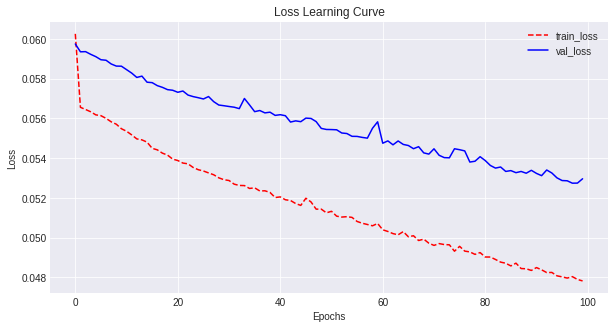

In [0]:
history, model = fitModel(model=model, data=nosw_50_data, batch_size=256, epochs=100, val_size=0.1, verbose=1, callbacks_list=None)

In [0]:
results = evaluateModel(model=model, data=nosw_50_data)
results.head(10)

Test Quadratic Cohen Kappa Score: 0.288


,essay_set,target_score,scaled_target_score,y_pred,rescaled_y_pred
0,1,8,0.6,0.613143,10.0
1,1,10,0.8,0.646485,11.0
2,1,11,0.9,0.585725,9.0
3,1,8,0.6,0.610420,10.0
4,1,10,0.8,0.629774,10.0
5,1,8,0.6,0.590465,9.0
6,1,10,0.8,0.678008,12.0
7,1,10,0.8,0.646878,11.0
8,1,7,0.5,0.571512,8.0
9,1,7,0.5,0.659686,11.0


# CNN Models

In [0]:
def CNN(embedding_matrix, input_length, drate, isTrainable):
    model = Sequential(name='cnn')
    model.add(Embedding(input_dim=embedding_matrix.shape[0], 
                        output_dim=embedding_matrix.shape[1], 
                        embeddings_initializer=Constant(embedding_matrix), 
                        input_length=input_length, trainable=isTrainable, name='embedding_layer'))
    model.add(Dropout(drate))
    model.add(Conv1D(64, 3, activation='relu', kernel_initializer='he_normal'))
    model.add(MaxPooling1D(2))
    model.add(Dropout(drate))
    model.add(Conv1D(128, 3, activation='relu', kernel_initializer='he_normal'))
    model.add(GlobalMaxPooling1D(name='global_maxpool'))
    model.add(Dense(units=32, activation='relu', kernel_initializer='he_normal'))
    model.add(Dense(units=1, activation='sigmoid', name='output'))
    model.compile(optimizer='adam', loss='mse')
    return model

## Trails


				Dropout Rate: 0.1

	Total Training Time: 266.96 seconds
Train Loss: 0.0144
Val   Loss: 0.0321


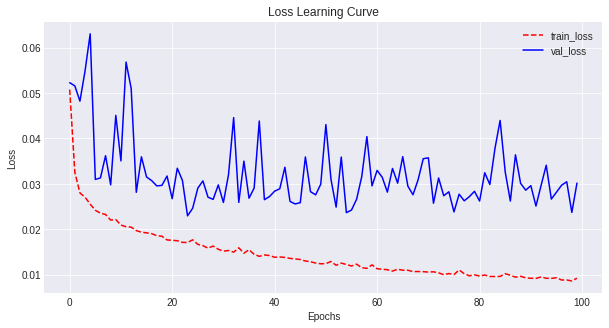

Test Quadratic Cohen Kappa Score: 0.659

				Dropout Rate: 0.2

	Total Training Time: 265.63 seconds
Train Loss: 0.0183
Val   Loss: 0.0439


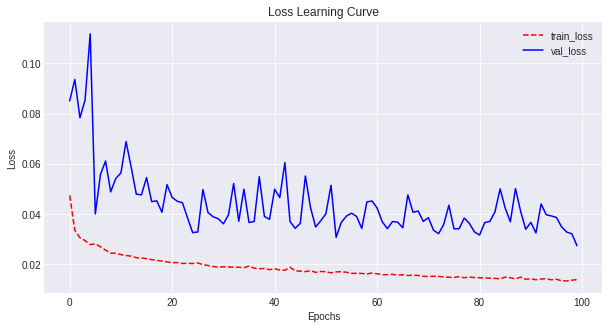

Test Quadratic Cohen Kappa Score: 0.6644

				Dropout Rate: 0.3

	Total Training Time: 265.32 seconds
Train Loss: 0.0209
Val   Loss: 0.0685


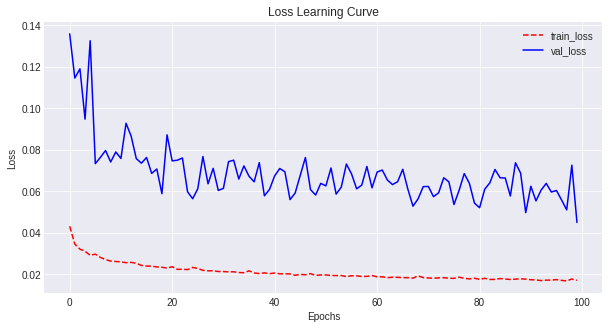

Test Quadratic Cohen Kappa Score: 0.6399

				Dropout Rate: 0.4

	Total Training Time: 266.1 seconds
Train Loss: 0.0233
Val   Loss: 0.1038


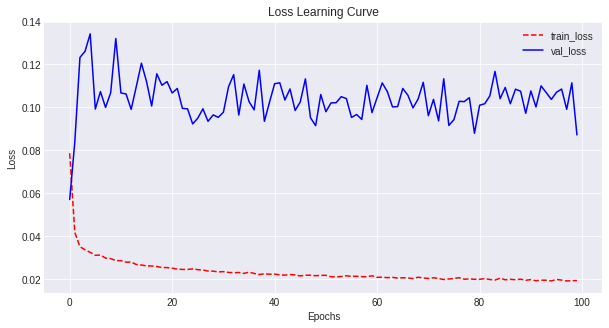

Test Quadratic Cohen Kappa Score: 0.5787

				Dropout Rate: 0.5

	Total Training Time: 265.76 seconds
Train Loss: 0.0241
Val   Loss: 0.1343


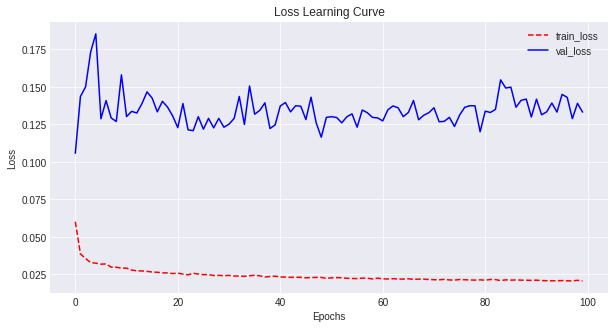

Test Quadratic Cohen Kappa Score: 0.5219


In [0]:
# test different dropout rates
for drate in [0.1, 0.2, 0.3, 0.4, 0.5]:
    print('\n\t\t\t\tDropout Rate:', drate)
    cnn_model = CNN(embedding_matrix=data['embedding_matrix'], input_length=data['train_x'].shape[1], drate=drate, isTrainable=False)
    history, cnn_model = fitModel(model=cnn_model, data=data, batch_size=256, epochs=100, val_size=0.1, verbose=0, callbacks_list=None) 
    results = evaluateModel(model=cnn_model, data=data)


			Dimension : 50


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 50)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 191.11 seconds
Train Loss: 0.0212
Val   Loss: 0.0478


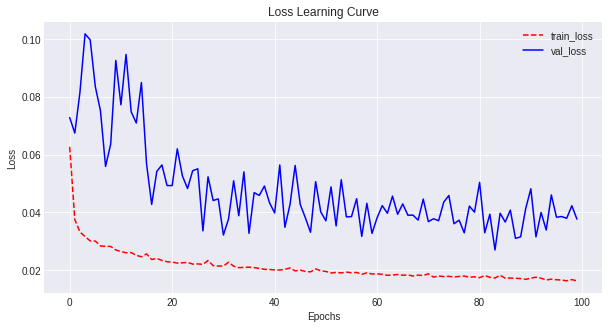

Test Quadratic Cohen Kappa Score: 0.6126

			Dimension : 100


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 100)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 271.58 seconds
Train Loss: 0.0189
Val   Loss: 0.0429


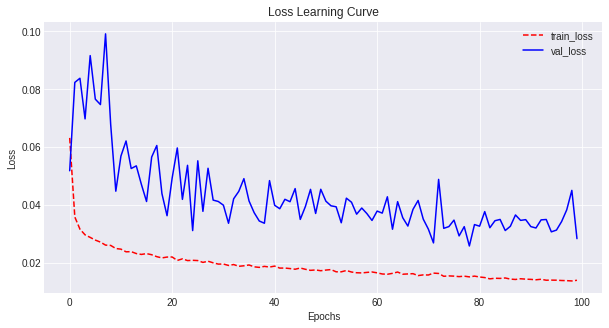

Test Quadratic Cohen Kappa Score: 0.6181

			Dimension : 200


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 200)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 427.91 seconds
Train Loss: 0.0163
Val   Loss: 0.0406


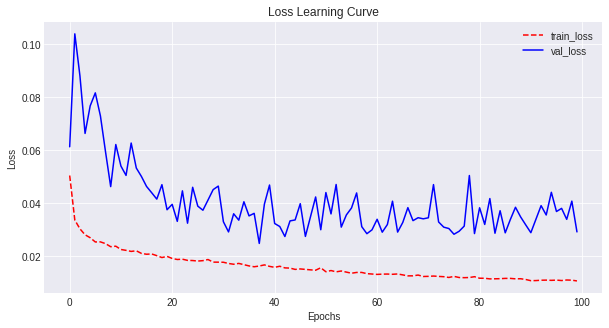

Test Quadratic Cohen Kappa Score: 0.6255

			Dimension : 300


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 300)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 575.21 seconds
Train Loss: 0.0159
Val   Loss: 0.0507


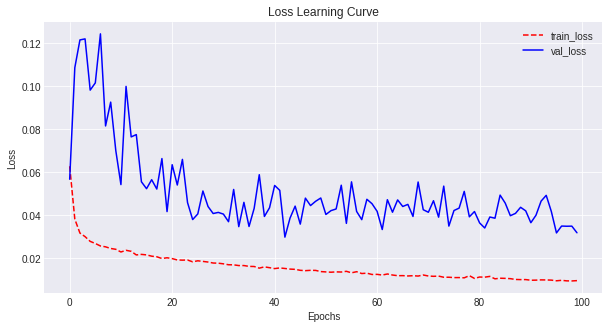

Test Quadratic Cohen Kappa Score: 0.6339

			Dimension : 500


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 500)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 872.19 seconds
Train Loss: 0.0144
Val   Loss: 0.046


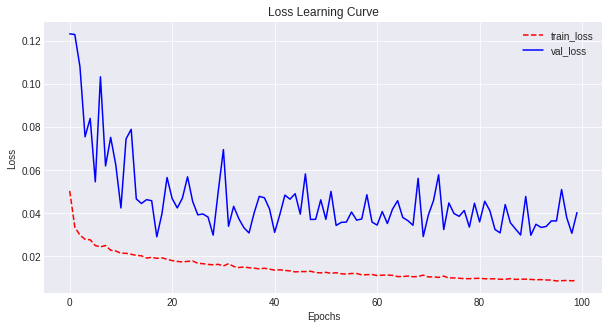

Test Quadratic Cohen Kappa Score: 0.5921


In [0]:
# test different dimension vectors with cnn model
for dim in [50, 100, 200, 300, 500]:
    print('\n\t\t\tDimension :', dim)
    model = Word2Vec.load('./DATA/custom_word2vec_models/' + str(dim) + '_noSW_word2vec_model')
    data = Data(df=df, useStopWord=False, model=model, dim=dim, test_size=0.1).getTrainTestSplit()
    cnn_model = CNN(embedding_matrix=data['embedding_matrix'], input_length=data['train_x'].shape[1], drate=0.2, isTrainable=False)
    history, cnn_model = fitModel(model=cnn_model, data=data, batch_size=256, epochs=100, val_size=0.1, verbose=0, callbacks_list=None) 
    results = evaluateModel(model=cnn_model, data=data)

In [0]:
model = Word2Vec.load('./DATA/custom_word2vec_models/300_noSW_word2vec_model')
data = Data(df=df, useStopWord=False, model=model, dim=300, test_size=0.1).getTrainTestSplit()

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 300)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
cnn_model = CNN(embedding_matrix=data['embedding_matrix'], input_length=data['train_x'].shape[1], drate=0.2, isTrainable=False)
cnn_model.summary()

Model: "cnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_layer (Embedding)  (None, 545, 300)          12369600  
_________________________________________________________________
dropout_70 (Dropout)         (None, 545, 300)          0         
_________________________________________________________________
conv1d_71 (Conv1D)           (None, 543, 64)           57664     
_________________________________________________________________
max_pooling1d_38 (MaxPooling (None, 271, 64)           0         
_________________________________________________________________
dropout_71 (Dropout)         (None, 271, 64)           0         
_________________________________________________________________
conv1d_72 (Conv1D)           (None, 269, 128)          24704     
_________________________________________________________________
global_maxpool (GlobalMaxPoo (None, 128)               0       

Train on 10510 samples, validate on 1168 samples
Epoch 1/100
10510/10510 [==============================] - 7s 704us/sample - loss: 0.0480 - val_loss: 0.0597
Epoch 2/100
10510/10510 [==============================] - 6s 564us/sample - loss: 0.0318 - val_loss: 0.0665
Epoch 3/100
10510/10510 [==============================] - 6s 564us/sample - loss: 0.0305 - val_loss: 0.1046
Epoch 4/100
10510/10510 [==============================] - 6s 566us/sample - loss: 0.0276 - val_loss: 0.0985
Epoch 5/100
10510/10510 [==============================] - 6s 562us/sample - loss: 0.0261 - val_loss: 0.0952
Epoch 6/100
10510/10510 [==============================] - 6s 564us/sample - loss: 0.0257 - val_loss: 0.0718
Epoch 7/100
10510/10510 [==============================] - 6s 561us/sample - loss: 0.0247 - val_loss: 0.0444
Epoch 8/100
10510/10510 [==============================] - 6s 565us/sample - loss: 0.0244 - val_loss: 0.0554
Epoch 9/100
10510/10510 [==============================] - 6s 564us/sample - lo

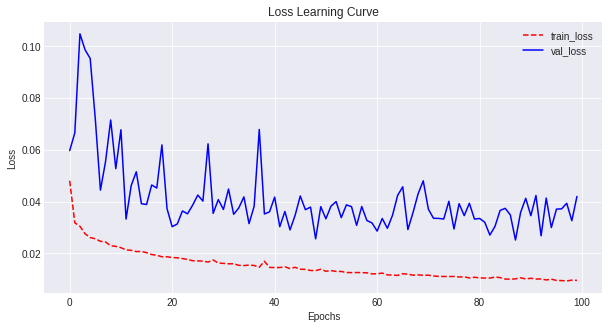

In [0]:
history, cnn_model = fitModel(model=cnn_model, data=data, batch_size=256, epochs=100, val_size=0.1, verbose=1, callbacks_list=None) 

In [0]:
results = evaluateModel(model=cnn_model, data=data)
results.head(10)

Test Quadratic Cohen Kappa Score: 0.6066


,essay_set,target_score,scaled_target_score,y_pred,rescaled_y_pred
0,1,7,0.5,0.236944,5.0
1,1,8,0.6,0.474144,8.0
2,1,10,0.8,0.558415,10.0
3,1,10,0.8,0.636659,11.0
4,1,8,0.6,0.461270,8.0
5,1,10,0.8,0.513251,9.0
6,1,8,0.6,0.516978,9.0
7,1,10,0.8,0.687765,11.0
8,1,7,0.5,0.335467,7.0
9,1,10,0.8,0.668262,11.0


## 100 Embeddings - with embedding training - 0.5882

In [0]:
model = Word2Vec.load('./DATA/custom_word2vec_models/100_noSW_word2vec_model')
data = Data(df=df, useStopWord=False, model=model, dim=100, test_size=0.1).getTrainTestSplit()

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 100)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
cnn_model = CNN(embedding_matrix=data['embedding_matrix'], input_length=data['train_x'].shape[1], drate=0.2, isTrainable=True)
cnn_model.summary()

Model: "cnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_layer (Embedding)  (None, 545, 100)          4123200   
_________________________________________________________________
dropout_72 (Dropout)         (None, 545, 100)          0         
_________________________________________________________________
conv1d_73 (Conv1D)           (None, 543, 64)           19264     
_________________________________________________________________
max_pooling1d_39 (MaxPooling (None, 271, 64)           0         
_________________________________________________________________
dropout_73 (Dropout)         (None, 271, 64)           0         
_________________________________________________________________
conv1d_74 (Conv1D)           (None, 269, 128)          24704     
_________________________________________________________________
global_maxpool (GlobalMaxPoo (None, 128)               0       

Train on 10510 samples, validate on 1168 samples
Epoch 1/100
10510/10510 [==============================] - 8s 720us/sample - loss: 0.0483 - val_loss: 0.0510
Epoch 2/100
10510/10510 [==============================] - 7s 637us/sample - loss: 0.0327 - val_loss: 0.0682
Epoch 3/100
10510/10510 [==============================] - 7s 632us/sample - loss: 0.0288 - val_loss: 0.0984
Epoch 4/100
10510/10510 [==============================] - 7s 633us/sample - loss: 0.0278 - val_loss: 0.0841
Epoch 5/100
10510/10510 [==============================] - 7s 630us/sample - loss: 0.0263 - val_loss: 0.0521
Epoch 6/100
10510/10510 [==============================] - 7s 635us/sample - loss: 0.0248 - val_loss: 0.0765
Epoch 7/100
10510/10510 [==============================] - 7s 630us/sample - loss: 0.0238 - val_loss: 0.0565
Epoch 8/100
10510/10510 [==============================] - 7s 629us/sample - loss: 0.0234 - val_loss: 0.0441
Epoch 9/100
10510/10510 [==============================] - 7s 629us/sample - lo

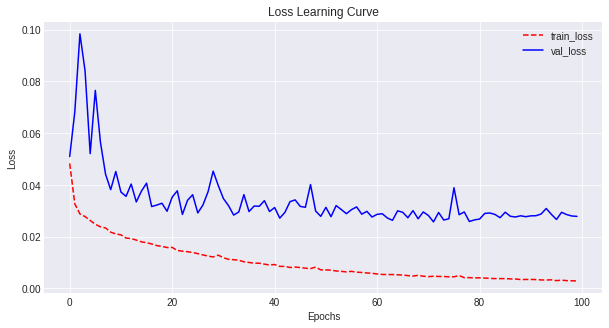

In [0]:
history, cnn_model = fitModel(model=cnn_model, data=data, batch_size=256, epochs=100, val_size=0.1, verbose=1, callbacks_list=None)

In [0]:
results = evaluateModel(model=cnn_model, data=data)
results.head(10)

Test Quadratic Cohen Kappa Score: 0.5882


,essay_set,target_score,scaled_target_score,y_pred,rescaled_y_pred
0,1,8,0.6,0.497357,7.0
1,1,8,0.6,0.566517,8.0
2,1,10,0.8,0.717274,9.0
3,1,6,0.4,0.479191,7.0
4,1,10,0.8,0.644144,9.0
5,1,8,0.6,0.631157,8.0
6,1,7,0.5,0.554776,8.0
7,1,7,0.5,0.524351,7.0
8,1,8,0.6,0.562055,8.0
9,1,8,0.6,0.351734,5.0


## Best CNN Model - 100 embeddings - 0.6808 (no embedding training)

In [0]:
model = Word2Vec.load('./DATA/custom_word2vec_models/100_noSW_word2vec_model')
data = Data(df=df, useStopWord=False, model=model, dim=100, test_size=0.1).getTrainTestSplit()

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 100)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
cnn_model = CNN(embedding_matrix=data['embedding_matrix'], input_length=data['train_x'].shape[1], drate=0.2, isTrainable=False)
cnn_model.summary()

Model: "cnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_layer (Embedding)  (None, 545, 100)          4123200   
_________________________________________________________________
dropout_48 (Dropout)         (None, 545, 100)          0         
_________________________________________________________________
conv1d_49 (Conv1D)           (None, 543, 64)           19264     
_________________________________________________________________
max_pooling1d_27 (MaxPooling (None, 271, 64)           0         
_________________________________________________________________
dropout_49 (Dropout)         (None, 271, 64)           0         
_________________________________________________________________
conv1d_50 (Conv1D)           (None, 269, 128)          24704     
_________________________________________________________________
global_maxpool (GlobalMaxPoo (None, 128)               0       

Train on 10510 samples, validate on 1168 samples
Epoch 1/100
10510/10510 [==============================] - 4s 355us/sample - loss: 0.0546 - val_loss: 0.0791
Epoch 2/100
10510/10510 [==============================] - 3s 271us/sample - loss: 0.0344 - val_loss: 0.0850
Epoch 3/100
10510/10510 [==============================] - 3s 270us/sample - loss: 0.0312 - val_loss: 0.0910
Epoch 4/100
10510/10510 [==============================] - 3s 271us/sample - loss: 0.0291 - val_loss: 0.0948
Epoch 5/100
10510/10510 [==============================] - 3s 269us/sample - loss: 0.0276 - val_loss: 0.1124
Epoch 6/100
10510/10510 [==============================] - 3s 268us/sample - loss: 0.0271 - val_loss: 0.0538
Epoch 7/100
10510/10510 [==============================] - 3s 268us/sample - loss: 0.0262 - val_loss: 0.0695
Epoch 8/100
10510/10510 [==============================] - 3s 275us/sample - loss: 0.0256 - val_loss: 0.0667
Epoch 9/100
10510/10510 [==============================] - 3s 274us/sample - lo

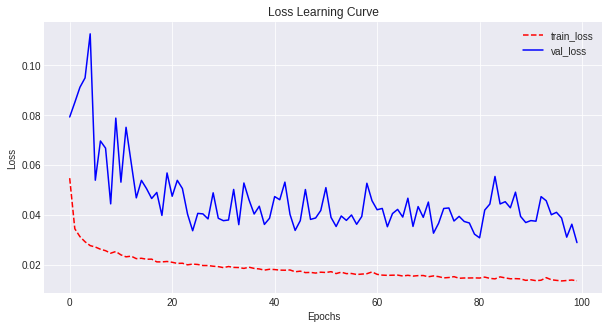

In [0]:
history, cnn_model = fitModel(model=cnn_model, data=data, batch_size=256, epochs=100, val_size=0.1, verbose=1, callbacks_list=None) 

In [0]:
results = evaluateModel(model=cnn_model, data=data)
results.head(10)

Test Quadratic Cohen Kappa Score: 0.6808


,essay_set,target_score,scaled_target_score,y_pred,rescaled_y_pred
0,1,8,0.6,0.447097,8.0
1,1,8,0.6,0.466992,8.0
2,1,10,0.8,0.707311,11.0
3,1,8,0.6,0.511350,8.0
4,1,8,0.6,0.486539,8.0
5,1,9,0.7,0.597363,10.0
6,1,9,0.7,0.615429,10.0
7,1,10,0.8,0.652702,10.0
8,1,8,0.6,0.434216,7.0
9,1,8,0.6,0.324429,6.0


## CNN with Average Vectors (No Embedding Layer) - 0.6237

In [0]:
model = Word2Vec.load('./DATA/custom_word2vec_models/100_noSW_word2vec_model')
data = Data(df=df, useStopWord=False, model=model, dim=100, test_size=0.1).getTrainTestSplit(isTokenizer=False)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
new_data = data
new_data['train_x'] = np.expand_dims(new_data['train_x'], axis=2)
new_data['test_x'] = np.expand_dims(new_data['test_x'], axis=2)
new_data['train_x'].shape, new_data['test_x'].shape

((11678, 100, 1), (1298, 100, 1))

In [0]:
cnn_model = Sequential(name='cnn')
cnn_model.add(Input(shape=(100,1)))
cnn_model.add(Conv1D(64, 3, activation='relu', padding='same', kernel_initializer='he_normal'))
cnn_model.add(MaxPooling1D(2))
cnn_model.add(Conv1D(128, 3, activation='relu', padding='same', kernel_initializer='he_normal'))
cnn_model.add(GlobalMaxPooling1D(name='global_maxpool'))
cnn_model.add(Dense(units=64, activation='relu', kernel_initializer='he_normal'))
cnn_model.add(Dense(units=32, activation='relu', kernel_initializer='he_normal'))
cnn_model.add(Dense(units=1, activation='sigmoid', name='output'))
cnn_model.compile(optimizer='adam', loss='mse')
cnn_model.summary()

Model: "cnn"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv1d_25 (Conv1D)           (None, 100, 64)           256       
_________________________________________________________________
max_pooling1d_12 (MaxPooling (None, 50, 64)            0         
_________________________________________________________________
conv1d_26 (Conv1D)           (None, 50, 128)           24704     
_________________________________________________________________
global_maxpool (GlobalMaxPoo (None, 128)               0         
_________________________________________________________________
dense_18 (Dense)             (None, 64)                8256      
_________________________________________________________________
dense_19 (Dense)             (None, 32)                2080      
_________________________________________________________________
output (Dense)               (None, 1)                 33      

Train on 10510 samples, validate on 1168 samples
Epoch 1/100
10510/10510 [==============================] - 1s 70us/sample - loss: 0.0569 - val_loss: 0.0539
Epoch 2/100
10510/10510 [==============================] - 0s 19us/sample - loss: 0.0453 - val_loss: 0.0475
Epoch 3/100
10510/10510 [==============================] - 0s 18us/sample - loss: 0.0406 - val_loss: 0.0458
Epoch 4/100
10510/10510 [==============================] - 0s 18us/sample - loss: 0.0372 - val_loss: 0.0425
Epoch 5/100
10510/10510 [==============================] - 0s 19us/sample - loss: 0.0359 - val_loss: 0.0390
Epoch 6/100
10510/10510 [==============================] - 0s 18us/sample - loss: 0.0336 - val_loss: 0.0370
Epoch 7/100
10510/10510 [==============================] - 0s 19us/sample - loss: 0.0314 - val_loss: 0.0342
Epoch 8/100
10510/10510 [==============================] - 0s 18us/sample - loss: 0.0303 - val_loss: 0.0332
Epoch 9/100
10510/10510 [==============================] - 0s 18us/sample - loss: 0.029

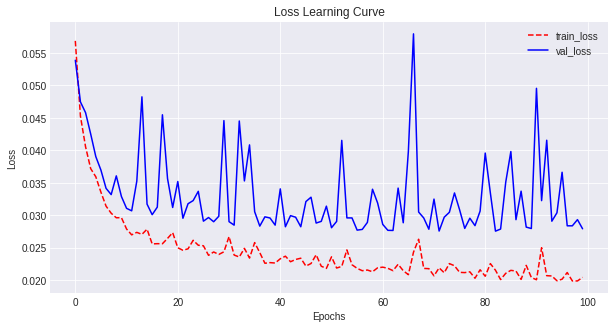

In [0]:
history, cnn_model = fitModel(model=cnn_model, data=new_data, batch_size=256, epochs=100, val_size=0.1, verbose=1, callbacks_list=None) 

In [0]:
results = evaluateModel(model=cnn_model, data=new_data)
results.head(10)

[0.5776 0.4706 0.6109 0.6882 0.7078 0.7718 0.7341 0.4289]
Test Quadratic Cohen Kappa Score: 0.6237


,essay_set,target_score,scaled_target_score,y_pred,rescaled_y_pred
0,1,8,0.6,0.491181,6.0
1,1,11,0.9,0.657637,9.0
2,1,9,0.7,0.587356,8.0
3,1,8,0.6,0.681508,9.0
4,1,7,0.5,0.651346,9.0
5,1,8,0.6,0.621685,8.0
6,1,8,0.6,0.582731,7.0
7,1,8,0.6,0.663063,9.0
8,1,9,0.7,0.622482,8.0
9,1,8,0.6,0.662148,9.0


# Bi-LSTM - Baseline with 100 dim

## With Tokenized Format - 0.5299

In [0]:
def BiLSTM(embedding_matrix, input_length, drate, isTrainable):
    model = Sequential(name='bi-lstm')
    model.add(Embedding(input_dim=embedding_matrix.shape[0], 
                        output_dim=embedding_matrix.shape[1], 
                        embeddings_initializer=Constant(embedding_matrix), 
                        input_length=input_length, trainable=isTrainable, name='embedding_layer'))
    model.add(Bidirectional(LSTM(units=64, return_sequences=True), merge_mode='concat'))
    model.add(Dropout(drate))
    model.add(Flatten())
    model.add(Dense(units=1, activation='sigmoid', name='output'))
    model.compile(optimizer='adam', loss='mse')
    return model

In [0]:
model = Word2Vec.load('./DATA/custom_word2vec_models/100_noSW_word2vec_model')
data = Data(df=df, useStopWord=False, model=model, dim=100, test_size=0.1).getTrainTestSplit()

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of Embedding Matrix: (41232, 100)
Shape of TRAIN X: (11678, 545)
Shape of TEST X:  (1298, 545)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
bilstm_model = BiLSTM(embedding_matrix=data['embedding_matrix'], input_length=data['train_x'].shape[1], drate=0.2, isTrainable=False)
bilstm_model.summary()

Model: "bi-lstm"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
embedding_layer (Embedding)  (None, 545, 100)          4123200   
_________________________________________________________________
bidirectional_1 (Bidirection (None, 545, 128)          84480     
_________________________________________________________________
dropout_75 (Dropout)         (None, 545, 128)          0         
_________________________________________________________________
flatten (Flatten)            (None, 69760)             0         
_________________________________________________________________
output (Dense)               (None, 1)                 69761     
Total params: 4,277,441
Trainable params: 154,241
Non-trainable params: 4,123,200
_________________________________________________________________


Train on 10510 samples, validate on 1168 samples
Epoch 1/100
10510/10510 [==============================] - 14s 1ms/sample - loss: 0.0338 - val_loss: 0.0252
Epoch 2/100
10510/10510 [==============================] - 10s 929us/sample - loss: 0.0226 - val_loss: 0.0229
Epoch 3/100
10510/10510 [==============================] - 10s 930us/sample - loss: 0.0207 - val_loss: 0.0253
Epoch 4/100
10510/10510 [==============================] - 10s 926us/sample - loss: 0.0206 - val_loss: 0.0215
Epoch 5/100
10510/10510 [==============================] - 10s 926us/sample - loss: 0.0189 - val_loss: 0.0287
Epoch 6/100
10510/10510 [==============================] - 10s 928us/sample - loss: 0.0190 - val_loss: 0.0217
Epoch 7/100
10510/10510 [==============================] - 10s 928us/sample - loss: 0.0177 - val_loss: 0.0228
Epoch 8/100
10510/10510 [==============================] - 10s 926us/sample - loss: 0.0175 - val_loss: 0.0221
Epoch 9/100
10510/10510 [==============================] - 10s 932us/samp

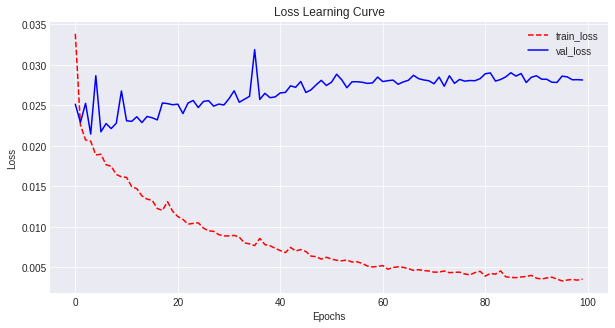

In [0]:
history, bilstm_model = fitModel(model=bilstm_model, data=data, batch_size=256, epochs=100, val_size=0.1, verbose=1, callbacks_list=None) 

In [0]:
results = evaluateModel(model=bilstm_model, data=data)
results.head(10)

Test Quadratic Cohen Kappa Score: 0.5299


,essay_set,target_score,scaled_target_score,y_pred,rescaled_y_pred
0,1,8,0.6,0.747741,10.0
1,1,10,0.8,0.768886,10.0
2,1,9,0.7,0.655005,9.0
3,1,10,0.8,0.786585,11.0
4,1,6,0.4,0.429818,7.0
5,1,8,0.6,0.655381,9.0
6,1,8,0.6,0.698792,10.0
7,1,8,0.6,0.701837,10.0
8,1,7,0.5,0.593647,9.0
9,1,8,0.6,0.589017,9.0


## With Average Vector Format - 0.5466

In [0]:
model = Word2Vec.load('./DATA/custom_word2vec_models/100_noSW_word2vec_model')
data = Data(df=df, useStopWord=False, model=model, dim=100, test_size=0.1).getTrainTestSplit(isTokenizer=False)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
new_data = data
new_data['train_x'] = np.expand_dims(new_data['train_x'], axis=2)
new_data['test_x'] = np.expand_dims(new_data['test_x'], axis=2)
new_data['train_x'].shape, new_data['test_x'].shape

((11678, 100, 1), (1298, 100, 1))

In [0]:
bilstm_model = Sequential(name='bi-lstm')
bilstm_model.add(Input(shape=(100,1)))
bilstm_model.add(Bidirectional(LSTM(units=64, return_sequences=True, activation='relu'), merge_mode='concat'))
bilstm_model.add(Flatten())
bilstm_model.add(Dense(units=1, activation='sigmoid', name='output'))
bilstm_model.compile(optimizer='adam', loss='mse')
bilstm_model.summary()

Model: "bi-lstm"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_4 (Bidirection (None, 100, 128)          33792     
_________________________________________________________________
flatten_4 (Flatten)          (None, 12800)             0         
_________________________________________________________________
output (Dense)               (None, 1)                 12801     
Total params: 46,593
Trainable params: 46,593
Non-trainable params: 0
_________________________________________________________________


Train on 10510 samples, validate on 1168 samples
Epoch 1/100
10510/10510 [==============================] - 11s 1ms/sample - loss: 0.0566 - val_loss: 0.0595
Epoch 2/100
10510/10510 [==============================] - 8s 800us/sample - loss: 0.0525 - val_loss: 0.0547
Epoch 3/100
10510/10510 [==============================] - 8s 806us/sample - loss: 0.0483 - val_loss: 0.0521
Epoch 4/100
10510/10510 [==============================] - 9s 813us/sample - loss: 0.0456 - val_loss: 0.0496
Epoch 5/100
10510/10510 [==============================] - 9s 824us/sample - loss: 0.0433 - val_loss: 0.0467
Epoch 6/100
10510/10510 [==============================] - 9s 811us/sample - loss: 0.0418 - val_loss: 0.0456
Epoch 7/100
10510/10510 [==============================] - 8s 794us/sample - loss: 0.0406 - val_loss: 0.0442
Epoch 8/100
10510/10510 [==============================] - 8s 791us/sample - loss: 0.0397 - val_loss: 0.0448
Epoch 9/100
10510/10510 [==============================] - 8s 793us/sample - los

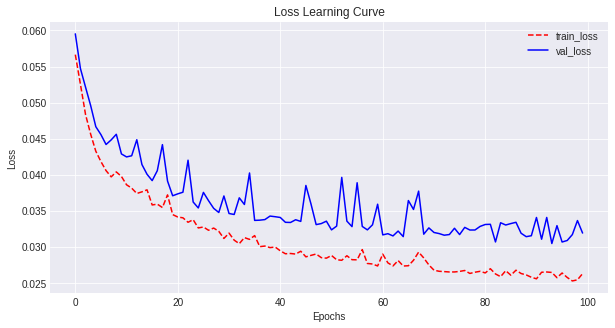

In [0]:
history, bilstm_model = fitModel(model=bilstm_model, data=new_data, batch_size=256, epochs=100, val_size=0.1, verbose=1, callbacks_list=None) 

In [0]:
results = evaluateModel(model=bilstm_model, data=new_data)
results.head(10)

[0.479  0.5245 0.5046 0.6243 0.6481 0.7187 0.6935 0.1798]
Test Quadratic Cohen Kappa Score: 0.5466


,essay_set,target_score,scaled_target_score,y_pred,rescaled_y_pred
0,1,8,0.6,0.507418,8.0
1,1,11,0.9,0.648982,10.0
2,1,9,0.7,0.478399,7.0
3,1,8,0.6,0.613623,9.0
4,1,7,0.5,0.503253,8.0
5,1,8,0.6,0.600128,9.0
6,1,8,0.6,0.534353,8.0
7,1,8,0.6,0.641384,10.0
8,1,9,0.7,0.543576,8.0
9,1,8,0.6,0.471414,7.0


# BiLSTM - Single Hidden Layer - Parameter Tuning - All 8 Sets

## Loop Approach

In [0]:
def BiLSTM(input_shape, units, drate):
    bilstm_model = Sequential(name='bi-lstm')
    bilstm_model.add(Input(shape=input_shape))
    bilstm_model.add(Bidirectional(LSTM(units=units, return_sequences=False, activation='relu'), merge_mode='concat'))
    bilstm_model.add(Dropout(drate))
    bilstm_model.add(Dense(units=1, activation='sigmoid', name='output'))
    bilstm_model.compile(optimizer='adam', loss='mse')
    return bilstm_model

In [0]:
model = Word2Vec.load('./DATA/custom_word2vec_models/100_noSW_word2vec_model')
data = Data(df=df, useStopWord=False, model=model, dim=100, test_size=0.1).getTrainTestSplit(isTokenizer=False)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)


In [0]:
new_data = data
new_data['train_x'] = np.expand_dims(new_data['train_x'], axis=2)
new_data['test_x'] = np.expand_dims(new_data['test_x'], axis=2)
new_data['train_x'].shape, new_data['test_x'].shape

((11678, 100, 1), (1298, 100, 1))

In [0]:
# summary of model
BiLSTM(input_shape=(100, 1), units=64, drate=0.0).summary()

Model: "bi-lstm"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
bidirectional_3 (Bidirection (None, 128)               33792     
_________________________________________________________________
dropout_1 (Dropout)          (None, 128)               0         
_________________________________________________________________
output (Dense)               (None, 1)                 129       
Total params: 33,921
Trainable params: 33,921
Non-trainable params: 0
_________________________________________________________________


In [0]:
# test different dropout rates and hidden number of units - 50 epochs
units_list = [16, 32, 64, 128, 256]
drate_list = [0.0, 0.1, 0.3, 0.5]
for units in units_list:
    for drate in drate_list:
        print('\n\n\t\t\tUnits:', units, '\tDropout Rate:', drate)
        bilstm_model = BiLSTM(input_shape=(100, 1), units=units, drate=drate)
        history, bilstm_model = fitModel(model=bilstm_model, data=new_data, batch_size=256, epochs=50, 
                                         val_size=0.1, verbose=0, callbacks_list=None, isPlot=False)
        results = evaluateModel(model=bilstm_model, data=new_data)



			Units: 16 	Dropout Rate: 0.0

	Total Training Time: 379.98 seconds
Train Loss: 0.0495
Val   Loss: 0.0542
Test Loss: 0.0441
Kappa List: [0.2802 0.1161 0.2574 0.3857 0.4112 0.3864 0.3704 0.4505]
Test Quadratic Cohen Kappa Score: 0.3322


			Units: 16 	Dropout Rate: 0.1

	Total Training Time: 372.56 seconds
Train Loss: 0.0497
Val   Loss: 0.0566
Test Loss: 0.0459
Kappa List: [0.2153 0.2849 0.3148 0.3872 0.3291 0.4752 0.3312 0.2622]
Test Quadratic Cohen Kappa Score: 0.325


			Units: 16 	Dropout Rate: 0.3

	Total Training Time: 370.52 seconds
Train Loss: 0.0507
Val   Loss: 0.054
Test Loss: 0.0448
Kappa List: [0.306  0.2159 0.2872 0.2269 0.4392 0.4688 0.3004 0.3037]
Test Quadratic Cohen Kappa Score: 0.3185


			Units: 16 	Dropout Rate: 0.5

	Total Training Time: 372.41 seconds
Train Loss: 0.0517
Val   Loss: 0.0555
Test Loss: 0.0467
Kappa List: [0.1787 0.2913 0.2882 0.2904 0.3544 0.3686 0.2996 0.3853]
Test Quadratic Cohen Kappa Score: 0.3071


			Units: 32 	Dropout Rate: 0.0

	Total Trai

In [0]:
# test different embedding dimensions with 'best' units and dropout rate
for dim in [50, 100, 200, 300, 500]:
    print('\n\t\t\tDimension :', dim)
    model = Word2Vec.load('./DATA/custom_word2vec_models/' + str(dim) + '_noSW_word2vec_model')
    data = Data(df=df, useStopWord=False, model=model, dim=dim, test_size=0.1).getTrainTestSplit(isTokenizer=False)
    data['train_x'] = np.expand_dims(data['train_x'], axis=2)
    data['test_x'] = np.expand_dims(data['test_x'], axis=2)
    bilstm_model = BiLSTM(input_shape=(dim, 1), units=256, drate=0.0)
    history, bilstm_model = fitModel(model=bilstm_model, data=data, batch_size=256, epochs=50, 
                                     val_size=0.1, verbose=0, callbacks_list=None, isPlot=False)
    results = evaluateModel(model=bilstm_model, data=data)


			Dimension : 50


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 190.23 seconds
Train Loss: 0.0383
Val   Loss: 0.0437
Test Loss: 0.0337
Kappa List: [0.4672 0.4892 0.4691 0.5564 0.6084 0.6889 0.6594 0.061 ]
Test Quadratic Cohen Kappa Score: 0.4999

			Dimension : 100


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 374.44 seconds
Train Loss: 0.0453
Val   Loss: 0.0517
Test Loss: 0.0378
Kappa List: [0.4408 0.3531 0.4068 0.5597 0.4931 0.4876 0.5162 0.2528]
Test Quadratic Cohen Kappa Score: 0.4388

			Dimension : 200


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 765.1 seconds
Train Loss: nan
Val   Loss: 0.222
Test Loss: nan


OverflowError: ignored

## Cross-Validation Parameter Tuning - With all 8 sets<br>Best: units=128, batch_size=32, epochs=100, dimension=200, drate=0.0, l2_regularizer=None, Adam lr=0.001 [Score: 0.6278]<br>Train Loss: 0.0185<br>Val   Loss: 0.0288<br>Test  Loss: 0.0269<br>QCK Score (per essay set): 0.6278<br>QCK Score (all essay set): 0.9709<br>SCR Score (all essay set): 0.9363

In [0]:
def BiLSTM(input_shape, units, drate):
    bilstm_model = Sequential(name='bi-lstm')
    bilstm_model.add(Input(shape=input_shape))
    bilstm_model.add(Bidirectional(LSTM(units=units, return_sequences=False, activation='relu', kernel_initializer='he_normal'), merge_mode='concat'))
    bilstm_model.add(Dropout(drate))
    bilstm_model.add(Dense(units=1, activation='sigmoid', name='output'))
    bilstm_model.compile(optimizer='adam', loss='mse')
    return bilstm_model

In [0]:
def BiLSTM(input_shape, units, optimizer, regularizer):
    bilstm_model = Sequential(name='bi-lstm')
    bilstm_model.add(Input(shape=input_shape))
    bilstm_model.add(Bidirectional(LSTM(units=units, return_sequences=False, activation='relu', kernel_initializer='he_normal', kernel_regularizer=regularizer), merge_mode='concat'))
    bilstm_model.add(Dense(units=1, activation='sigmoid', name='output'))
    bilstm_model.compile(optimizer=optimizer, loss='mse')
    return bilstm_model

In [0]:
def BiLSTM(input_shape, units, denseLayerList):
    bilstm_model = Sequential(name='bi-lstm')
    bilstm_model.add(Input(shape=input_shape))
    bilstm_model.add(Bidirectional(LSTM(units=units, return_sequences=True), merge_mode='concat'))
    bilstm_model.add(Flatten())
    if denseLayerList != None:
        for layer in denseLayerList:
            bilstm_model.add(layer)
    bilstm_model.add(Dense(units=1, activation='sigmoid', name='output'))
    bilstm_model.compile(optimizer='adam', loss='mse')
    return bilstm_model

In [0]:
# performs cross validation training for better model parameter tuning
def cross_val_eval(dim, units, optimizer, regularizer, batch_size, epochs, val_size, verbose, callbacks_list, isPlot):
    # get word_model and data for given dimension
    word_model = Word2Vec.load('./DATA/custom_word2vec_models/' + str(dim) + '_noSW_word2vec_model')
    data = Data(df=df, useStopWord=False, model=word_model, dim=dim, test_size=0.1).getTrainTestSplit(isTokenizer=False)
    # reshape input to shape (batch_size, number of timesteps, sequence length for timesteps) -- (1000, 1, 300)
    data['train_x'] = np.reshape(data['train_x'], (data['train_x'].shape[0], 1, data['train_x'].shape[1]))
    data['test_x'] = np.reshape(data['test_x'], (data['test_x'].shape[0], 1, data['test_x'].shape[1]))
    '''# reshape input to shape (batch_size, number of timesteps, sequence length per timestep) -- (1000, 300, 1)
    data['train_x'] = np.expand_dims(data['train_x'], axis=2)
    data['test_x'] = np.expand_dims(data['test_x'], axis=2)'''
    # combine train and test data into one big array/dataframe
    X = np.concatenate([data['train_x'], data['test_x']])
    Y = np.concatenate([data['train_y'], data['test_y']])
    SCORE_INFO = pd.concat([data['train_score_info'], data['test_score_info']], axis=0)
    print('New X Shape:', X.shape)
    print('New Y Shape:', Y.shape)
    print('New SCORE INFO Shape:', SCORE_INFO.shape)
    # split data into 5 folds
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    count = 0
    train_loss = []
    val_loss = []
    test_loss = []
    kappa_list_per_topic = []
    kappa_list_all_topic = []
    spearman_list_all_topic = []
    for train_index, test_index in kf.split(X):
        count += 1
        print('\n\t\t\t -------- Fold {} --------'.format(count))
        train_x, test_x = X[train_index, :, :], X[test_index, :, :]
        train_y, test_y = Y[train_index], Y[test_index]
        train_score_info, test_score_info = SCORE_INFO.iloc[train_index], SCORE_INFO.iloc[test_index]
        # build model
        model = BiLSTM(input_shape=(1, dim), units=units, optimizer=optimizer, regularizer=regularizer)
        # fit model
        start = time.time()
        history = model.fit(train_x, train_y, batch_size=batch_size, epochs=epochs, 
                            validation_split=val_size, verbose=verbose, callbacks=callbacks_list)
        end = time.time() - start
        print('Total Training Time:', np.round(end, 2), 'seconds')
        print('Train Loss:', np.round(np.mean(history.history['loss']), 4))
        print('Val   Loss:', np.round(np.mean(history.history['val_loss']), 4))
        train_loss.append(np.mean(history.history['loss']))
        val_loss.append(np.mean(history.history['val_loss']))
        if isPlot == True:
            plt.figure(figsize=(10, 5))
            plt.plot(history.history['loss'], 'r--', label='train_loss')
            plt.plot(history.history['val_loss'], 'b-', label='val_loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.title('Loss Learning Curve')
            plt.legend(loc='best')
            plt.show()
        # evaluate model
        tst_loss = model.evaluate(test_x, test_y, verbose=0)
        print('Test  Loss:', np.round(tst_loss, 4))
        test_loss.append(tst_loss)
        y_pred = pd.DataFrame(model.predict(test_x).reshape(-1))
        results = test_score_info.reset_index(drop=True).join(y_pred).rename(columns={0:'y_pred'}).sort_values(by='essay_set').reset_index(drop=True)
        results = scalePred(results)
        per_topic_kappa_score = calculate_kappa_score(results)
        print('Test Quadratic Cohen Kappa Score (per essay set):', np.round(per_topic_kappa_score, 4))
        all_topic_kappa_score = kappa(results['target_score'], results['rescaled_y_pred'], weights='quadratic')
        print('Test Quadratic Cohen Kappa Score (all essay set):', np.round(all_topic_kappa_score, 4))
        all_topic_spearman_score = spearmanr(results['target_score'].values, results['rescaled_y_pred'].values)[0]
        print('Test Spearman Correlation Score  (all essay set):', np.round(all_topic_spearman_score, 4))
        kappa_list_per_topic.append(per_topic_kappa_score)
        kappa_list_all_topic.append(all_topic_kappa_score)
        spearman_list_all_topic.append(all_topic_spearman_score)

    print('\n\n\t\t\tAverage Results:')
    print('Train Loss:', np.round(np.mean(train_loss), 4))
    print('Val   Loss:', np.round(np.mean(val_loss), 4))
    print('Test  Loss:', np.round(np.mean(test_loss), 4))
    print('QCK Score (per essay set):', np.round(np.mean(kappa_list_per_topic), 4))
    print('QCK Score (all essay set):', np.round(np.mean(kappa_list_all_topic), 4))
    print('SCR Score (all essay set):', np.round(np.mean(spearman_list_all_topic), 4))

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 100)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 50.01 seconds
Train Loss: 0.0245
Val   Loss: 0.0298


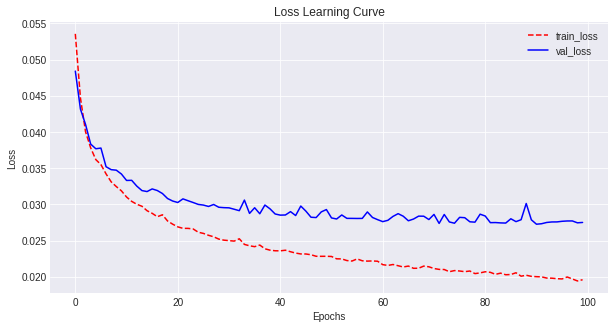

Test  Loss: 0.0276
Kappa List: [0.6257 0.4136 0.4988 0.6915 0.6908 0.79   0.6305 0.357 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.5873
Test Quadratic Cohen Kappa Score (all essay set): 0.9702

			 -------- Fold 2 --------
Total Training Time: 50.5 seconds
Train Loss: 0.0247
Val   Loss: 0.0309


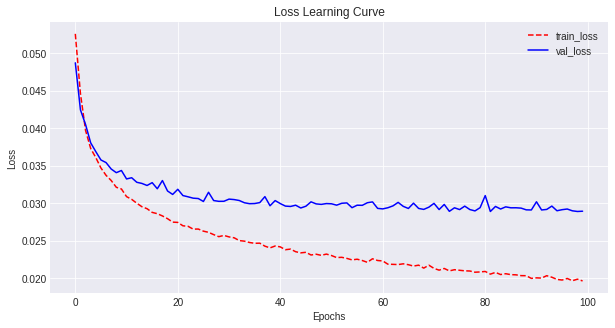

Test  Loss: 0.0261
Kappa List: [0.4436 0.4409 0.5665 0.7111 0.7114 0.679  0.6538 0.2566]
Test Quadratic Cohen Kappa Score (per essay set): 0.5578
Test Quadratic Cohen Kappa Score (all essay set): 0.958

			 -------- Fold 3 --------
Total Training Time: 49.84 seconds
Train Loss: 0.0247
Val   Loss: 0.0297


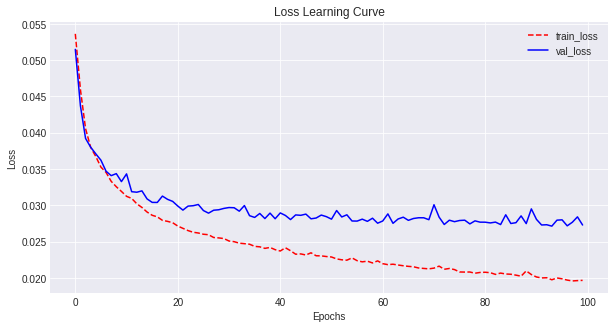

Test  Loss: 0.0252
Kappa List: [0.6822 0.5175 0.5506 0.7506 0.6709 0.7457 0.6034 0.2891]
Test Quadratic Cohen Kappa Score (per essay set): 0.6012
Test Quadratic Cohen Kappa Score (all essay set): 0.9597

			 -------- Fold 4 --------
Total Training Time: 49.87 seconds
Train Loss: 0.0244
Val   Loss: 0.0301


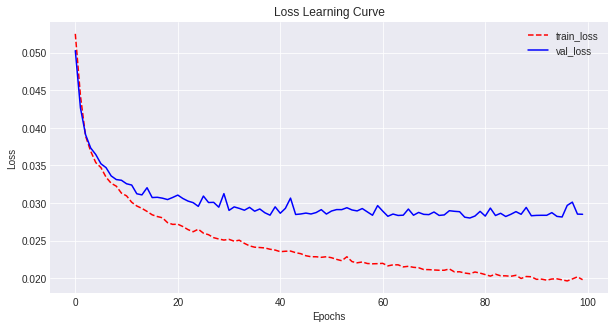

Test  Loss: 0.0259
Kappa List: [0.6421 0.4292 0.5812 0.755  0.6402 0.7318 0.6493 0.363 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.599
Test Quadratic Cohen Kappa Score (all essay set): 0.9685

			 -------- Fold 5 --------
Total Training Time: 49.68 seconds
Train Loss: 0.025
Val   Loss: 0.0292


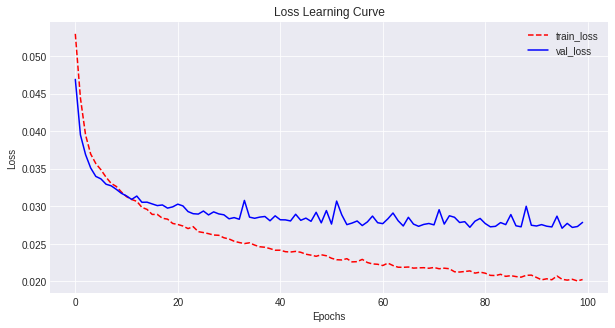

Test  Loss: 0.0285
Kappa List: [0.6306 0.4946 0.5671 0.6784 0.6616 0.7521 0.5909 0.4663]
Test Quadratic Cohen Kappa Score (per essay set): 0.6052
Test Quadratic Cohen Kappa Score (all essay set): 0.9722


			Average Results:
Train Loss: 0.0247
Val   Loss: 0.0299
Test  Loss: 0.0267
QCK Score (per essay set): 0.5901
QCK Score (all essay set): 0.9658


In [0]:
# try with 100 dimensions
cross_val_eval(dim=100, units=64, drate=0.0, batch_size=128, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)

In [0]:
# try with different dimensions and units - batch_size = 128, epochs = 100, drate = 0.0
'''
    BEST COMBO: Units = 64, Dim = 200 --> Dimension 200 performed well throughout
Per Set Score: 0.6017
All Set Score: 0.9668
'''
dim_list = [50, 100, 200, 300, 500]
units_list = [16, 32, 64]
for units in units_list:
    for dim in dim_list:
        print('\n\n\t\t\tUnits:', units, '\tDimension:', dim)
        cross_val_eval(dim=dim, units=units, drate=0.0, batch_size=128, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)

Output hidden; open in https://colab.research.google.com to view.



			Units: 128 	Dimension: 50


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 50)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 39.88 seconds
Train Loss: 0.0246
Val   Loss: 0.0296


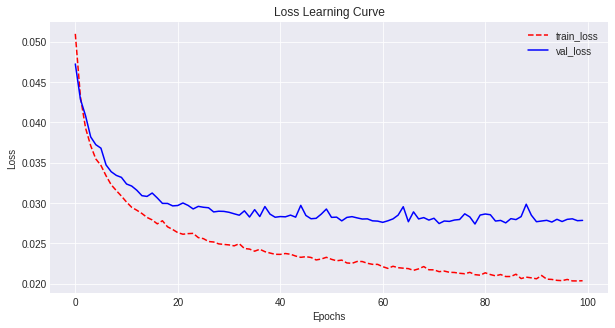

Test  Loss: 0.0267
Kappa List: [0.581  0.4025 0.5308 0.6939 0.7341 0.7912 0.6791 0.4224]
Test Quadratic Cohen Kappa Score (per essay set): 0.6044
Test Quadratic Cohen Kappa Score (all essay set): 0.9727

			 -------- Fold 2 --------
Total Training Time: 38.34 seconds
Train Loss: 0.0246
Val   Loss: 0.0306


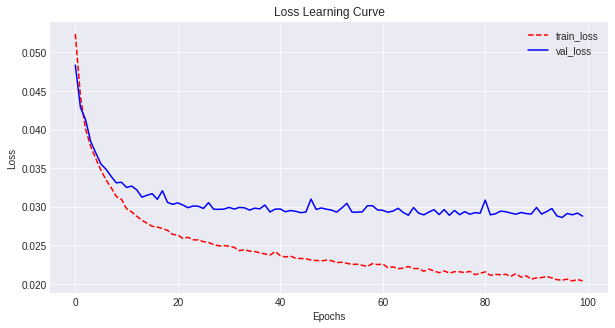

Test  Loss: 0.0259
Kappa List: [0.4914 0.4259 0.5435 0.6929 0.739  0.732  0.6319 0.2331]
Test Quadratic Cohen Kappa Score (per essay set): 0.5612
Test Quadratic Cohen Kappa Score (all essay set): 0.9576

			 -------- Fold 3 --------
Total Training Time: 38.64 seconds
Train Loss: 0.0248
Val   Loss: 0.0292


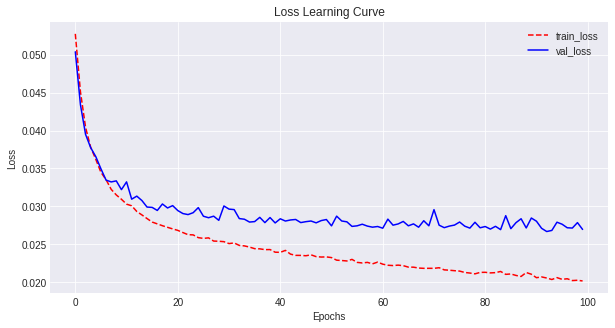

Test  Loss: 0.0257
Kappa List: [0.6585 0.4703 0.5679 0.7274 0.6724 0.7587 0.6567 0.3466]
Test Quadratic Cohen Kappa Score (per essay set): 0.6073
Test Quadratic Cohen Kappa Score (all essay set): 0.9646

			 -------- Fold 4 --------
Total Training Time: 40.34 seconds
Train Loss: 0.0248
Val   Loss: 0.029


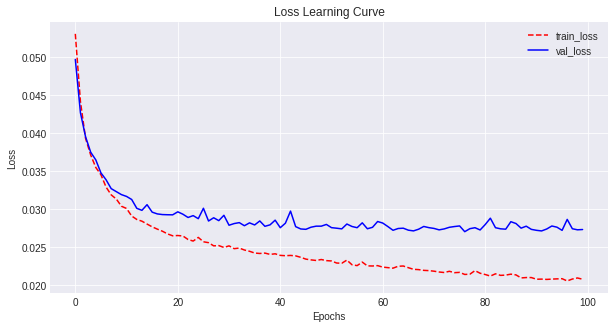

Test  Loss: 0.0255
Kappa List: [0.6652 0.4833 0.5861 0.7592 0.6608 0.7454 0.6436 0.3385]
Test Quadratic Cohen Kappa Score (per essay set): 0.6103
Test Quadratic Cohen Kappa Score (all essay set): 0.9662

			 -------- Fold 5 --------
Total Training Time: 39.25 seconds
Train Loss: 0.0244
Val   Loss: 0.028


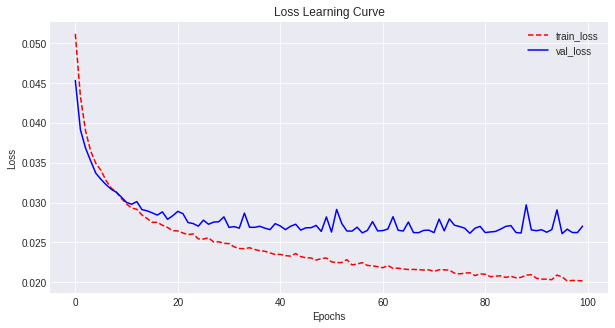

Test  Loss: 0.0284
Kappa List: [0.5926 0.5182 0.5978 0.6717 0.6848 0.7533 0.5809 0.4147]
Test Quadratic Cohen Kappa Score (per essay set): 0.6018
Test Quadratic Cohen Kappa Score (all essay set): 0.97


			Average Results:
Train Loss: 0.0246
Val   Loss: 0.0293
Test  Loss: 0.0264
QCK Score (per essay set): 0.597
QCK Score (all essay set): 0.9662


			Units: 128 	Dimension: 100


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 100)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.28 seconds
Train Loss: 0.0227
Val   Loss: 0.0291


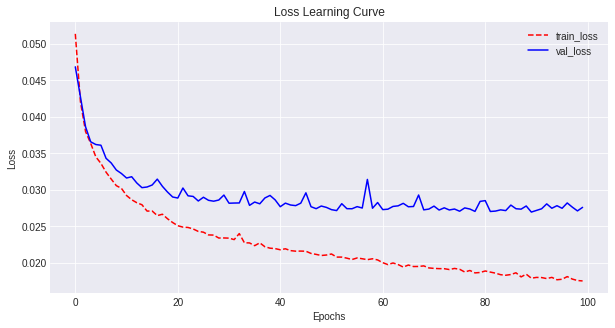

Test  Loss: 0.027
Kappa List: [0.6194 0.4251 0.5282 0.708  0.6699 0.7863 0.6545 0.3641]
Test Quadratic Cohen Kappa Score (per essay set): 0.5944
Test Quadratic Cohen Kappa Score (all essay set): 0.9697

			 -------- Fold 2 --------
Total Training Time: 41.7 seconds
Train Loss: 0.0228
Val   Loss: 0.03


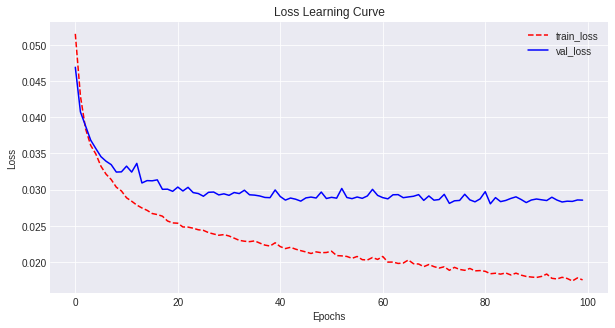

Test  Loss: 0.0251
Kappa List: [0.525  0.5004 0.5957 0.727  0.7472 0.7131 0.6048 0.3103]
Test Quadratic Cohen Kappa Score (per essay set): 0.5904
Test Quadratic Cohen Kappa Score (all essay set): 0.9625

			 -------- Fold 3 --------
Total Training Time: 40.83 seconds
Train Loss: 0.023
Val   Loss: 0.0289


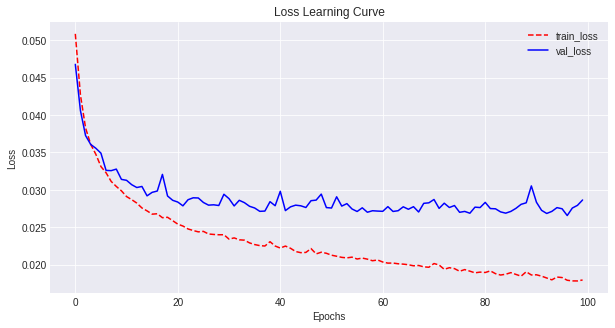

Test  Loss: 0.0251
Kappa List: [0.5908 0.502  0.5579 0.7574 0.7139 0.7035 0.6638 0.3456]
Test Quadratic Cohen Kappa Score (per essay set): 0.6044
Test Quadratic Cohen Kappa Score (all essay set): 0.9633

			 -------- Fold 4 --------
Total Training Time: 41.11 seconds
Train Loss: 0.0228
Val   Loss: 0.0291


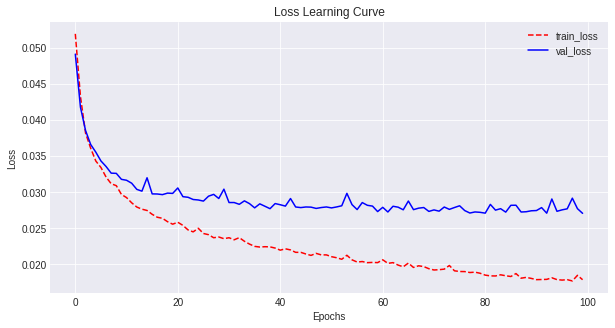

Test  Loss: 0.0248
Kappa List: [0.6556 0.4732 0.5651 0.7595 0.6764 0.7665 0.6511 0.4525]
Test Quadratic Cohen Kappa Score (per essay set): 0.625
Test Quadratic Cohen Kappa Score (all essay set): 0.9698

			 -------- Fold 5 --------
Total Training Time: 41.82 seconds
Train Loss: 0.0222
Val   Loss: 0.0278


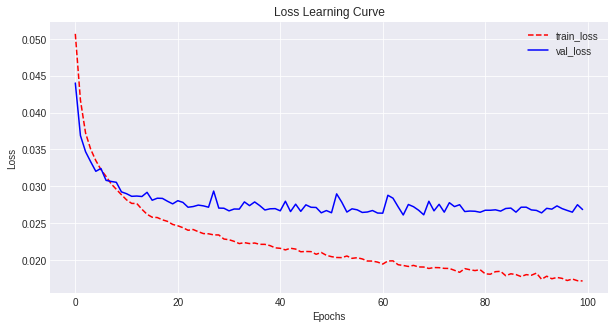

Test  Loss: 0.0278
Kappa List: [0.6251 0.5464 0.5797 0.6952 0.6934 0.7746 0.5828 0.47  ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6209
Test Quadratic Cohen Kappa Score (all essay set): 0.9715


			Average Results:
Train Loss: 0.0227
Val   Loss: 0.029
Test  Loss: 0.026
QCK Score (per essay set): 0.607
QCK Score (all essay set): 0.9673


			Units: 128 	Dimension: 200


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.85 seconds
Train Loss: 0.0205
Val   Loss: 0.0279


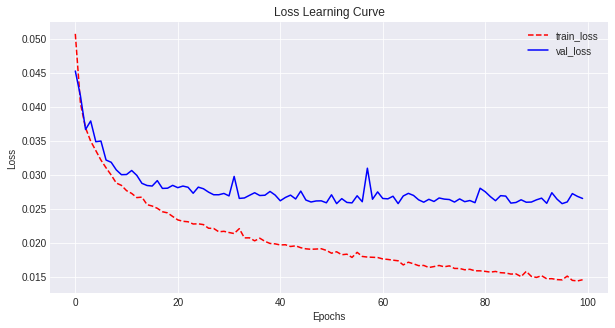

Test  Loss: 0.0268
Kappa List: [0.6694 0.4775 0.5208 0.7007 0.6973 0.792  0.6899 0.4173]
Test Quadratic Cohen Kappa Score (per essay set): 0.6206
Test Quadratic Cohen Kappa Score (all essay set): 0.9714

			 -------- Fold 2 --------
Total Training Time: 41.82 seconds
Train Loss: 0.0207
Val   Loss: 0.0296


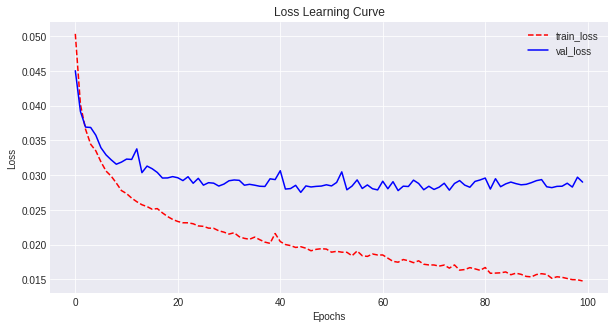

Test  Loss: 0.0248
Kappa List: [0.5051 0.5137 0.5842 0.7197 0.762  0.7287 0.6    0.2517]
Test Quadratic Cohen Kappa Score (per essay set): 0.5832
Test Quadratic Cohen Kappa Score (all essay set): 0.9558

			 -------- Fold 3 --------
Total Training Time: 41.01 seconds
Train Loss: 0.021
Val   Loss: 0.0283


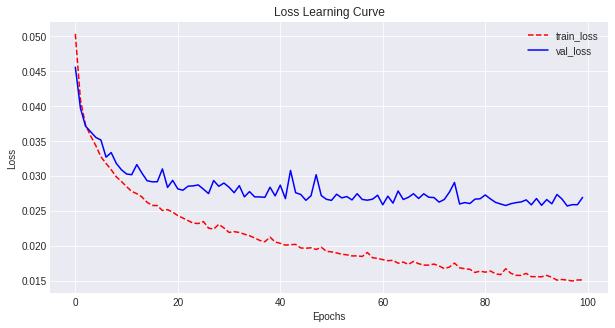

Test  Loss: 0.0247
Kappa List: [0.5693 0.5839 0.5621 0.7748 0.7229 0.7326 0.656  0.3943]
Test Quadratic Cohen Kappa Score (per essay set): 0.6245
Test Quadratic Cohen Kappa Score (all essay set): 0.9669

			 -------- Fold 4 --------
Total Training Time: 40.68 seconds
Train Loss: 0.0208
Val   Loss: 0.0288


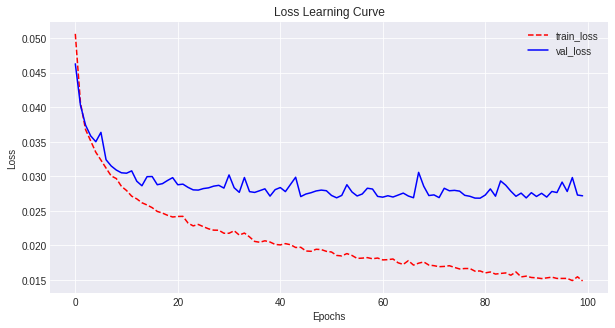

Test  Loss: 0.0249
Kappa List: [0.6505 0.429  0.6027 0.7788 0.6155 0.7494 0.6623 0.4684]
Test Quadratic Cohen Kappa Score (per essay set): 0.6196
Test Quadratic Cohen Kappa Score (all essay set): 0.9705

			 -------- Fold 5 --------
Total Training Time: 40.99 seconds
Train Loss: 0.0206
Val   Loss: 0.0272


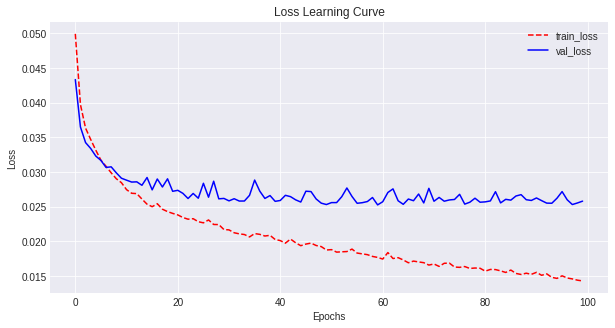

Test  Loss: 0.0268
Kappa List: [0.6672 0.5955 0.5863 0.7233 0.6579 0.7859 0.6119 0.464 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6365
Test Quadratic Cohen Kappa Score (all essay set): 0.9745


			Average Results:
Train Loss: 0.0207
Val   Loss: 0.0284
Test  Loss: 0.0256
QCK Score (per essay set): 0.6169
QCK Score (all essay set): 0.9678


			Units: 128 	Dimension: 300


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 300)
Shape of TEST X:  (1298, 300)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 300)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.37 seconds
Train Loss: 0.0213
Val   Loss: 0.029


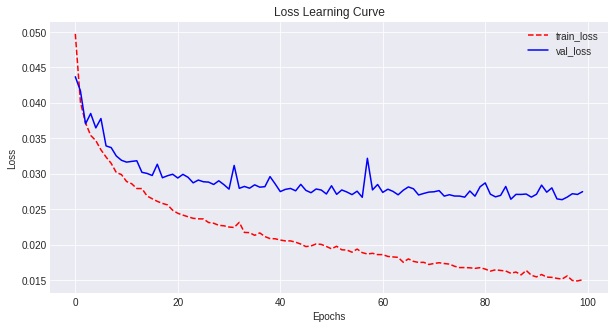

Test  Loss: 0.0272
Kappa List: [0.6302 0.446  0.5286 0.7115 0.7106 0.7846 0.6766 0.4647]
Test Quadratic Cohen Kappa Score (per essay set): 0.6191
Test Quadratic Cohen Kappa Score (all essay set): 0.974

			 -------- Fold 2 --------
Total Training Time: 41.71 seconds
Train Loss: 0.0207
Val   Loss: 0.0303


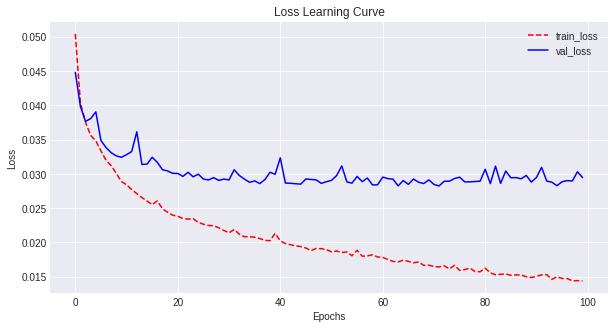

Test  Loss: 0.0246
Kappa List: [0.4342 0.4787 0.594  0.7228 0.7511 0.7397 0.6412 0.2485]
Test Quadratic Cohen Kappa Score (per essay set): 0.5763
Test Quadratic Cohen Kappa Score (all essay set): 0.9557

			 -------- Fold 3 --------
Total Training Time: 40.01 seconds
Train Loss: 0.0212
Val   Loss: 0.0291


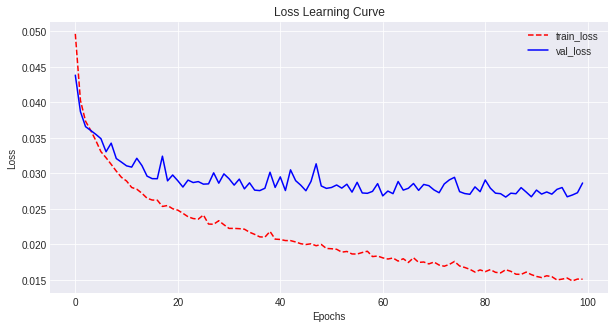

Test  Loss: 0.026
Kappa List: [0.5733 0.5684 0.5335 0.7678 0.6952 0.717  0.6356 0.3493]
Test Quadratic Cohen Kappa Score (per essay set): 0.605
Test Quadratic Cohen Kappa Score (all essay set): 0.9648

			 -------- Fold 4 --------
Total Training Time: 40.71 seconds
Train Loss: 0.0209
Val   Loss: 0.0292


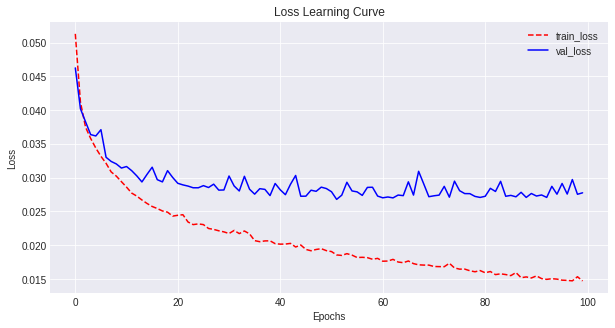

Test  Loss: 0.0254
Kappa List: [0.6505 0.5158 0.5858 0.7869 0.642  0.7642 0.6784 0.4569]
Test Quadratic Cohen Kappa Score (per essay set): 0.6351
Test Quadratic Cohen Kappa Score (all essay set): 0.9718

			 -------- Fold 5 --------
Total Training Time: 40.73 seconds
Train Loss: 0.0209
Val   Loss: 0.028


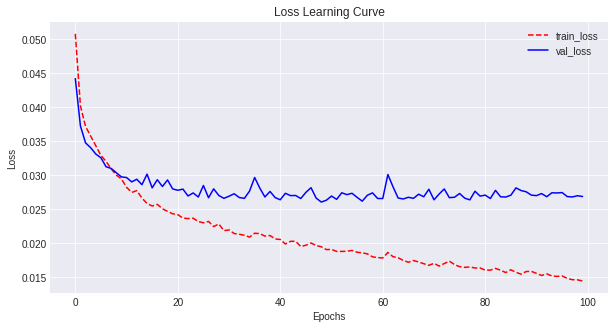

Test  Loss: 0.0262
Kappa List: [0.6183 0.5909 0.5974 0.7224 0.6815 0.7745 0.6355 0.4586]
Test Quadratic Cohen Kappa Score (per essay set): 0.6349
Test Quadratic Cohen Kappa Score (all essay set): 0.9729


			Average Results:
Train Loss: 0.021
Val   Loss: 0.0291
Test  Loss: 0.0259
QCK Score (per essay set): 0.6141
QCK Score (all essay set): 0.9678


			Units: 128 	Dimension: 500


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 500)
Shape of TEST X:  (1298, 500)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 500)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 42.3 seconds
Train Loss: 0.0221
Val   Loss: 0.0297


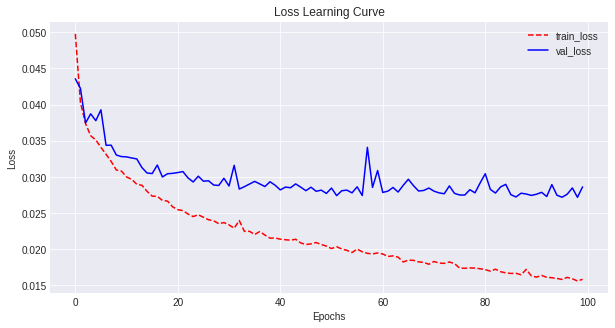

Test  Loss: 0.0279
Kappa List: [0.6279 0.4466 0.5183 0.7079 0.6879 0.7735 0.6875 0.4343]
Test Quadratic Cohen Kappa Score (per essay set): 0.6105
Test Quadratic Cohen Kappa Score (all essay set): 0.9742

			 -------- Fold 2 --------
Total Training Time: 43.0 seconds
Train Loss: 0.022
Val   Loss: 0.031


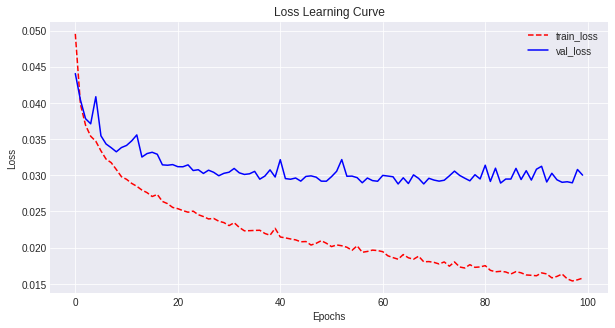

Test  Loss: 0.0255
Kappa List: [0.501  0.5167 0.6097 0.7076 0.7386 0.7505 0.5974 0.2574]
Test Quadratic Cohen Kappa Score (per essay set): 0.5849
Test Quadratic Cohen Kappa Score (all essay set): 0.9566

			 -------- Fold 3 --------
Total Training Time: 42.49 seconds
Train Loss: 0.0224
Val   Loss: 0.0298


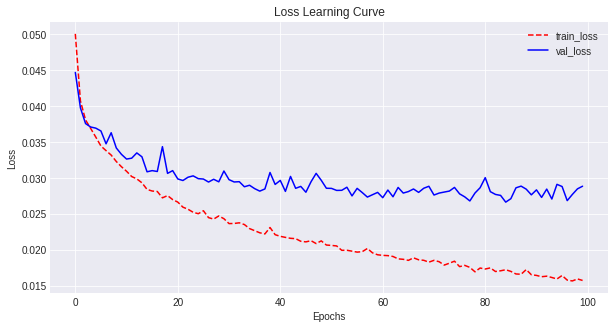

Test  Loss: 0.0269
Kappa List: [0.6557 0.5156 0.5337 0.7432 0.6662 0.7122 0.636  0.475 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6172
Test Quadratic Cohen Kappa Score (all essay set): 0.9719

			 -------- Fold 4 --------
Total Training Time: 42.89 seconds
Train Loss: 0.0223
Val   Loss: 0.0297


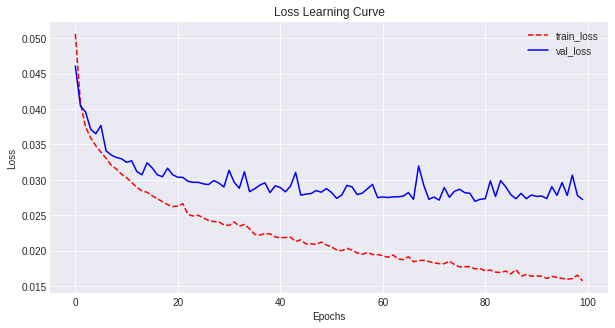

Test  Loss: 0.0252
Kappa List: [0.6577 0.4617 0.5756 0.7776 0.6391 0.7482 0.6568 0.4181]
Test Quadratic Cohen Kappa Score (per essay set): 0.6168
Test Quadratic Cohen Kappa Score (all essay set): 0.9688

			 -------- Fold 5 --------
Total Training Time: 43.93 seconds
Train Loss: 0.0219
Val   Loss: 0.0283


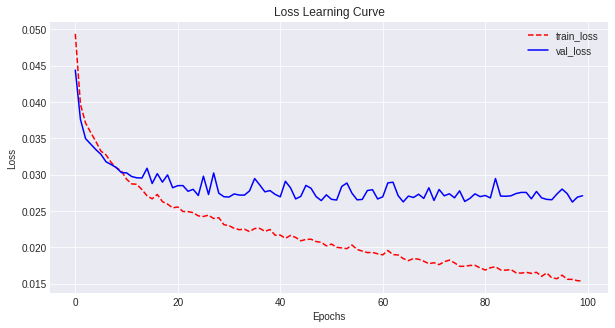

Test  Loss: 0.0275
Kappa List: [0.6369 0.5566 0.5414 0.7085 0.6785 0.7712 0.6322 0.4779]
Test Quadratic Cohen Kappa Score (per essay set): 0.6254
Test Quadratic Cohen Kappa Score (all essay set): 0.9747


			Average Results:
Train Loss: 0.0221
Val   Loss: 0.0297
Test  Loss: 0.0266
QCK Score (per essay set): 0.611
QCK Score (all essay set): 0.9692


			Units: 256 	Dimension: 50


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 50)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.8 seconds
Train Loss: 0.0227
Val   Loss: 0.0283


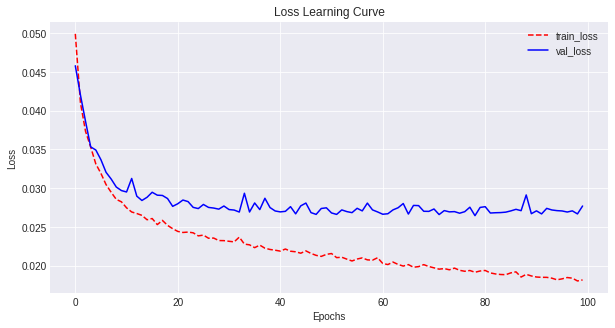

Test  Loss: 0.0267
Kappa List: [0.5672 0.4227 0.5165 0.6822 0.6898 0.7973 0.6994 0.4272]
Test Quadratic Cohen Kappa Score (per essay set): 0.6003
Test Quadratic Cohen Kappa Score (all essay set): 0.9737

			 -------- Fold 2 --------
Total Training Time: 40.47 seconds
Train Loss: 0.023
Val   Loss: 0.0303


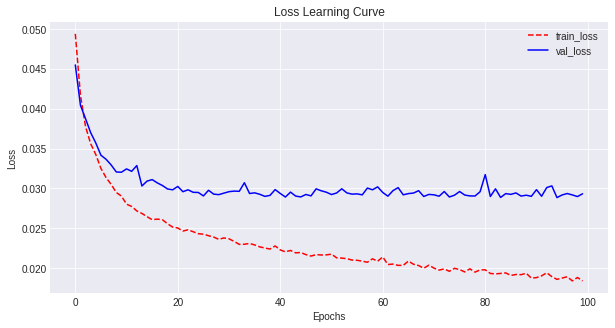

Test  Loss: 0.0253
Kappa List: [0.4997 0.5223 0.5896 0.702  0.722  0.6991 0.64   0.2426]
Test Quadratic Cohen Kappa Score (per essay set): 0.5772
Test Quadratic Cohen Kappa Score (all essay set): 0.9604

			 -------- Fold 3 --------
Total Training Time: 39.63 seconds
Train Loss: 0.0231
Val   Loss: 0.0281


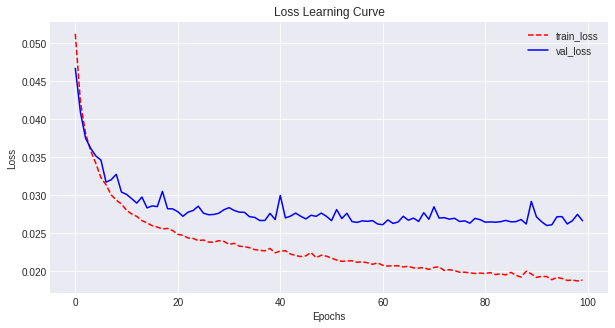

Test  Loss: 0.0251
Kappa List: [0.5978 0.5069 0.6227 0.749  0.6943 0.7568 0.6151 0.3331]
Test Quadratic Cohen Kappa Score (per essay set): 0.6095
Test Quadratic Cohen Kappa Score (all essay set): 0.9633

			 -------- Fold 4 --------
Total Training Time: 39.72 seconds
Train Loss: 0.023
Val   Loss: 0.029


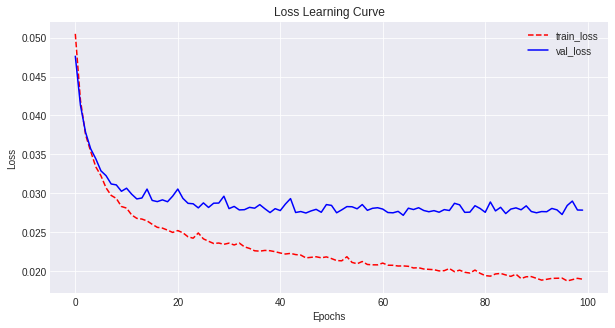

Test  Loss: 0.0254
Kappa List: [0.6349 0.4165 0.5731 0.7778 0.6834 0.747  0.641  0.4314]
Test Quadratic Cohen Kappa Score (per essay set): 0.6132
Test Quadratic Cohen Kappa Score (all essay set): 0.969

			 -------- Fold 5 --------
Total Training Time: 40.19 seconds
Train Loss: 0.0228
Val   Loss: 0.0279


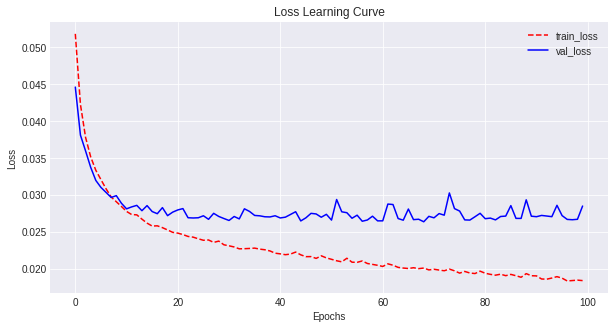

Test  Loss: 0.0292
Kappa List: [0.6006 0.5316 0.6141 0.6947 0.695  0.7243 0.6386 0.4458]
Test Quadratic Cohen Kappa Score (per essay set): 0.6181
Test Quadratic Cohen Kappa Score (all essay set): 0.973


			Average Results:
Train Loss: 0.0229
Val   Loss: 0.0287
Test  Loss: 0.0264
QCK Score (per essay set): 0.6036
QCK Score (all essay set): 0.9679


			Units: 256 	Dimension: 100


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 100)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.62 seconds
Train Loss: 0.0204
Val   Loss: 0.0279


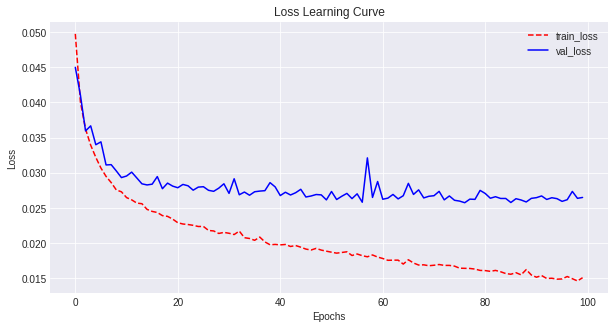

Test  Loss: 0.0271
Kappa List: [0.6055 0.4729 0.5244 0.7182 0.7156 0.7859 0.6958 0.4339]
Test Quadratic Cohen Kappa Score (per essay set): 0.619
Test Quadratic Cohen Kappa Score (all essay set): 0.9724

			 -------- Fold 2 --------
Total Training Time: 39.61 seconds
Train Loss: 0.0203
Val   Loss: 0.0299


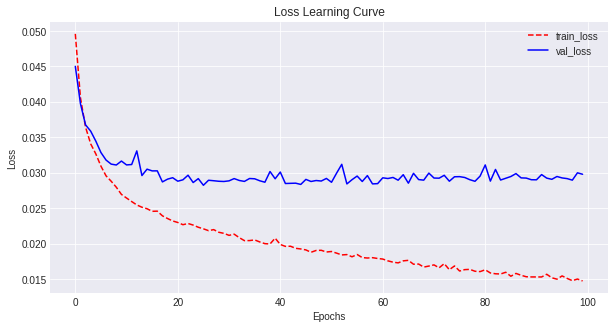

Test  Loss: 0.0247
Kappa List: [0.4611 0.4954 0.5836 0.729  0.7588 0.733  0.6181 0.2817]
Test Quadratic Cohen Kappa Score (per essay set): 0.5826
Test Quadratic Cohen Kappa Score (all essay set): 0.9608

			 -------- Fold 3 --------
Total Training Time: 40.74 seconds
Train Loss: 0.0209
Val   Loss: 0.0278


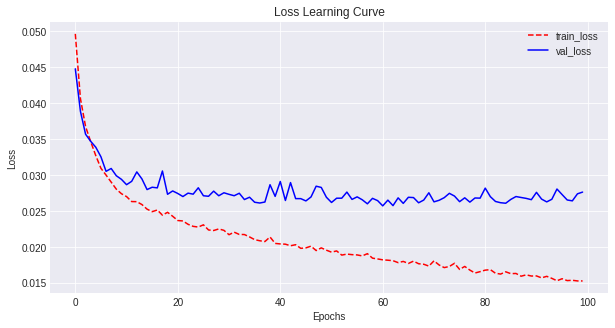

Test  Loss: 0.0248
Kappa List: [0.5688 0.5471 0.5864 0.7712 0.7238 0.715  0.6555 0.4022]
Test Quadratic Cohen Kappa Score (per essay set): 0.6213
Test Quadratic Cohen Kappa Score (all essay set): 0.9682

			 -------- Fold 4 --------
Total Training Time: 40.13 seconds
Train Loss: 0.0207
Val   Loss: 0.0285


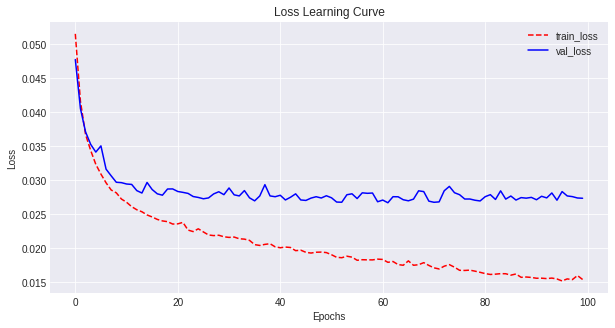

Test  Loss: 0.0247
Kappa List: [0.5868 0.4707 0.566  0.7649 0.6752 0.7384 0.6512 0.3626]
Test Quadratic Cohen Kappa Score (per essay set): 0.602
Test Quadratic Cohen Kappa Score (all essay set): 0.9677

			 -------- Fold 5 --------
Total Training Time: 40.29 seconds
Train Loss: 0.0203
Val   Loss: 0.0274


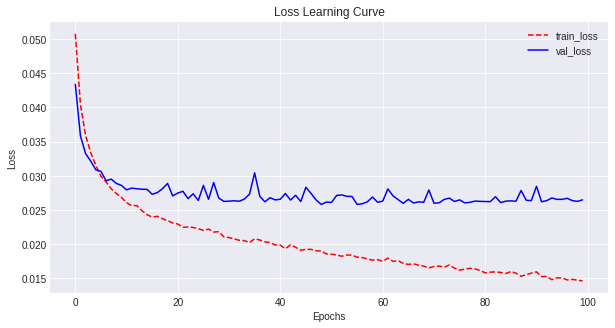

Test  Loss: 0.0269
Kappa List: [0.6734 0.5626 0.5813 0.7074 0.7029 0.7741 0.6371 0.4958]
Test Quadratic Cohen Kappa Score (per essay set): 0.6418
Test Quadratic Cohen Kappa Score (all essay set): 0.9759


			Average Results:
Train Loss: 0.0205
Val   Loss: 0.0283
Test  Loss: 0.0256
QCK Score (per essay set): 0.6133
QCK Score (all essay set): 0.969


			Units: 256 	Dimension: 200


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.87 seconds
Train Loss: 0.0186
Val   Loss: 0.0277


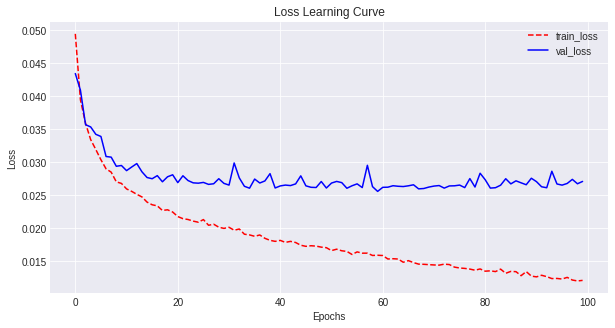

Test  Loss: 0.0264
Kappa List: [0.5961 0.4969 0.556  0.7303 0.7208 0.7938 0.6764 0.4223]
Test Quadratic Cohen Kappa Score (per essay set): 0.6241
Test Quadratic Cohen Kappa Score (all essay set): 0.9729

			 -------- Fold 2 --------
Total Training Time: 40.81 seconds
Train Loss: 0.0189
Val   Loss: 0.0297


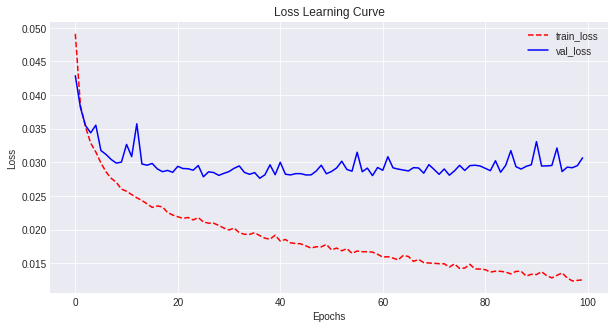

Test  Loss: 0.0258
Kappa List: [0.4792 0.4681 0.6131 0.7118 0.7234 0.7133 0.5961 0.2026]
Test Quadratic Cohen Kappa Score (per essay set): 0.5635
Test Quadratic Cohen Kappa Score (all essay set): 0.95

			 -------- Fold 3 --------
Total Training Time: 41.33 seconds
Train Loss: 0.0193
Val   Loss: 0.0282


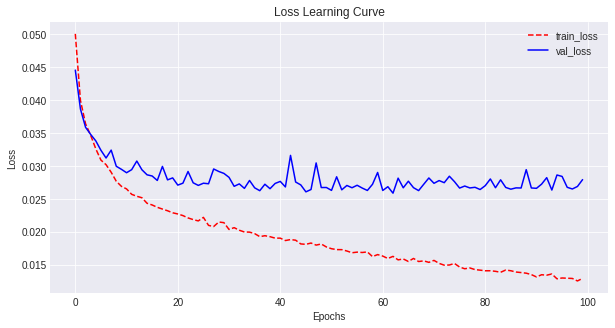

Test  Loss: 0.0257
Kappa List: [0.519  0.5454 0.5468 0.7718 0.7301 0.7582 0.6291 0.3705]
Test Quadratic Cohen Kappa Score (per essay set): 0.6089
Test Quadratic Cohen Kappa Score (all essay set): 0.9654

			 -------- Fold 4 --------
Total Training Time: 40.78 seconds
Train Loss: 0.0188
Val   Loss: 0.0281


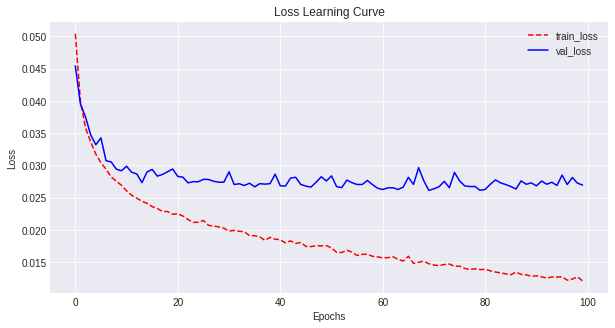

Test  Loss: 0.0244
Kappa List: [0.6114 0.3634 0.5871 0.7878 0.6562 0.7492 0.6542 0.4375]
Test Quadratic Cohen Kappa Score (per essay set): 0.6058
Test Quadratic Cohen Kappa Score (all essay set): 0.971

			 -------- Fold 5 --------
Total Training Time: 40.84 seconds
Train Loss: 0.0189
Val   Loss: 0.0277


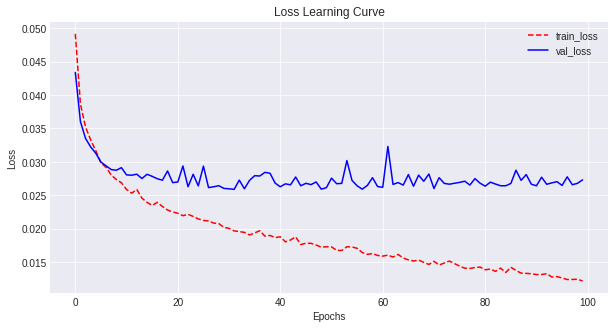

Test  Loss: 0.0271
Kappa List: [0.6677 0.5574 0.5302 0.7048 0.6786 0.7674 0.6231 0.4167]
Test Quadratic Cohen Kappa Score (per essay set): 0.6183
Test Quadratic Cohen Kappa Score (all essay set): 0.9742


			Average Results:
Train Loss: 0.0189
Val   Loss: 0.0283
Test  Loss: 0.0259
QCK Score (per essay set): 0.6041
QCK Score (all essay set): 0.9667


			Units: 256 	Dimension: 300


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 300)
Shape of TEST X:  (1298, 300)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 300)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.97 seconds
Train Loss: 0.0188
Val   Loss: 0.0284


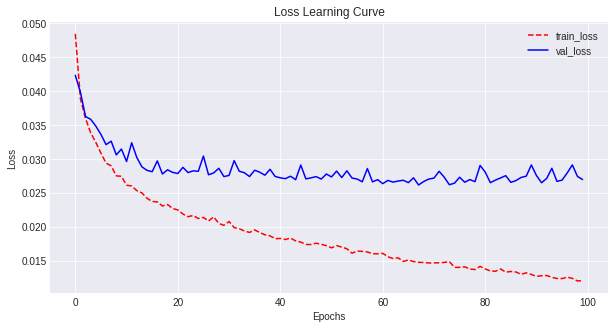

Test  Loss: 0.0267
Kappa List: [0.6296 0.534  0.5455 0.719  0.7007 0.7817 0.7115 0.4803]
Test Quadratic Cohen Kappa Score (per essay set): 0.6378
Test Quadratic Cohen Kappa Score (all essay set): 0.9732

			 -------- Fold 2 --------
Total Training Time: 41.98 seconds
Train Loss: 0.0192
Val   Loss: 0.0299


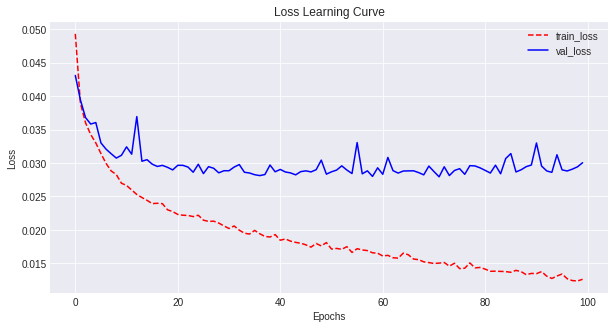

Test  Loss: 0.0255
Kappa List: [0.4686 0.4447 0.6106 0.7066 0.7237 0.7134 0.6299 0.2358]
Test Quadratic Cohen Kappa Score (per essay set): 0.5667
Test Quadratic Cohen Kappa Score (all essay set): 0.9546

			 -------- Fold 3 --------
Total Training Time: 42.44 seconds
Train Loss: 0.0192
Val   Loss: 0.0284


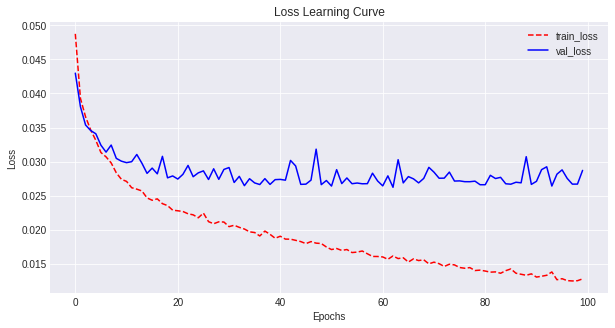

Test  Loss: 0.0262
Kappa List: [0.6578 0.5465 0.5444 0.7629 0.7058 0.7335 0.657  0.4234]
Test Quadratic Cohen Kappa Score (per essay set): 0.6289
Test Quadratic Cohen Kappa Score (all essay set): 0.9695

			 -------- Fold 4 --------
Total Training Time: 42.91 seconds
Train Loss: 0.0192
Val   Loss: 0.0288


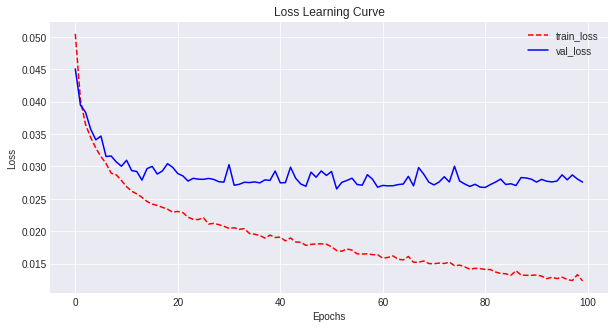

Test  Loss: 0.0246
Kappa List: [0.6293 0.5097 0.5901 0.7834 0.6688 0.758  0.6347 0.4524]
Test Quadratic Cohen Kappa Score (per essay set): 0.6283
Test Quadratic Cohen Kappa Score (all essay set): 0.971

			 -------- Fold 5 --------
Total Training Time: 41.8 seconds
Train Loss: 0.019
Val   Loss: 0.0279


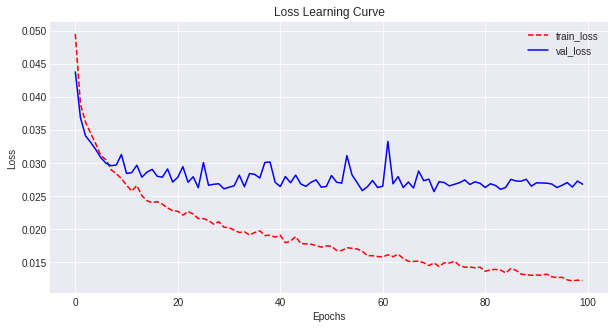

Test  Loss: 0.0267
Kappa List: [0.6339 0.594  0.5907 0.7173 0.7154 0.7714 0.6234 0.4652]
Test Quadratic Cohen Kappa Score (per essay set): 0.6389
Test Quadratic Cohen Kappa Score (all essay set): 0.9746


			Average Results:
Train Loss: 0.0191
Val   Loss: 0.0287
Test  Loss: 0.026
QCK Score (per essay set): 0.6201
QCK Score (all essay set): 0.9686


			Units: 256 	Dimension: 500


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 500)
Shape of TEST X:  (1298, 500)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 500)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 44.83 seconds
Train Loss: 0.0202
Val   Loss: 0.0293


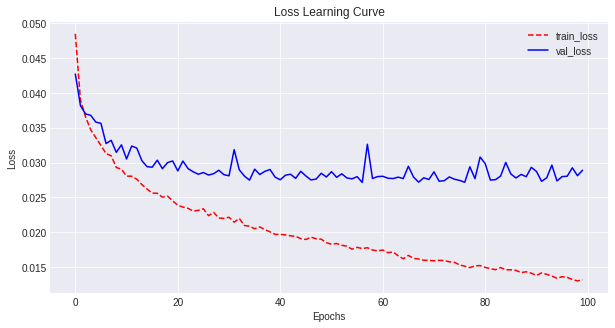

Test  Loss: 0.0273
Kappa List: [0.6265 0.5194 0.5365 0.7034 0.6967 0.7821 0.6857 0.4055]
Test Quadratic Cohen Kappa Score (per essay set): 0.6195
Test Quadratic Cohen Kappa Score (all essay set): 0.9727

			 -------- Fold 2 --------
Total Training Time: 44.14 seconds
Train Loss: 0.02
Val   Loss: 0.0307


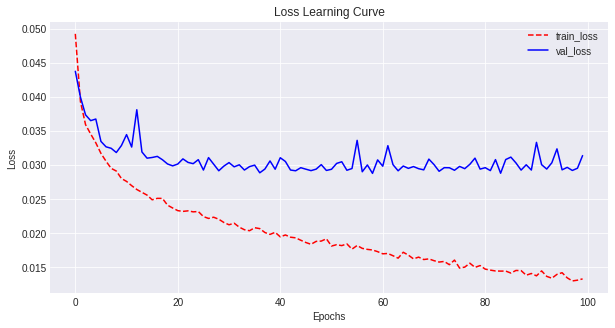

Test  Loss: 0.0267
Kappa List: [0.5039 0.4792 0.601  0.6982 0.7393 0.7251 0.6224 0.2532]
Test Quadratic Cohen Kappa Score (per essay set): 0.5778
Test Quadratic Cohen Kappa Score (all essay set): 0.9575

			 -------- Fold 3 --------
Total Training Time: 44.16 seconds
Train Loss: 0.0204
Val   Loss: 0.0289


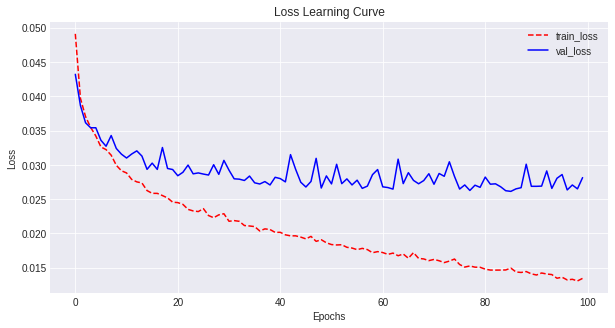

Test  Loss: 0.0262
Kappa List: [0.5853 0.5534 0.5537 0.7561 0.7065 0.732  0.6111 0.4346]
Test Quadratic Cohen Kappa Score (per essay set): 0.6166
Test Quadratic Cohen Kappa Score (all essay set): 0.9695

			 -------- Fold 4 --------
Total Training Time: 44.72 seconds
Train Loss: 0.0205
Val   Loss: 0.0293


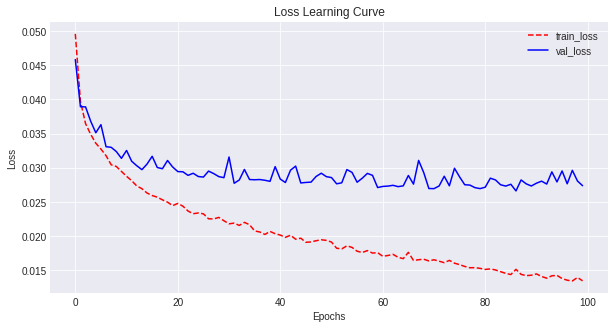

Test  Loss: 0.0249
Kappa List: [0.6435 0.4646 0.5691 0.7952 0.6574 0.7529 0.6408 0.4449]
Test Quadratic Cohen Kappa Score (per essay set): 0.6211
Test Quadratic Cohen Kappa Score (all essay set): 0.9706

			 -------- Fold 5 --------
Total Training Time: 44.6 seconds
Train Loss: 0.02
Val   Loss: 0.0285


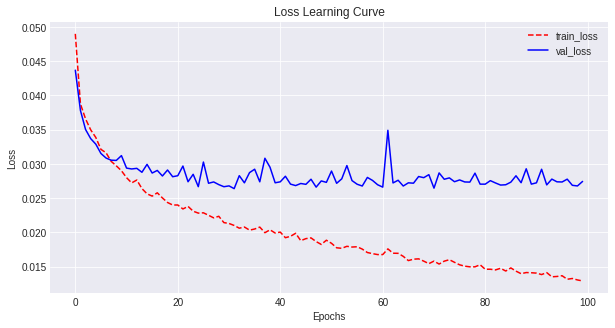

Test  Loss: 0.027
Kappa List: [0.6386 0.559  0.591  0.7314 0.6896 0.7764 0.619  0.4836]
Test Quadratic Cohen Kappa Score (per essay set): 0.6361
Test Quadratic Cohen Kappa Score (all essay set): 0.9758


			Average Results:
Train Loss: 0.0202
Val   Loss: 0.0293
Test  Loss: 0.0264
QCK Score (per essay set): 0.6142
QCK Score (all essay set): 0.9692


In [0]:
# try with different dimensions and units - batch_size = 128, epochs = 100, drate = 0.0
'''
    BEST COMBO: Units = 128, Dim = 200 --> Dimension 200 performed well throughout with 300 slightly lagging behind
Per Set Score: 0.6169
All Set Score: 0.9678

   ANOTHER BEST COMBO: Units = 256, Dim = 300 [but lots of overfitting]
Per Set Score: 0.6201
All Set Score: 0.9686
'''
dim_list = [50, 100, 200, 300, 500]
units_list = [128, 256]
for units in units_list:
    for dim in dim_list:
        print('\n\n\t\t\tUnits:', units, '\tDimension:', dim)
        cross_val_eval(dim=dim, units=units, drate=0.0, batch_size=128, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)



			Dropout Rate: 0.0


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 41.45 seconds
Train Loss: 0.0223
Val   Loss: 0.0289


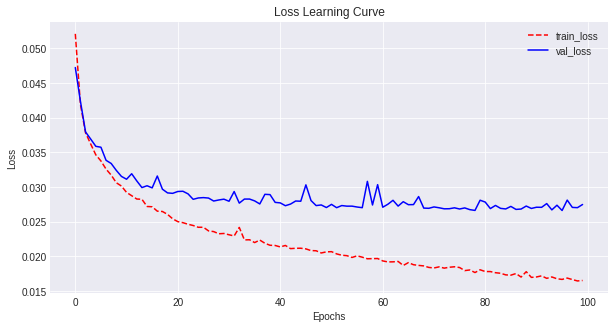

Test  Loss: 0.0267
Kappa List: [0.6407 0.4118 0.5234 0.7133 0.712  0.8191 0.7004 0.3803]
Test Quadratic Cohen Kappa Score (per essay set): 0.6126
Test Quadratic Cohen Kappa Score (all essay set): 0.9718

			 -------- Fold 2 --------
Total Training Time: 40.64 seconds
Train Loss: 0.0232
Val   Loss: 0.0306


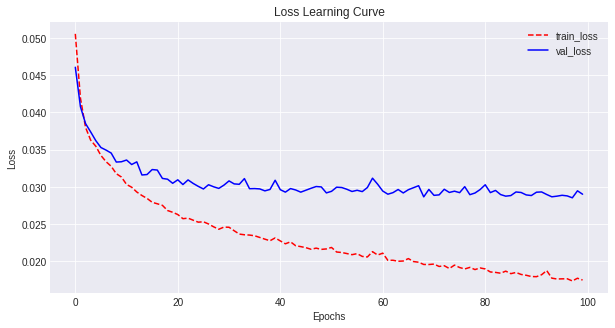

Test  Loss: 0.0256
Kappa List: [0.5275 0.4682 0.5881 0.7066 0.7198 0.6979 0.6013 0.2182]
Test Quadratic Cohen Kappa Score (per essay set): 0.566
Test Quadratic Cohen Kappa Score (all essay set): 0.9536

			 -------- Fold 3 --------
Total Training Time: 41.23 seconds
Train Loss: 0.0232
Val   Loss: 0.0291


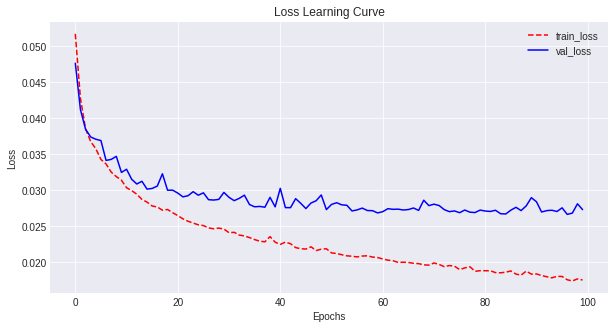

Test  Loss: 0.0259
Kappa List: [0.5975 0.5669 0.5355 0.762  0.6791 0.7625 0.6404 0.4264]
Test Quadratic Cohen Kappa Score (per essay set): 0.6213
Test Quadratic Cohen Kappa Score (all essay set): 0.9686

			 -------- Fold 4 --------
Total Training Time: 41.14 seconds
Train Loss: 0.0233
Val   Loss: 0.0297


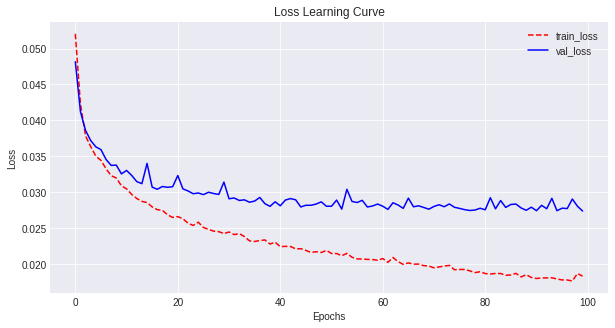

Test  Loss: 0.0253
Kappa List: [0.6304 0.4685 0.5518 0.778  0.6366 0.7339 0.6433 0.4315]
Test Quadratic Cohen Kappa Score (per essay set): 0.6092
Test Quadratic Cohen Kappa Score (all essay set): 0.9681

			 -------- Fold 5 --------
Total Training Time: 40.7 seconds
Train Loss: 0.0228
Val   Loss: 0.0284


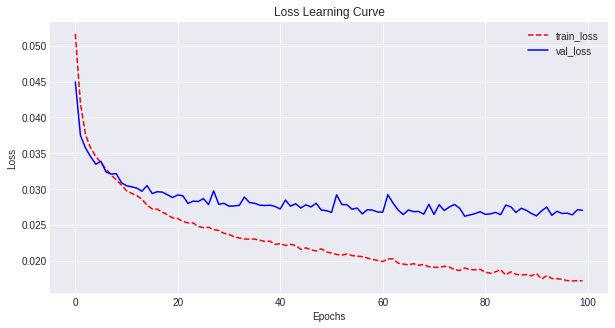

Test  Loss: 0.0276
Kappa List: [0.5898 0.5616 0.5737 0.7081 0.6559 0.7535 0.5942 0.4646]
Test Quadratic Cohen Kappa Score (per essay set): 0.6127
Test Quadratic Cohen Kappa Score (all essay set): 0.9731


			Average Results:
Train Loss: 0.023
Val   Loss: 0.0293
Test  Loss: 0.0262
QCK Score (per essay set): 0.6044
QCK Score (all essay set): 0.967


			Dropout Rate: 0.1


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.81 seconds
Train Loss: 0.0235
Val   Loss: 0.0284


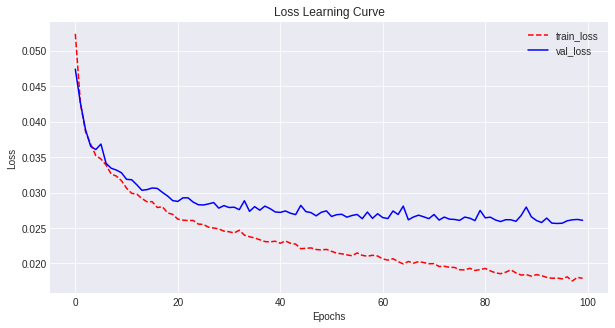

Test  Loss: 0.0269
Kappa List: [0.6409 0.4    0.5402 0.726  0.7045 0.7899 0.6867 0.4   ]
Test Quadratic Cohen Kappa Score (per essay set): 0.611
Test Quadratic Cohen Kappa Score (all essay set): 0.9715

			 -------- Fold 2 --------
Total Training Time: 41.14 seconds
Train Loss: 0.0237
Val   Loss: 0.0302


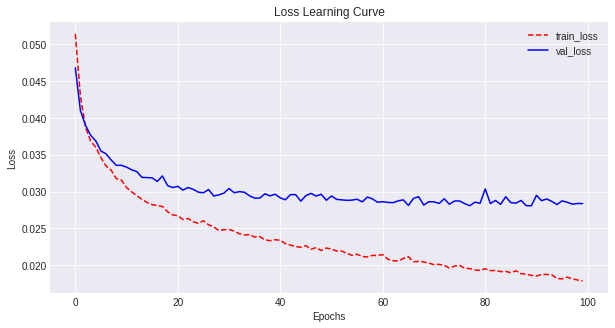

Test  Loss: 0.0253
Kappa List: [0.4273 0.4866 0.6261 0.7062 0.7186 0.6667 0.5538 0.2792]
Test Quadratic Cohen Kappa Score (per essay set): 0.5581
Test Quadratic Cohen Kappa Score (all essay set): 0.9598

			 -------- Fold 3 --------
Total Training Time: 40.68 seconds
Train Loss: 0.0246
Val   Loss: 0.0295


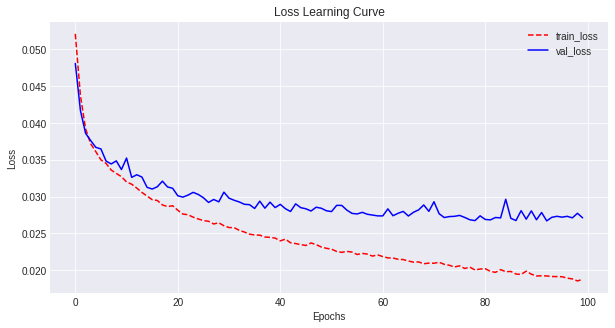

Test  Loss: 0.0247
Kappa List: [0.6294 0.5789 0.5698 0.7554 0.6666 0.7437 0.6573 0.4646]
Test Quadratic Cohen Kappa Score (per essay set): 0.6332
Test Quadratic Cohen Kappa Score (all essay set): 0.9711

			 -------- Fold 4 --------
Total Training Time: 40.68 seconds
Train Loss: 0.0243
Val   Loss: 0.0299


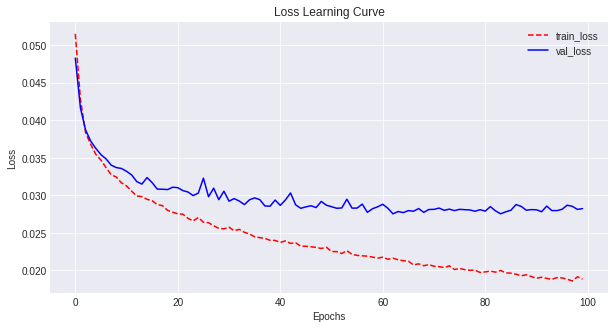

Test  Loss: 0.0253
Kappa List: [0.6714 0.4209 0.5673 0.7785 0.5784 0.7402 0.686  0.4585]
Test Quadratic Cohen Kappa Score (per essay set): 0.6126
Test Quadratic Cohen Kappa Score (all essay set): 0.9716

			 -------- Fold 5 --------
Total Training Time: 41.9 seconds
Train Loss: 0.0235
Val   Loss: 0.0279


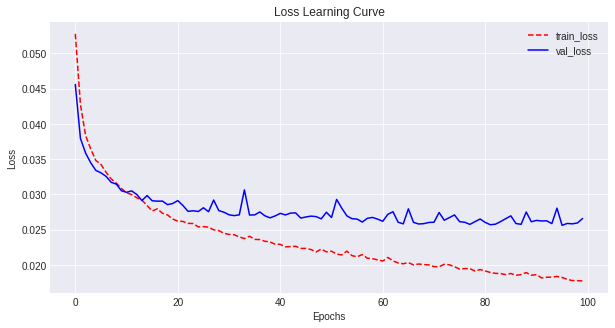

Test  Loss: 0.0278
Kappa List: [0.6378 0.5753 0.557  0.7074 0.6926 0.7642 0.6156 0.4312]
Test Quadratic Cohen Kappa Score (per essay set): 0.6226
Test Quadratic Cohen Kappa Score (all essay set): 0.9731


			Average Results:
Train Loss: 0.0239
Val   Loss: 0.0292
Test  Loss: 0.026
QCK Score (per essay set): 0.6075
QCK Score (all essay set): 0.9694


			Dropout Rate: 0.2


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.29 seconds
Train Loss: 0.0247
Val   Loss: 0.0293


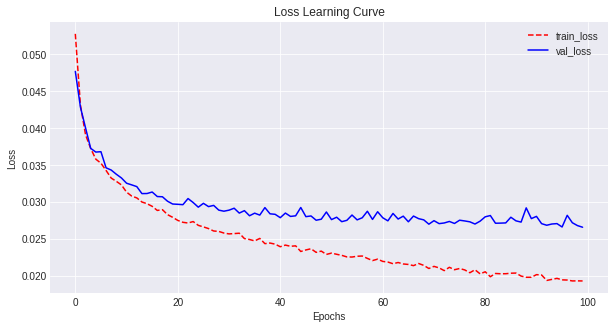

Test  Loss: 0.0269
Kappa List: [0.5992 0.3562 0.4938 0.7281 0.7078 0.7836 0.6289 0.3837]
Test Quadratic Cohen Kappa Score (per essay set): 0.5852
Test Quadratic Cohen Kappa Score (all essay set): 0.9711

			 -------- Fold 2 --------
Total Training Time: 42.26 seconds
Train Loss: 0.0249
Val   Loss: 0.0304


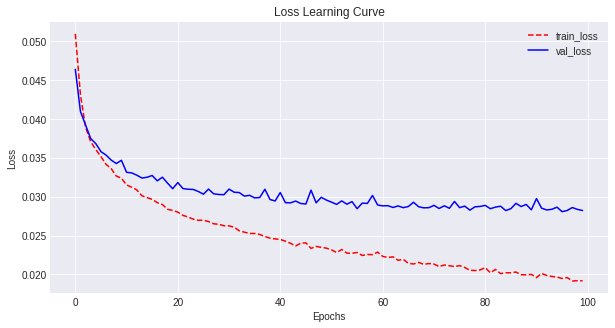

Test  Loss: 0.0253
Kappa List: [0.506  0.5104 0.6106 0.7124 0.7304 0.6714 0.6124 0.3104]
Test Quadratic Cohen Kappa Score (per essay set): 0.583
Test Quadratic Cohen Kappa Score (all essay set): 0.9632

			 -------- Fold 3 --------
Total Training Time: 41.02 seconds
Train Loss: 0.0252
Val   Loss: 0.0296


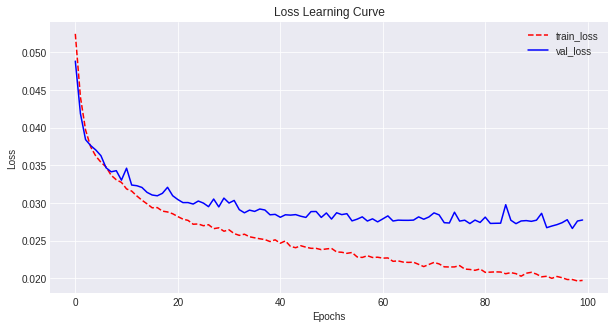

Test  Loss: 0.0248
Kappa List: [0.6674 0.5426 0.5359 0.7584 0.6798 0.7674 0.6269 0.454 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6291
Test Quadratic Cohen Kappa Score (all essay set): 0.9708

			 -------- Fold 4 --------
Total Training Time: 41.9 seconds
Train Loss: 0.0251
Val   Loss: 0.0296


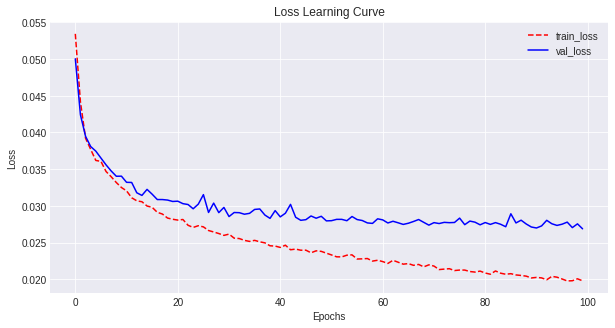

Test  Loss: 0.0248
Kappa List: [0.6574 0.4534 0.567  0.796  0.6363 0.7307 0.6668 0.4684]
Test Quadratic Cohen Kappa Score (per essay set): 0.622
Test Quadratic Cohen Kappa Score (all essay set): 0.9714

			 -------- Fold 5 --------
Total Training Time: 41.07 seconds
Train Loss: 0.0247
Val   Loss: 0.0288


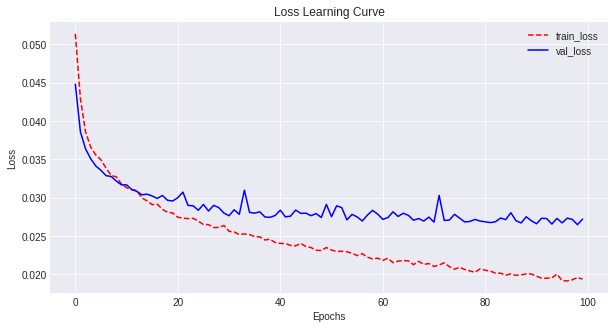

Test  Loss: 0.0274
Kappa List: [0.601  0.5654 0.5605 0.6966 0.6175 0.771  0.5682 0.4328]
Test Quadratic Cohen Kappa Score (per essay set): 0.6016
Test Quadratic Cohen Kappa Score (all essay set): 0.971


			Average Results:
Train Loss: 0.0249
Val   Loss: 0.0295
Test  Loss: 0.0258
QCK Score (per essay set): 0.6042
QCK Score (all essay set): 0.9695


			Dropout Rate: 0.3


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.68 seconds
Train Loss: 0.0254
Val   Loss: 0.0295


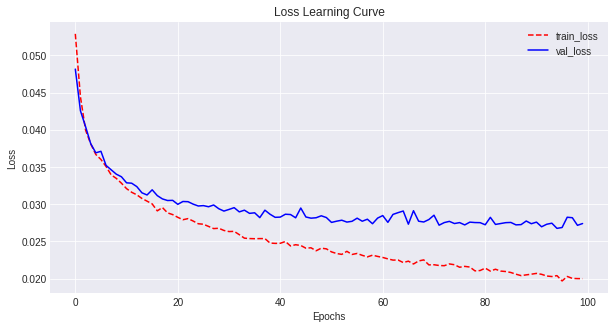

Test  Loss: 0.0273
Kappa List: [0.6247 0.3339 0.5038 0.7249 0.6757 0.7705 0.6403 0.3683]
Test Quadratic Cohen Kappa Score (per essay set): 0.5803
Test Quadratic Cohen Kappa Score (all essay set): 0.9711

			 -------- Fold 2 --------
Total Training Time: 41.11 seconds
Train Loss: 0.0257
Val   Loss: 0.0309


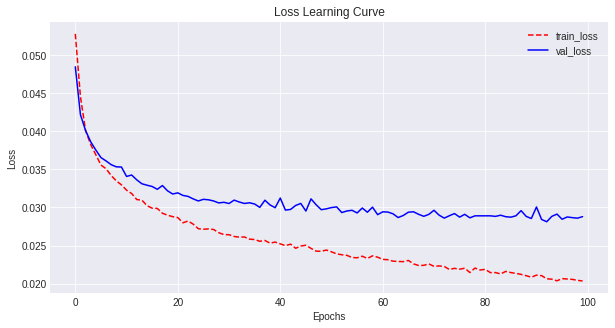

Test  Loss: 0.0259
Kappa List: [0.422  0.4371 0.5874 0.7003 0.7312 0.6514 0.6261 0.2303]
Test Quadratic Cohen Kappa Score (per essay set): 0.5482
Test Quadratic Cohen Kappa Score (all essay set): 0.9554

			 -------- Fold 3 --------
Total Training Time: 41.06 seconds
Train Loss: 0.0263
Val   Loss: 0.0301


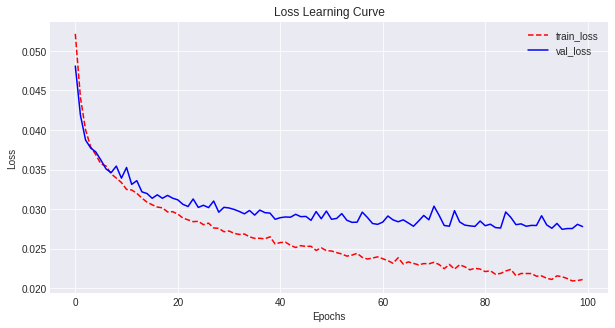

Test  Loss: 0.0247
Kappa List: [0.6791 0.5452 0.5474 0.7403 0.6763 0.7276 0.6263 0.3924]
Test Quadratic Cohen Kappa Score (per essay set): 0.6168
Test Quadratic Cohen Kappa Score (all essay set): 0.9661

			 -------- Fold 4 --------
Total Training Time: 41.91 seconds
Train Loss: 0.0256
Val   Loss: 0.0297


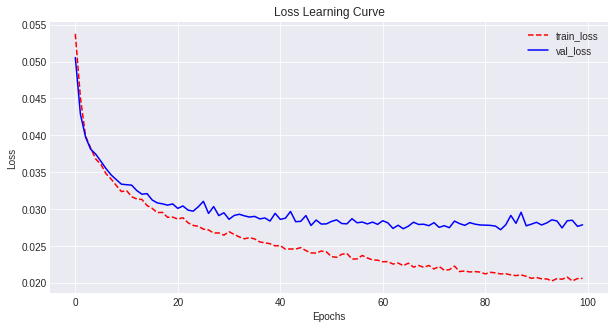

Test  Loss: 0.025
Kappa List: [0.6364 0.4323 0.5238 0.7744 0.6097 0.7305 0.6379 0.4837]
Test Quadratic Cohen Kappa Score (per essay set): 0.6036
Test Quadratic Cohen Kappa Score (all essay set): 0.9713

			 -------- Fold 5 --------
Total Training Time: 41.34 seconds
Train Loss: 0.0256
Val   Loss: 0.0291


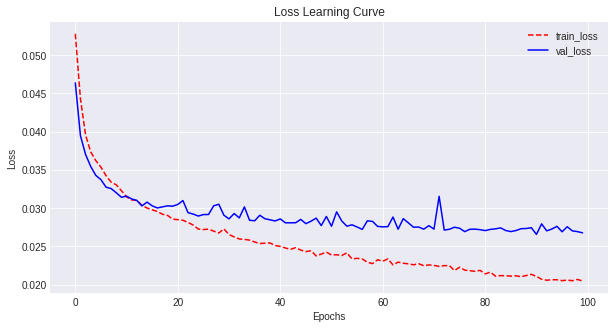

Test  Loss: 0.0276
Kappa List: [0.5996 0.5591 0.5219 0.7048 0.6473 0.7518 0.5843 0.4564]
Test Quadratic Cohen Kappa Score (per essay set): 0.6031
Test Quadratic Cohen Kappa Score (all essay set): 0.972


			Average Results:
Train Loss: 0.0257
Val   Loss: 0.0299
Test  Loss: 0.0261
QCK Score (per essay set): 0.5904
QCK Score (all essay set): 0.9672


			Dropout Rate: 0.4


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.72 seconds
Train Loss: 0.0268
Val   Loss: 0.0298


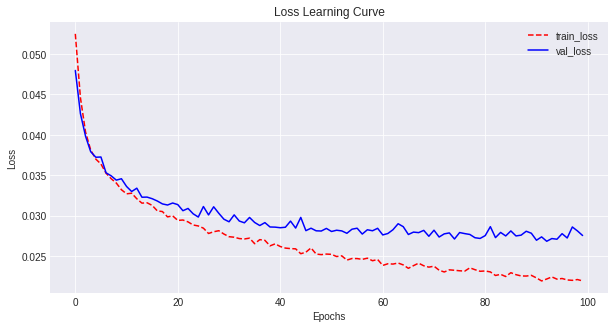

Test  Loss: 0.0283
Kappa List: [0.5961 0.314  0.4721 0.722  0.6433 0.7441 0.6362 0.3568]
Test Quadratic Cohen Kappa Score (per essay set): 0.5606
Test Quadratic Cohen Kappa Score (all essay set): 0.9692

			 -------- Fold 2 --------
Total Training Time: 40.71 seconds
Train Loss: 0.0269
Val   Loss: 0.0313


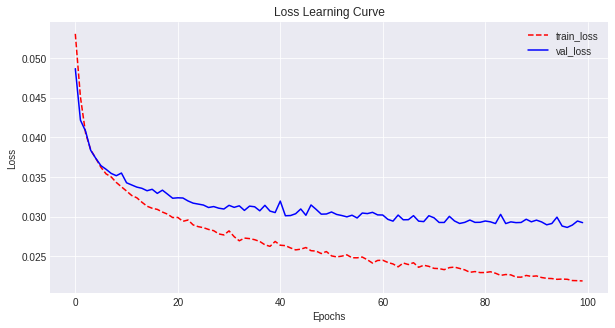

Test  Loss: 0.026
Kappa List: [0.4967 0.3869 0.605  0.7079 0.7113 0.6446 0.6256 0.2669]
Test Quadratic Cohen Kappa Score (per essay set): 0.5556
Test Quadratic Cohen Kappa Score (all essay set): 0.9594

			 -------- Fold 3 --------
Total Training Time: 41.13 seconds
Train Loss: 0.027
Val   Loss: 0.03


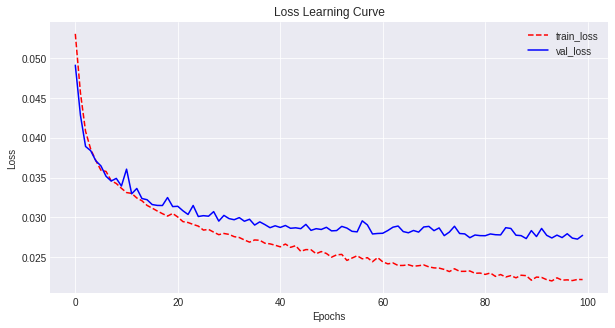

Test  Loss: 0.0251
Kappa List: [0.6766 0.5077 0.5605 0.7457 0.6609 0.7261 0.5808 0.4067]
Test Quadratic Cohen Kappa Score (per essay set): 0.6081
Test Quadratic Cohen Kappa Score (all essay set): 0.9668

			 -------- Fold 4 --------
Total Training Time: 40.93 seconds
Train Loss: 0.0269
Val   Loss: 0.03


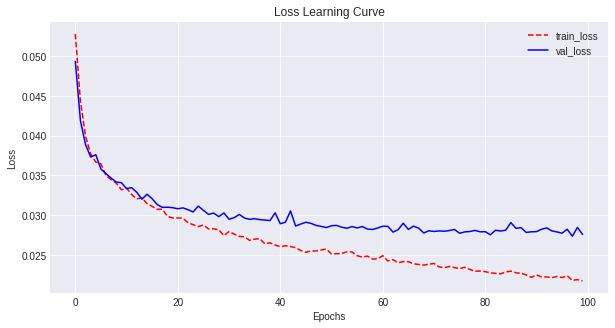

Test  Loss: 0.025
Kappa List: [0.6662 0.4073 0.5467 0.7896 0.6158 0.7449 0.6733 0.4739]
Test Quadratic Cohen Kappa Score (per essay set): 0.6147
Test Quadratic Cohen Kappa Score (all essay set): 0.9714

			 -------- Fold 5 --------
Total Training Time: 41.26 seconds
Train Loss: 0.027
Val   Loss: 0.0289


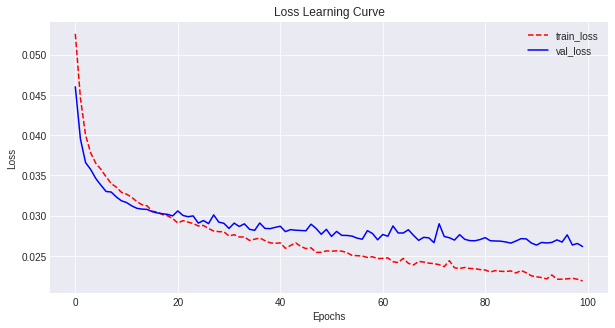

Test  Loss: 0.028
Kappa List: [0.5683 0.5926 0.5225 0.6853 0.6371 0.7033 0.5612 0.3878]
Test Quadratic Cohen Kappa Score (per essay set): 0.5823
Test Quadratic Cohen Kappa Score (all essay set): 0.9702


			Average Results:
Train Loss: 0.0269
Val   Loss: 0.03
Test  Loss: 0.0265
QCK Score (per essay set): 0.5843
QCK Score (all essay set): 0.9674


			Dropout Rate: 0.5


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.68 seconds
Train Loss: 0.0282
Val   Loss: 0.0303


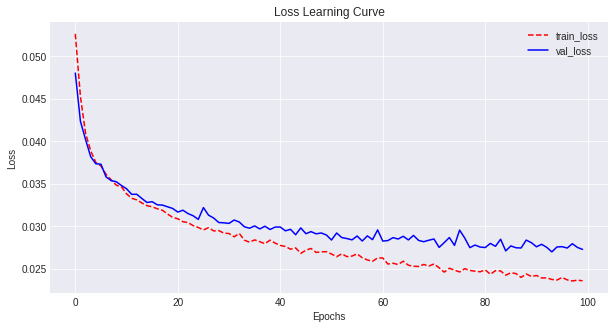

Test  Loss: 0.0281
Kappa List: [0.5153 0.3443 0.4788 0.728  0.6689 0.7471 0.6092 0.3647]
Test Quadratic Cohen Kappa Score (per essay set): 0.557
Test Quadratic Cohen Kappa Score (all essay set): 0.9692

			 -------- Fold 2 --------
Total Training Time: 40.81 seconds
Train Loss: 0.0289
Val   Loss: 0.0318


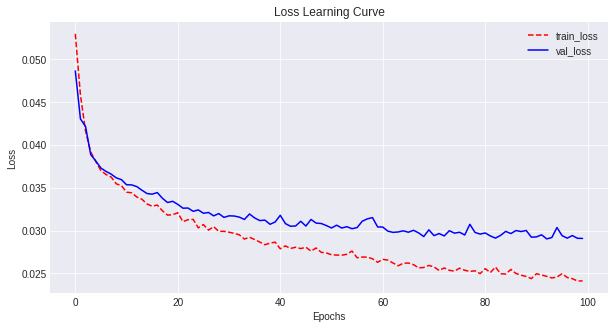

Test  Loss: 0.0267
Kappa List: [0.4845 0.4512 0.5584 0.6862 0.7102 0.6223 0.5828 0.2508]
Test Quadratic Cohen Kappa Score (per essay set): 0.5433
Test Quadratic Cohen Kappa Score (all essay set): 0.9557

			 -------- Fold 3 --------
Total Training Time: 41.07 seconds
Train Loss: 0.0288
Val   Loss: 0.031


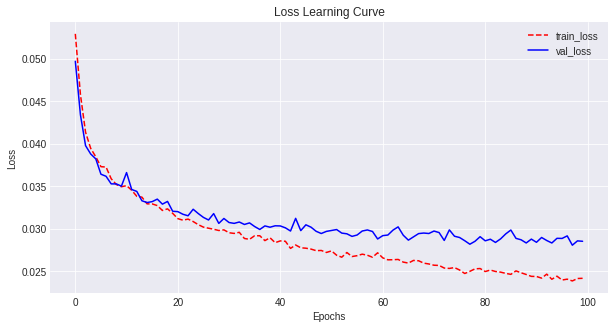

Test  Loss: 0.0257
Kappa List: [0.6832 0.5422 0.5252 0.7409 0.5945 0.7319 0.5262 0.4002]
Test Quadratic Cohen Kappa Score (per essay set): 0.593
Test Quadratic Cohen Kappa Score (all essay set): 0.9656

			 -------- Fold 4 --------
Total Training Time: 41.34 seconds
Train Loss: 0.0285
Val   Loss: 0.0308


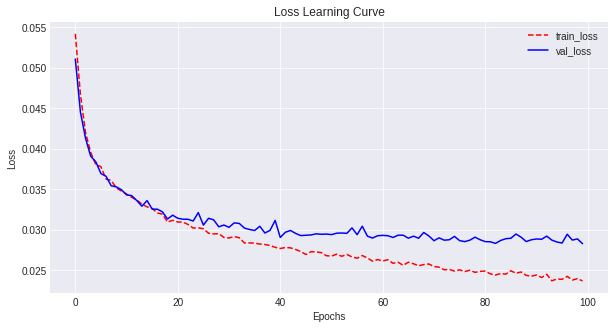

Test  Loss: 0.0258
Kappa List: [0.7083 0.3961 0.5233 0.7716 0.6037 0.7386 0.6746 0.4923]
Test Quadratic Cohen Kappa Score (per essay set): 0.6136
Test Quadratic Cohen Kappa Score (all essay set): 0.9706

			 -------- Fold 5 --------
Total Training Time: 40.53 seconds
Train Loss: 0.028
Val   Loss: 0.0295


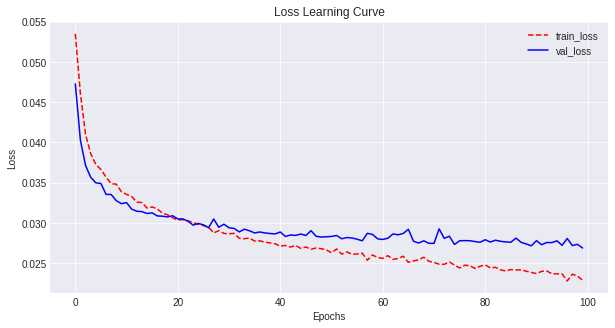

Test  Loss: 0.0284
Kappa List: [0.547  0.5361 0.5019 0.687  0.6575 0.71   0.5281 0.4967]
Test Quadratic Cohen Kappa Score (per essay set): 0.583
Test Quadratic Cohen Kappa Score (all essay set): 0.9709


			Average Results:
Train Loss: 0.0285
Val   Loss: 0.0307
Test  Loss: 0.0269
QCK Score (per essay set): 0.578
QCK Score (all essay set): 0.9664


In [0]:
# try different dropout rates with 64 units and 200 dimensions
'''
    BEST COMBO: Dropout Rate = 0.1 (but Dropout of 0.0 -- 0.6044) -- maybe use 0.0??
Per Set Score: 0.6075
All Set Score: 0.9694
'''
drate_list = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
for drate in drate_list:
    print('\n\n\t\t\tDropout Rate:', drate)
    cross_val_eval(dim=200, units=64, drate=drate, batch_size=128, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)



			Dropout Rate: 0.0


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.71 seconds
Train Loss: 0.0209
Val   Loss: 0.0284


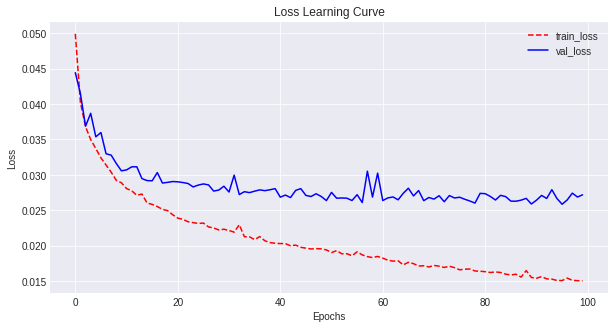

Test  Loss: 0.0269
Kappa List: [0.614  0.4555 0.5419 0.7268 0.7077 0.7961 0.6916 0.4297]
Test Quadratic Cohen Kappa Score (per essay set): 0.6204
Test Quadratic Cohen Kappa Score (all essay set): 0.9727

			 -------- Fold 2 --------
Total Training Time: 40.93 seconds
Train Loss: 0.0208
Val   Loss: 0.0297


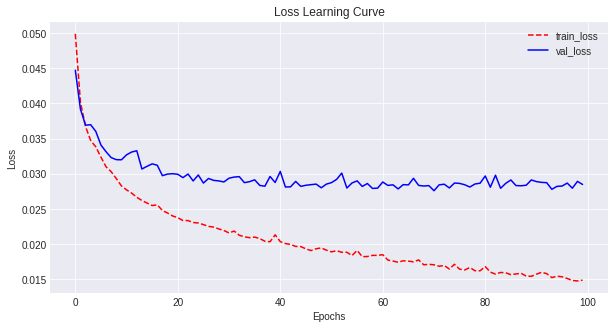

Test  Loss: 0.0243
Kappa List: [0.5226 0.4643 0.6346 0.7389 0.7757 0.7465 0.6398 0.2189]
Test Quadratic Cohen Kappa Score (per essay set): 0.5927
Test Quadratic Cohen Kappa Score (all essay set): 0.9557

			 -------- Fold 3 --------
Total Training Time: 40.71 seconds
Train Loss: 0.021
Val   Loss: 0.0284


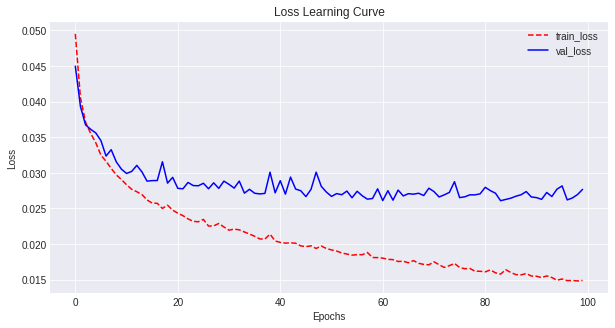

Test  Loss: 0.0257
Kappa List: [0.505  0.6025 0.5464 0.7519 0.7042 0.7173 0.6423 0.4063]
Test Quadratic Cohen Kappa Score (per essay set): 0.6095
Test Quadratic Cohen Kappa Score (all essay set): 0.9675

			 -------- Fold 4 --------
Total Training Time: 40.63 seconds
Train Loss: 0.0209
Val   Loss: 0.0287


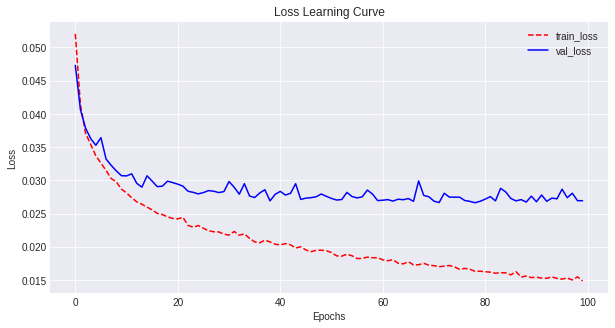

Test  Loss: 0.0248
Kappa List: [0.6512 0.4543 0.5855 0.7773 0.6346 0.7619 0.6648 0.4897]
Test Quadratic Cohen Kappa Score (per essay set): 0.6274
Test Quadratic Cohen Kappa Score (all essay set): 0.972

			 -------- Fold 5 --------
Total Training Time: 40.4 seconds
Train Loss: 0.0208
Val   Loss: 0.0275


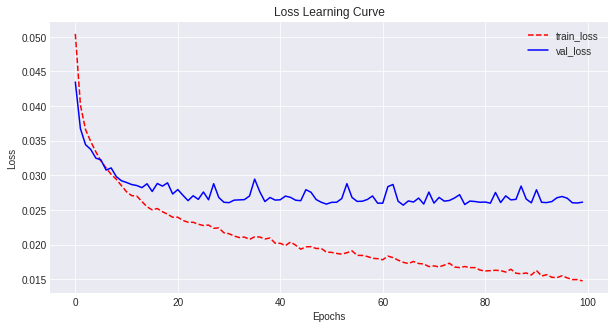

Test  Loss: 0.0264
Kappa List: [0.6413 0.5864 0.5757 0.7296 0.6886 0.7654 0.6231 0.4281]
Test Quadratic Cohen Kappa Score (per essay set): 0.6298
Test Quadratic Cohen Kappa Score (all essay set): 0.9737


			Average Results:
Train Loss: 0.0209
Val   Loss: 0.0286
Test  Loss: 0.0256
QCK Score (per essay set): 0.6159
QCK Score (all essay set): 0.9683


			Dropout Rate: 0.1


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 39.1 seconds
Train Loss: 0.0216
Val   Loss: 0.0282


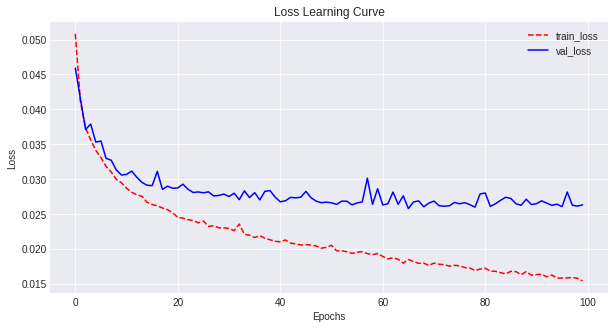

Test  Loss: 0.0263
Kappa List: [0.6353 0.4485 0.5435 0.7185 0.7163 0.7827 0.6576 0.4059]
Test Quadratic Cohen Kappa Score (per essay set): 0.6135
Test Quadratic Cohen Kappa Score (all essay set): 0.9712

			 -------- Fold 2 --------
Total Training Time: 41.15 seconds
Train Loss: 0.0217
Val   Loss: 0.0294


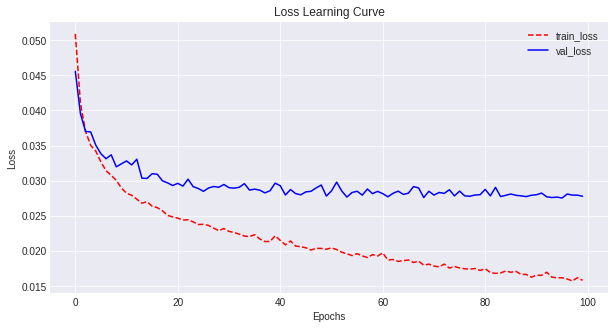

Test  Loss: 0.0242
Kappa List: [0.4954 0.5102 0.6153 0.7249 0.7579 0.7489 0.5855 0.322 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.595
Test Quadratic Cohen Kappa Score (all essay set): 0.9633

			 -------- Fold 3 --------
Total Training Time: 40.55 seconds
Train Loss: 0.0221
Val   Loss: 0.0284


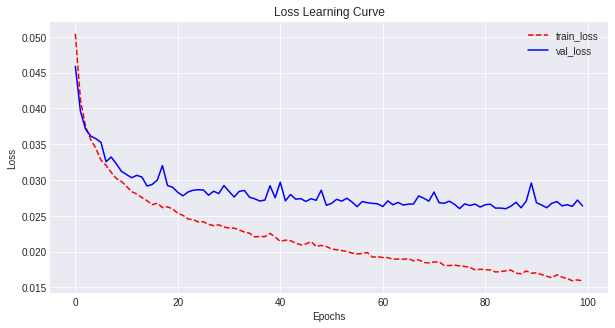

Test  Loss: 0.0247
Kappa List: [0.5739 0.5763 0.5702 0.7589 0.7244 0.7485 0.6267 0.375 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6193
Test Quadratic Cohen Kappa Score (all essay set): 0.9655

			 -------- Fold 4 --------
Total Training Time: 40.34 seconds
Train Loss: 0.022
Val   Loss: 0.0284


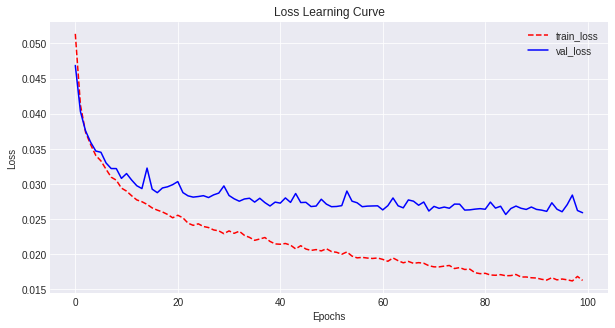

Test  Loss: 0.0241
Kappa List: [0.6418 0.4244 0.5914 0.7859 0.6575 0.7485 0.6781 0.5335]
Test Quadratic Cohen Kappa Score (per essay set): 0.6327
Test Quadratic Cohen Kappa Score (all essay set): 0.9733

			 -------- Fold 5 --------
Total Training Time: 40.27 seconds
Train Loss: 0.0218
Val   Loss: 0.0277


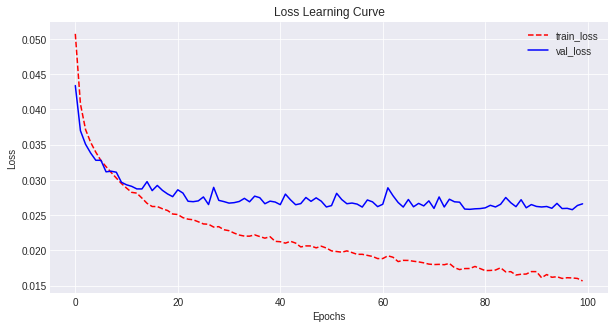

Test  Loss: 0.027
Kappa List: [0.6347 0.5815 0.5591 0.712  0.6622 0.7874 0.592  0.414 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6179
Test Quadratic Cohen Kappa Score (all essay set): 0.9724


			Average Results:
Train Loss: 0.0219
Val   Loss: 0.0284
Test  Loss: 0.0253
QCK Score (per essay set): 0.6157
QCK Score (all essay set): 0.9692


			Dropout Rate: 0.2


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 40.92 seconds
Train Loss: 0.0227
Val   Loss: 0.028


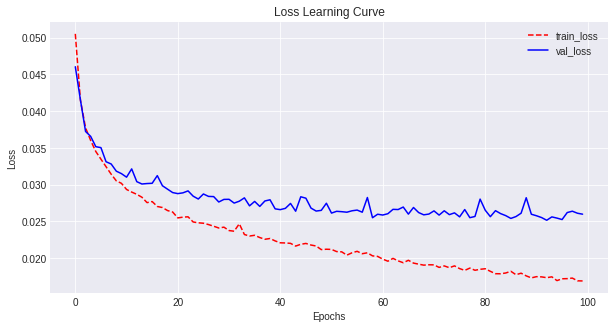

Test  Loss: 0.0268
Kappa List: [0.6399 0.387  0.5258 0.7272 0.6936 0.7842 0.6809 0.427 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6082
Test Quadratic Cohen Kappa Score (all essay set): 0.9717

			 -------- Fold 2 --------
Total Training Time: 41.04 seconds
Train Loss: 0.0228
Val   Loss: 0.0297


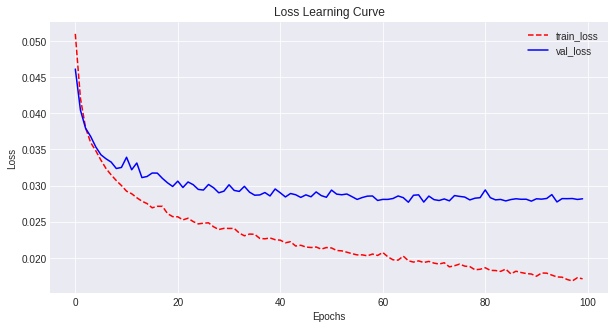

Test  Loss: 0.0245
Kappa List: [0.5009 0.5357 0.6379 0.7236 0.7429 0.7105 0.5956 0.2524]
Test Quadratic Cohen Kappa Score (per essay set): 0.5874
Test Quadratic Cohen Kappa Score (all essay set): 0.9602

			 -------- Fold 3 --------
Total Training Time: 42.82 seconds
Train Loss: 0.023
Val   Loss: 0.0285


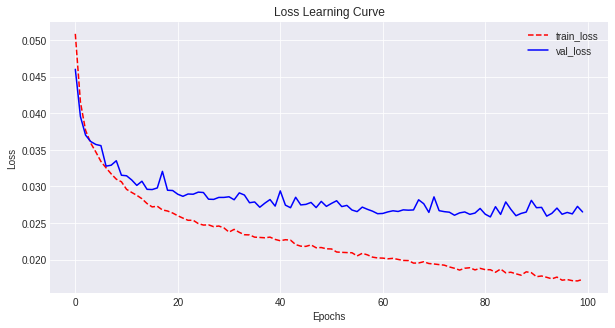

Test  Loss: 0.0248
Kappa List: [0.6217 0.568  0.5694 0.7535 0.673  0.7782 0.6386 0.406 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6261
Test Quadratic Cohen Kappa Score (all essay set): 0.9685

			 -------- Fold 4 --------
Total Training Time: 42.02 seconds
Train Loss: 0.0231
Val   Loss: 0.0287


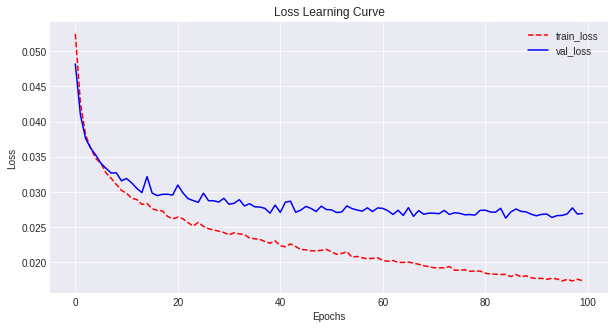

Test  Loss: 0.0242
Kappa List: [0.6884 0.3912 0.5728 0.8007 0.6566 0.759  0.6595 0.4853]
Test Quadratic Cohen Kappa Score (per essay set): 0.6267
Test Quadratic Cohen Kappa Score (all essay set): 0.9716

			 -------- Fold 5 --------
Total Training Time: 43.49 seconds
Train Loss: 0.0226
Val   Loss: 0.0276


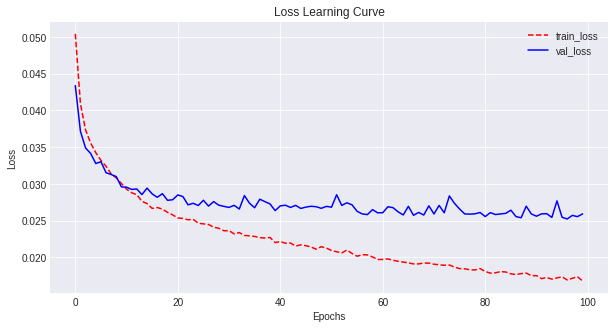

Test  Loss: 0.0272
Kappa List: [0.6286 0.5578 0.5621 0.7218 0.6674 0.7724 0.619  0.4795]
Test Quadratic Cohen Kappa Score (per essay set): 0.6261
Test Quadratic Cohen Kappa Score (all essay set): 0.9729


			Average Results:
Train Loss: 0.0228
Val   Loss: 0.0285
Test  Loss: 0.0255
QCK Score (per essay set): 0.6149
QCK Score (all essay set): 0.969


			Dropout Rate: 0.3


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 42.75 seconds
Train Loss: 0.0236
Val   Loss: 0.0283


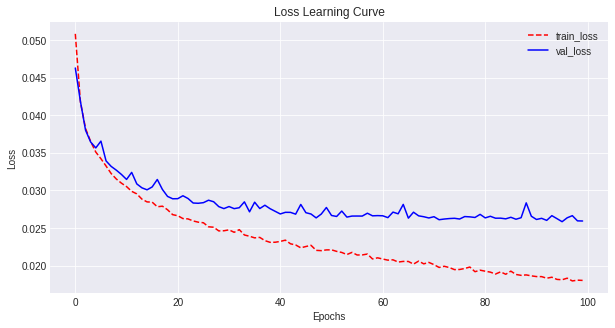

Test  Loss: 0.0272
Kappa List: [0.6291 0.4078 0.5145 0.7478 0.6668 0.7839 0.6821 0.3669]
Test Quadratic Cohen Kappa Score (per essay set): 0.5999
Test Quadratic Cohen Kappa Score (all essay set): 0.9712

			 -------- Fold 2 --------
Total Training Time: 42.67 seconds
Train Loss: 0.0237
Val   Loss: 0.0296


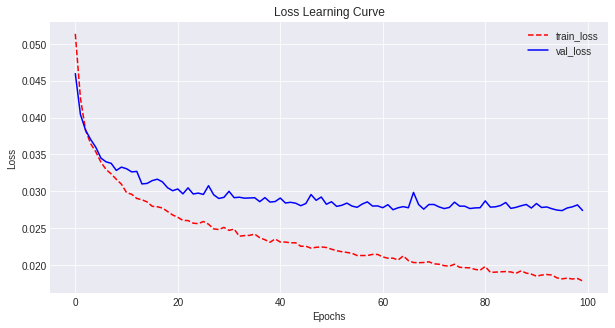

Test  Loss: 0.0249
Kappa List: [0.4395 0.4207 0.6277 0.6987 0.7392 0.7094 0.6439 0.2301]
Test Quadratic Cohen Kappa Score (per essay set): 0.5636
Test Quadratic Cohen Kappa Score (all essay set): 0.956

			 -------- Fold 3 --------
Total Training Time: 41.43 seconds
Train Loss: 0.0242
Val   Loss: 0.0288


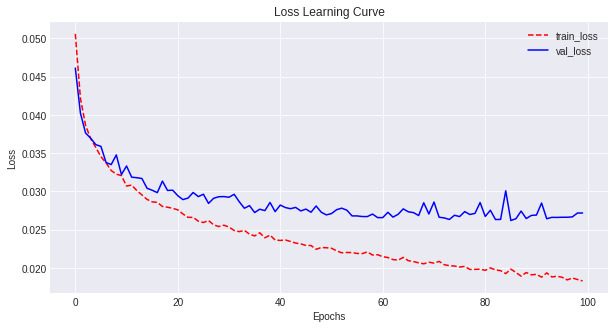

Test  Loss: 0.0244
Kappa List: [0.6421 0.5794 0.5729 0.7546 0.684  0.7337 0.6404 0.4038]
Test Quadratic Cohen Kappa Score (per essay set): 0.6264
Test Quadratic Cohen Kappa Score (all essay set): 0.9686

			 -------- Fold 4 --------
Total Training Time: 42.58 seconds
Train Loss: 0.0239
Val   Loss: 0.029


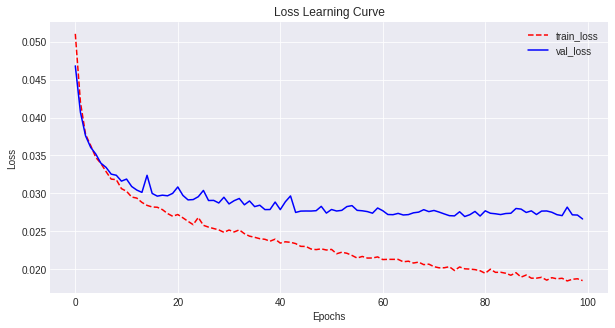

Test  Loss: 0.0241
Kappa List: [0.6561 0.3752 0.5473 0.7949 0.6766 0.738  0.6737 0.441 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6129
Test Quadratic Cohen Kappa Score (all essay set): 0.9712

			 -------- Fold 5 --------
Total Training Time: 40.83 seconds
Train Loss: 0.0233
Val   Loss: 0.0276


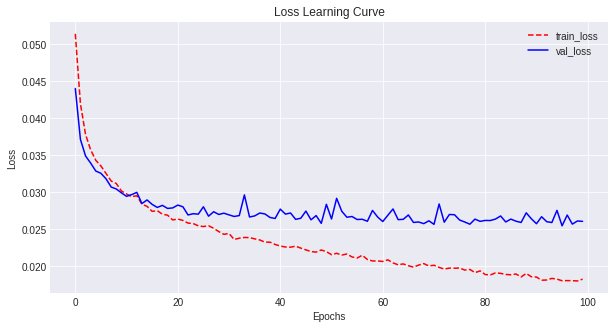

Test  Loss: 0.0269
Kappa List: [0.6273 0.5708 0.5535 0.6866 0.6287 0.7669 0.5944 0.4624]
Test Quadratic Cohen Kappa Score (per essay set): 0.6113
Test Quadratic Cohen Kappa Score (all essay set): 0.9729


			Average Results:
Train Loss: 0.0237
Val   Loss: 0.0287
Test  Loss: 0.0255
QCK Score (per essay set): 0.6028
QCK Score (all essay set): 0.968


			Dropout Rate: 0.4


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 41.8 seconds
Train Loss: 0.0246
Val   Loss: 0.0288


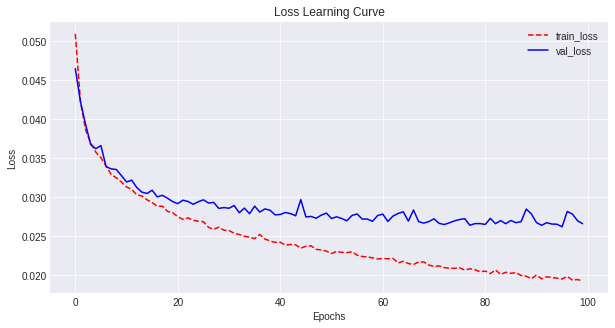

Test  Loss: 0.027
Kappa List: [0.6349 0.3524 0.523  0.7237 0.6872 0.7885 0.6551 0.3981]
Test Quadratic Cohen Kappa Score (per essay set): 0.5954
Test Quadratic Cohen Kappa Score (all essay set): 0.9699

			 -------- Fold 2 --------
Total Training Time: 42.93 seconds
Train Loss: 0.0248
Val   Loss: 0.0299


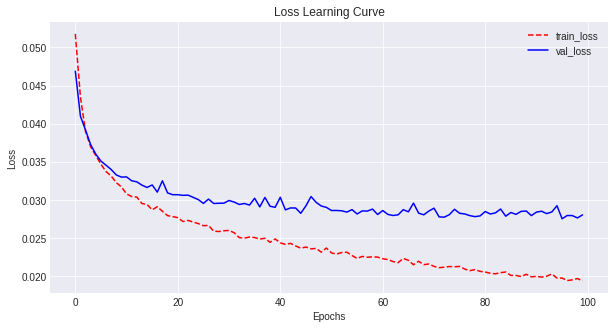

Test  Loss: 0.0254
Kappa List: [0.4493 0.4143 0.5928 0.717  0.7258 0.6778 0.6103 0.2947]
Test Quadratic Cohen Kappa Score (per essay set): 0.5603
Test Quadratic Cohen Kappa Score (all essay set): 0.9605

			 -------- Fold 3 --------
Total Training Time: 41.52 seconds
Train Loss: 0.0249
Val   Loss: 0.0289


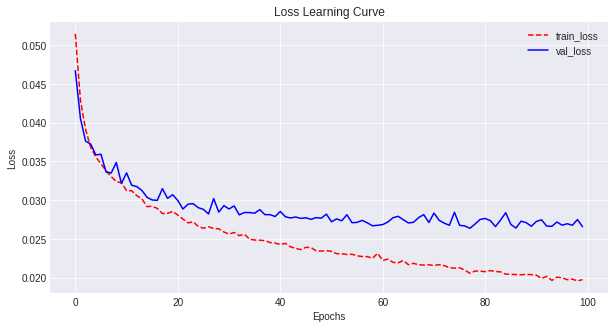

Test  Loss: 0.0245
Kappa List: [0.6646 0.585  0.5486 0.7591 0.672  0.7417 0.6432 0.3882]
Test Quadratic Cohen Kappa Score (per essay set): 0.6253
Test Quadratic Cohen Kappa Score (all essay set): 0.9678

			 -------- Fold 4 --------
Total Training Time: 42.04 seconds
Train Loss: 0.0248
Val   Loss: 0.0293


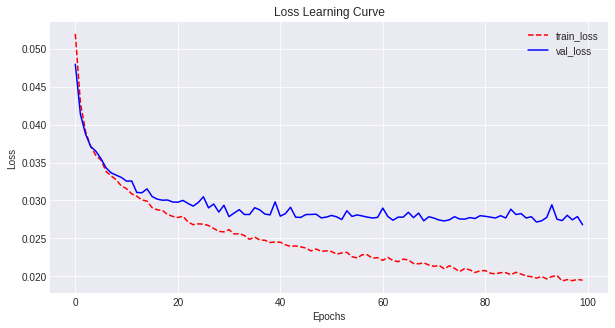

Test  Loss: 0.0241
Kappa List: [0.6472 0.3867 0.5334 0.7992 0.6235 0.7478 0.6649 0.5099]
Test Quadratic Cohen Kappa Score (per essay set): 0.6141
Test Quadratic Cohen Kappa Score (all essay set): 0.9721

			 -------- Fold 5 --------
Total Training Time: 42.55 seconds
Train Loss: 0.0246
Val   Loss: 0.0281


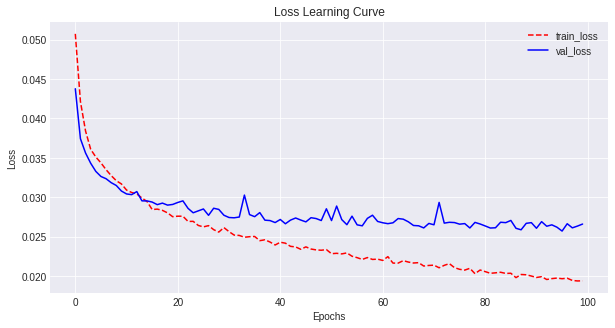

Test  Loss: 0.0277
Kappa List: [0.6196 0.5617 0.5509 0.6897 0.6565 0.7624 0.567  0.4645]
Test Quadratic Cohen Kappa Score (per essay set): 0.609
Test Quadratic Cohen Kappa Score (all essay set): 0.9716


			Average Results:
Train Loss: 0.0248
Val   Loss: 0.029
Test  Loss: 0.0258
QCK Score (per essay set): 0.6008
QCK Score (all essay set): 0.9684


			Dropout Rate: 0.5


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 41.44 seconds
Train Loss: 0.0261
Val   Loss: 0.029


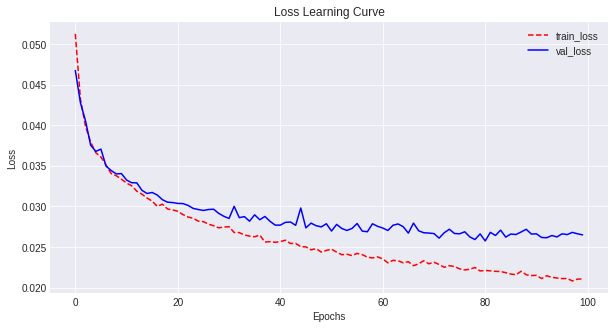

Test  Loss: 0.0275
Kappa List: [0.562  0.3252 0.4576 0.7022 0.6818 0.7804 0.6029 0.3623]
Test Quadratic Cohen Kappa Score (per essay set): 0.5593
Test Quadratic Cohen Kappa Score (all essay set): 0.9687

			 -------- Fold 2 --------
Total Training Time: 40.95 seconds
Train Loss: 0.0261
Val   Loss: 0.0306


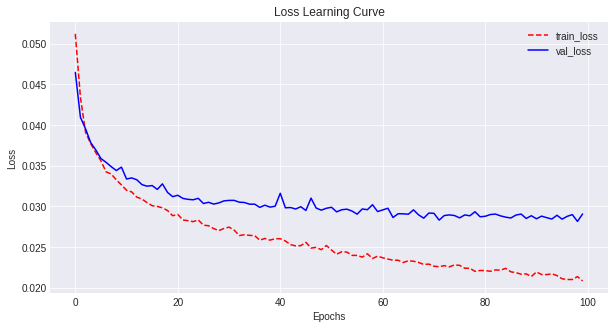

Test  Loss: 0.0252
Kappa List: [0.5191 0.4749 0.5959 0.7094 0.7303 0.6583 0.5816 0.2949]
Test Quadratic Cohen Kappa Score (per essay set): 0.5705
Test Quadratic Cohen Kappa Score (all essay set): 0.9599

			 -------- Fold 3 --------
Total Training Time: 41.47 seconds
Train Loss: 0.0265
Val   Loss: 0.0298


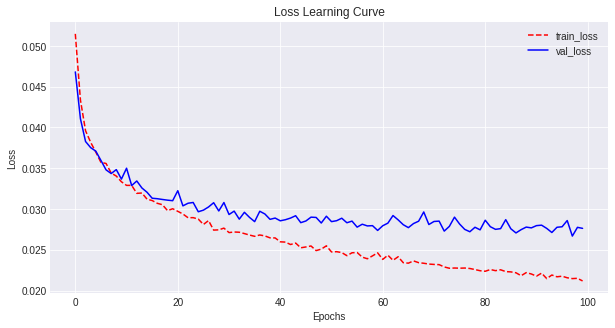

Test  Loss: 0.0248
Kappa List: [0.6818 0.5263 0.5388 0.7587 0.6389 0.7397 0.6132 0.3503]
Test Quadratic Cohen Kappa Score (per essay set): 0.606
Test Quadratic Cohen Kappa Score (all essay set): 0.9645

			 -------- Fold 4 --------
Total Training Time: 41.64 seconds
Train Loss: 0.0266
Val   Loss: 0.0297


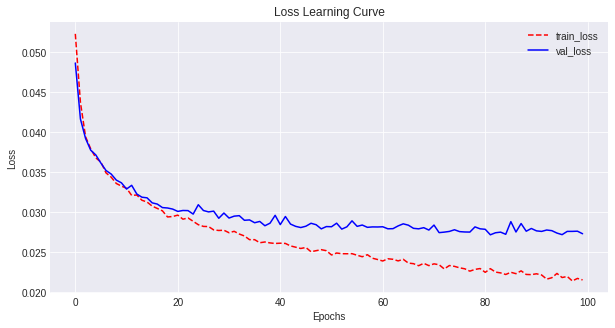

Test  Loss: 0.0249
Kappa List: [0.6842 0.414  0.519  0.7845 0.6296 0.7391 0.6819 0.4941]
Test Quadratic Cohen Kappa Score (per essay set): 0.6183
Test Quadratic Cohen Kappa Score (all essay set): 0.9719

			 -------- Fold 5 --------
Total Training Time: 40.82 seconds
Train Loss: 0.0259
Val   Loss: 0.0283


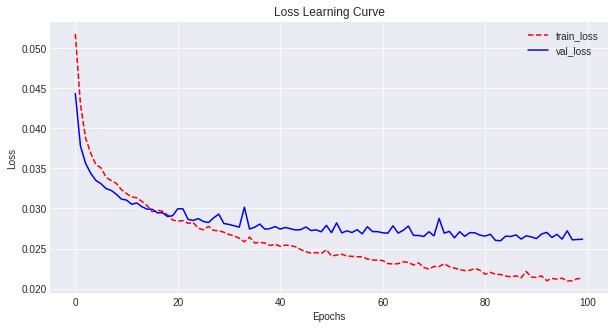

Test  Loss: 0.0274
Kappa List: [0.6013 0.5417 0.5407 0.7057 0.6625 0.7472 0.566  0.5105]
Test Quadratic Cohen Kappa Score (per essay set): 0.6095
Test Quadratic Cohen Kappa Score (all essay set): 0.9725


			Average Results:
Train Loss: 0.0262
Val   Loss: 0.0295
Test  Loss: 0.026
QCK Score (per essay set): 0.5927
QCK Score (all essay set): 0.9675


In [0]:
# try different dropout rates with 128 units and 200 dimensions
'''
    BEST COMBO: Dropout Rate = 0.0 -- results still slightly less than previous iteration as below
Per Set Score: 0.6169
All Set Score: 0.9678
'''
drate_list = [0.0, 0.1, 0.2, 0.3, 0.4, 0.5]
for drate in drate_list:
    print('\n\n\t\t\tDropout Rate:', drate)
    cross_val_eval(dim=200, units=128, drate=drate, batch_size=128, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)

In [0]:
# try different batch size and epoch for: units=128, dim=200, drate=0.0
'''
    BEST COMBO: Batch Size=32, Epochs=100
Per Set Score: 0.6278
All Set Score: 0.9709
'''
batch_size_list = [32, 64, 128, 256]
epochs_list = [50, 75, 100]
for batch_size in batch_size_list:
    for epochs in epochs_list:
        print('\n\n\t\t\tBatch Size:', batch_size, '\tEpochs:', epochs)
        cross_val_eval(dim=200, units=128, drate=0.0, batch_size=batch_size, epochs=epochs, val_size=0.1, verbose=0, callbacks_list=None, isPlot=False)



			Batch Size: 32 	Epochs: 50


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 70.39 seconds
Train Loss: 0.0227
Val   Loss: 0.0293
Test  Loss: 0.0273
Kappa List: [0.639  0.4568 0.5232 0.7032 0.7045 0.788  0.6608 0.3915]
Test Quadratic Cohen Kappa Score (per essay set): 0.6084
Test Quadratic Cohen Kappa Score (all essay set): 0.9699
Test Spearman Correlation Score  (all essay set): 0.9378

			 -------- Fold 2 --------
Total Training Time: 70.19 seconds
Train Loss: 0.0231
Val   Loss: 0.031
Test  Loss: 0.0259
Kappa List: [0.491  0.5143 0.6067 0.7056 0.742  0.7153 0.5969 0.2876]
Test Quadratic Cohen Kappa Score (per essay set): 0.5824
Test Quadratic Cohen Kappa Score (all essay set): 0.9592
Test Spearman Correlation Score  (all essay set): 0.9394

	

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 105.46 seconds
Train Loss: 0.0204
Val   Loss: 0.0287
Test  Loss: 0.0283
Kappa List: [0.6118 0.4487 0.5318 0.7057 0.6849 0.7961 0.6417 0.4044]
Test Quadratic Cohen Kappa Score (per essay set): 0.6031
Test Quadratic Cohen Kappa Score (all essay set): 0.9721
Test Spearman Correlation Score  (all essay set): 0.9371

			 -------- Fold 2 --------
Total Training Time: 105.4 seconds
Train Loss: 0.0203
Val   Loss: 0.0304
Test  Loss: 0.0257
Kappa List: [0.5436 0.4932 0.6223 0.7317 0.7536 0.6769 0.5935 0.2953]
Test Quadratic Cohen Kappa Score (per essay set): 0.5888
Test Quadratic Cohen Kappa Score (all essay set): 0.962
Test Spearman Correlation Score  (all essay set): 0.9411



/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 137.94 seconds
Train Loss: 0.0184
Val   Loss: 0.0283
Test  Loss: 0.0289
Kappa List: [0.6367 0.5695 0.541  0.7128 0.696  0.795  0.687  0.429 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6334
Test Quadratic Cohen Kappa Score (all essay set): 0.973
Test Spearman Correlation Score  (all essay set): 0.9389

			 -------- Fold 2 --------
Total Training Time: 138.61 seconds
Train Loss: 0.0186
Val   Loss: 0.0304
Test  Loss: 0.0255
Kappa List: [0.6087 0.5748 0.6045 0.7311 0.7464 0.7437 0.6175 0.3117]
Test Quadratic Cohen Kappa Score (per essay set): 0.6173
Test Quadratic Cohen Kappa Score (all essay set): 0.964
Test Spearman Correlation Score  (all essay set): 0.9415



/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 36.63 seconds
Train Loss: 0.0231
Val   Loss: 0.0291
Test  Loss: 0.0269
Kappa List: [0.6399 0.3944 0.5677 0.7316 0.7225 0.7977 0.6573 0.3894]
Test Quadratic Cohen Kappa Score (per essay set): 0.6126
Test Quadratic Cohen Kappa Score (all essay set): 0.9711
Test Spearman Correlation Score  (all essay set): 0.9399

			 -------- Fold 2 --------
Total Training Time: 35.74 seconds
Train Loss: 0.0231
Val   Loss: 0.0305
Test  Loss: 0.0264
Kappa List: [0.5205 0.4454 0.6131 0.725  0.7495 0.7101 0.6212 0.263 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.581
Test Quadratic Cohen Kappa Score (all essay set): 0.959
Test Spearman Correlation Score  (all essay set): 0.9412

		

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 53.07 seconds
Train Loss: 0.0213
Val   Loss: 0.0285
Test  Loss: 0.027
Kappa List: [0.6114 0.3683 0.4973 0.7216 0.6963 0.8022 0.6655 0.4136]
Test Quadratic Cohen Kappa Score (per essay set): 0.597
Test Quadratic Cohen Kappa Score (all essay set): 0.9726
Test Spearman Correlation Score  (all essay set): 0.9388

			 -------- Fold 2 --------
Total Training Time: 52.55 seconds
Train Loss: 0.0213
Val   Loss: 0.0298
Test  Loss: 0.0254
Kappa List: [0.4996 0.4574 0.6087 0.6935 0.7404 0.7305 0.5232 0.2344]
Test Quadratic Cohen Kappa Score (per essay set): 0.561
Test Quadratic Cohen Kappa Score (all essay set): 0.9504
Test Spearman Correlation Score  (all essay set): 0.942

			 

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 69.54 seconds
Train Loss: 0.0194
Val   Loss: 0.0283
Test  Loss: 0.0271
Kappa List: [0.663  0.4592 0.5478 0.724  0.7028 0.7979 0.6747 0.465 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6293
Test Quadratic Cohen Kappa Score (all essay set): 0.9724
Test Spearman Correlation Score  (all essay set): 0.9397

			 -------- Fold 2 --------
Total Training Time: 69.06 seconds
Train Loss: 0.0194
Val   Loss: 0.0296
Test  Loss: 0.0253
Kappa List: [0.5057 0.5346 0.6093 0.7344 0.758  0.7687 0.5715 0.3114]
Test Quadratic Cohen Kappa Score (per essay set): 0.5992
Test Quadratic Cohen Kappa Score (all essay set): 0.9621
Test Spearman Correlation Score  (all essay set): 0.9425



/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 18.83 seconds
Train Loss: 0.0246
Val   Loss: 0.0294
Test  Loss: 0.0267
Kappa List: [0.6086 0.4539 0.5124 0.7224 0.7186 0.8096 0.6249 0.3733]
Test Quadratic Cohen Kappa Score (per essay set): 0.603
Test Quadratic Cohen Kappa Score (all essay set): 0.9697
Test Spearman Correlation Score  (all essay set): 0.9375

			 -------- Fold 2 --------
Total Training Time: 19.35 seconds
Train Loss: 0.0247
Val   Loss: 0.0308
Test  Loss: 0.0252
Kappa List: [0.4973 0.3987 0.6069 0.7107 0.7384 0.7345 0.5539 0.2387]
Test Quadratic Cohen Kappa Score (per essay set): 0.5599
Test Quadratic Cohen Kappa Score (all essay set): 0.957
Test Spearman Correlation Score  (all essay set): 0.9399

		

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 27.65 seconds
Train Loss: 0.0229
Val   Loss: 0.0291
Test  Loss: 0.0267
Kappa List: [0.6412 0.3658 0.5193 0.7144 0.7192 0.7882 0.6579 0.4207]
Test Quadratic Cohen Kappa Score (per essay set): 0.6033
Test Quadratic Cohen Kappa Score (all essay set): 0.9713
Test Spearman Correlation Score  (all essay set): 0.9364

			 -------- Fold 2 --------
Total Training Time: 27.59 seconds
Train Loss: 0.0226
Val   Loss: 0.0298
Test  Loss: 0.025
Kappa List: [0.5121 0.4393 0.6152 0.6907 0.7473 0.7033 0.5962 0.2213]
Test Quadratic Cohen Kappa Score (per essay set): 0.5657
Test Quadratic Cohen Kappa Score (all essay set): 0.9525
Test Spearman Correlation Score  (all essay set): 0.9411

	

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 36.08 seconds
Train Loss: 0.0205
Val   Loss: 0.0283
Test  Loss: 0.0268
Kappa List: [0.6346 0.451  0.5495 0.7189 0.7141 0.7939 0.6793 0.4249]
Test Quadratic Cohen Kappa Score (per essay set): 0.6208
Test Quadratic Cohen Kappa Score (all essay set): 0.9718
Test Spearman Correlation Score  (all essay set): 0.9397

			 -------- Fold 2 --------
Total Training Time: 36.85 seconds
Train Loss: 0.0211
Val   Loss: 0.0298
Test  Loss: 0.024
Kappa List: [0.5817 0.4836 0.6119 0.7257 0.7436 0.7406 0.6019 0.2824]
Test Quadratic Cohen Kappa Score (per essay set): 0.5964
Test Quadratic Cohen Kappa Score (all essay set): 0.9609
Test Spearman Correlation Score  (all essay set): 0.9427

	

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 10.31 seconds
Train Loss: 0.0268
Val   Loss: 0.0304
Test  Loss: 0.027
Kappa List: [0.5938 0.3419 0.4823 0.7155 0.6824 0.7893 0.632  0.359 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.5745
Test Quadratic Cohen Kappa Score (all essay set): 0.9709
Test Spearman Correlation Score  (all essay set): 0.936

			 -------- Fold 2 --------
Total Training Time: 11.1 seconds
Train Loss: 0.0268
Val   Loss: 0.0316
Test  Loss: 0.0257
Kappa List: [0.4697 0.448  0.6124 0.7175 0.7243 0.6759 0.6265 0.3252]
Test Quadratic Cohen Kappa Score (per essay set): 0.5749
Test Quadratic Cohen Kappa Score (all essay set): 0.9641
Test Spearman Correlation Score  (all essay set): 0.9387

			

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 15.03 seconds
Train Loss: 0.0245
Val   Loss: 0.0292
Test  Loss: 0.0268
Kappa List: [0.61   0.3617 0.5079 0.739  0.7261 0.7962 0.6333 0.3978]
Test Quadratic Cohen Kappa Score (per essay set): 0.5965
Test Quadratic Cohen Kappa Score (all essay set): 0.9701
Test Spearman Correlation Score  (all essay set): 0.9374

			 -------- Fold 2 --------
Total Training Time: 15.4 seconds
Train Loss: 0.0242
Val   Loss: 0.0307
Test  Loss: 0.0257
Kappa List: [0.5509 0.4345 0.6187 0.7177 0.7427 0.6796 0.6155 0.2753]
Test Quadratic Cohen Kappa Score (per essay set): 0.5794
Test Quadratic Cohen Kappa Score (all essay set): 0.959
Test Spearman Correlation Score  (all essay set): 0.9389

		

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 19.76 seconds
Train Loss: 0.0223
Val   Loss: 0.0286
Test  Loss: 0.0269
Kappa List: [0.6215 0.421  0.5131 0.7149 0.7156 0.8136 0.6752 0.3937]
Test Quadratic Cohen Kappa Score (per essay set): 0.6086
Test Quadratic Cohen Kappa Score (all essay set): 0.9708
Test Spearman Correlation Score  (all essay set): 0.9391

			 -------- Fold 2 --------
Total Training Time: 19.78 seconds
Train Loss: 0.0222
Val   Loss: 0.03
Test  Loss: 0.0244
Kappa List: [0.4818 0.4307 0.641  0.7214 0.7719 0.7213 0.6019 0.2261]
Test Quadratic Cohen Kappa Score (per essay set): 0.5745
Test Quadratic Cohen Kappa Score (all essay set): 0.9542
Test Spearman Correlation Score  (all essay set): 0.9438

		

In [0]:
# try combination of learning rates for Adam optimizer and L2 Regularization
'''
    BEST COMBO: Learning Rate=0.001, L2 Regularization=0.0 - best score was 0.6210 - slightly less than previous best results
Per Set Score: 0.6278
All Set Score: 0.9709
'''
lr_list = [0.001, 0.0001]
reg_list = [0, 0.001, 0.0001]
for lr in lr_list:
    for reg in reg_list:
        print('\n\n\t\t\tLearning Rate:', lr, '\tReg Rate:', reg, '\tReturn Sequences:', return_sequence)
        cross_val_eval(dim=200, units=128, optimizer=Adam(learning_rate=lr), regularizer=l2(l=reg), 
                       batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=False)



			Learning Rate: 0.001 	Reg Rate: 0 	Return Sequences: True


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 137.81 seconds
Train Loss: 0.0182
Val   Loss: 0.0287
Test  Loss: 0.0293
Kappa List: [0.6348 0.5004 0.5295 0.7286 0.695  0.7742 0.6785 0.455 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6245
Test Quadratic Cohen Kappa Score (all essay set): 0.973
Test Spearman Correlation Score  (all essay set): 0.9373

			 -------- Fold 2 --------
Total Training Time: 138.62 seconds
Train Loss: 0.019
Val   Loss: 0.031
Test  Loss: 0.028
Kappa List: [0.6375 0.5418 0.5999 0.7104 0.7019 0.7661 0.6246 0.3621]
Test Quadratic Cohen Kappa Score (per essay set): 0.6181
Test Quadratic Cohen Kappa Score (all essay set): 0.9691
Test Spearman Correlation Score  (all essay set): 0.9371

		

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 141.91 seconds
Train Loss: 0.0421
Val   Loss: 0.0403
Test  Loss: 0.0367
Kappa List: [0.5563 0.3065 0.4657 0.6654 0.5762 0.7064 0.5562 0.3512]
Test Quadratic Cohen Kappa Score (per essay set): 0.523
Test Quadratic Cohen Kappa Score (all essay set): 0.9692
Test Spearman Correlation Score  (all essay set): 0.9253

			 -------- Fold 2 --------
Total Training Time: 144.6 seconds
Train Loss: 0.0382
Val   Loss: 0.0402
Test  Loss: 0.0359
Kappa List: [0.4719 0.432  0.4811 0.6214 0.5716 0.5767 0.6097 0.2259]
Test Quadratic Cohen Kappa Score (per essay set): 0.4988
Test Quadratic Cohen Kappa Score (all essay set): 0.9487
Test Spearman Correlation Score  (all essay set): 0.9104



/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 141.62 seconds
Train Loss: 0.0316
Val   Loss: 0.0353
Test  Loss: 0.0343
Kappa List: [0.6131 0.3561 0.498  0.7105 0.6693 0.7826 0.625  0.375 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.5787
Test Quadratic Cohen Kappa Score (all essay set): 0.9721
Test Spearman Correlation Score  (all essay set): 0.9329

			 -------- Fold 2 --------
Total Training Time: 143.82 seconds
Train Loss: 0.0313
Val   Loss: 0.0363
Test  Loss: 0.0314
Kappa List: [0.4257 0.3941 0.581  0.6978 0.6781 0.6938 0.5283 0.2418]
Test Quadratic Cohen Kappa Score (per essay set): 0.5301
Test Quadratic Cohen Kappa Score (all essay set): 0.9548
Test Spearman Correlation Score  (all essay set): 0.9329

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 138.98 seconds
Train Loss: 0.0269
Val   Loss: 0.0306
Test  Loss: 0.027
Kappa List: [0.6231 0.359  0.4882 0.7145 0.6989 0.7758 0.6353 0.3335]
Test Quadratic Cohen Kappa Score (per essay set): 0.5785
Test Quadratic Cohen Kappa Score (all essay set): 0.9712
Test Spearman Correlation Score  (all essay set): 0.9361

			 -------- Fold 2 --------
Total Training Time: 139.83 seconds
Train Loss: 0.0265
Val   Loss: 0.0311
Test  Loss: 0.0253
Kappa List: [0.5074 0.4787 0.591  0.7091 0.7072 0.6806 0.6052 0.2323]
Test Quadratic Cohen Kappa Score (per essay set): 0.5639
Test Quadratic Cohen Kappa Score (all essay set): 0.9559
Test Spearman Correlation Score  (all essay set): 0.9375


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 143.79 seconds
Train Loss: 0.0834
Val   Loss: 0.0748
Test  Loss: 0.0397
Kappa List: [0.5091 0.3353 0.3722 0.5836 0.4588 0.5393 0.4384 0.3426]
Test Quadratic Cohen Kappa Score (per essay set): 0.4474
Test Quadratic Cohen Kappa Score (all essay set): 0.9631
Test Spearman Correlation Score  (all essay set): 0.9098

			 -------- Fold 2 --------
Total Training Time: 142.26 seconds
Train Loss: 0.0549
Val   Loss: 0.05
Test  Loss: 0.037
Kappa List: [0.3887 0.43   0.4252 0.5198 0.4817 0.503  0.4839 0.2683]
Test Quadratic Cohen Kappa Score (per essay set): 0.4376
Test Quadratic Cohen Kappa Score (all essay set): 0.9466
Test Spearman Correlation Score  (all essay set): 0.8957

	

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 144.97 seconds
Train Loss: 0.0431
Val   Loss: 0.0441
Test  Loss: 0.0351
Kappa List: [0.5316 0.3246 0.4237 0.6743 0.5933 0.7149 0.5195 0.3302]
Test Quadratic Cohen Kappa Score (per essay set): 0.514
Test Quadratic Cohen Kappa Score (all essay set): 0.9682
Test Spearman Correlation Score  (all essay set): 0.9257

			 -------- Fold 2 --------
Total Training Time: 144.59 seconds
Train Loss: 0.0395
Val   Loss: 0.0415
Test  Loss: 0.0335
Kappa List: [0.3937 0.4184 0.4822 0.6087 0.6184 0.5495 0.5345 0.2606]
Test Quadratic Cohen Kappa Score (per essay set): 0.4833
Test Quadratic Cohen Kappa Score (all essay set): 0.9535
Test Spearman Correlation Score  (all essay set): 0.9233


In [0]:
# try more learning rates for Adam optimizer without any L2 Regularization
'''
    BEST COMBO: Learning Rate=0.003 - Score = 0.6011 -- no improvements since 0.001
Per Set Score: 0.6278
All Set Score: 0.9709
'''
lr_list = [0.003, 0.005, 0.007]
for lr in lr_list:
    print('\n\n\t\t\tLearning Rate:', lr)
    cross_val_eval(dim=200, units=128, optimizer=Adam(learning_rate=lr), regularizer=None, 
                   batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=False)



			Learning Rate: 0.003


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 141.03 seconds
Train Loss: 0.0188
Val   Loss: 0.0298
Test  Loss: 0.0302
Kappa List: [0.6185 0.5622 0.5149 0.7128 0.6756 0.7678 0.6256 0.3952]
Test Quadratic Cohen Kappa Score (per essay set): 0.6091
Test Quadratic Cohen Kappa Score (all essay set): 0.9718
Test Spearman Correlation Score  (all essay set): 0.9331

			 -------- Fold 2 --------
Total Training Time: 138.64 seconds
Train Loss: 0.0213
Val   Loss: 0.0324
Test  Loss: 0.0276
Kappa List: [0.5645 0.5422 0.5825 0.7005 0.6761 0.745  0.5509 0.4752]
Test Quadratic Cohen Kappa Score (per essay set): 0.6046
Test Quadratic Cohen Kappa Score (all essay set): 0.9717
Test Spearman Correlation Score  (all essay set): 0.9288

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 137.61 seconds
Train Loss: 0.02
Val   Loss: 0.0304
Test  Loss: 0.0323
Kappa List: [0.6214 0.5305 0.4487 0.6976 0.6569 0.7579 0.6553 0.5117]
Test Quadratic Cohen Kappa Score (per essay set): 0.61
Test Quadratic Cohen Kappa Score (all essay set): 0.9748
Test Spearman Correlation Score  (all essay set): 0.9287

			 -------- Fold 2 --------
Total Training Time: 138.74 seconds
Train Loss: 0.0221
Val   Loss: 0.0323
Test  Loss: 0.0293
Kappa List: [0.5566 0.5189 0.5341 0.7183 0.6672 0.747  0.4761 0.2738]
Test Quadratic Cohen Kappa Score (per essay set): 0.5615
Test Quadratic Cohen Kappa Score (all essay set): 0.9623
Test Spearman Correlation Score  (all essay set): 0.932

			

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 137.78 seconds
Train Loss: 0.021
Val   Loss: 0.0304
Test  Loss: 0.032
Kappa List: [0.567  0.428  0.4825 0.695  0.6675 0.7201 0.6337 0.4357]
Test Quadratic Cohen Kappa Score (per essay set): 0.5787
Test Quadratic Cohen Kappa Score (all essay set): 0.9717
Test Spearman Correlation Score  (all essay set): 0.9276

			 -------- Fold 2 --------
Total Training Time: 137.25 seconds
Train Loss: 0.0243
Val   Loss: 0.0334
Test  Loss: 0.0292
Kappa List: [0.4316 0.4474 0.5407 0.7089 0.6698 0.7343 0.5649 0.1865]
Test Quadratic Cohen Kappa Score (per essay set): 0.5355
Test Quadratic Cohen Kappa Score (all essay set): 0.9517
Test Spearman Correlation Score  (all essay set): 0.9324



In [0]:
# try more learning rates for Adam optimizer without any L2 Regularization
'''
    BEST COMBO: Learning Rate=0.01 - but only 0.5433
Per Set Score: 0.6278
All Set Score: 0.9709
'''
lr_list = [0.01, 0.03, 0.05, 0.07, 0.09]
for lr in lr_list:
    print('\n\n\t\t\tLearning Rate:', lr)
    cross_val_eval(dim=200, units=128, optimizer=Adam(learning_rate=lr), regularizer=None, 
                   batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=False)



			Learning Rate: 0.01


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 138.32 seconds
Train Loss: 0.0218
Val   Loss: 0.032
Test  Loss: 0.0329
Kappa List: [0.5841 0.3649 0.449  0.6942 0.6378 0.752  0.6454 0.4168]
Test Quadratic Cohen Kappa Score (per essay set): 0.568
Test Quadratic Cohen Kappa Score (all essay set): 0.9709
Test Spearman Correlation Score  (all essay set): 0.9256

			 -------- Fold 2 --------
Total Training Time: 139.09 seconds
Train Loss: 0.029
Val   Loss: 0.0353
Test  Loss: 0.0317
Kappa List: [0.4323 0.4539 0.4833 0.6524 0.6073 0.5357 0.5423 0.2562]
Test Quadratic Cohen Kappa Score (per essay set): 0.4954
Test Quadratic Cohen Kappa Score (all essay set): 0.9531
Test Spearman Correlation Score  (all essay set): 0.9178

	

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 140.82 seconds
Train Loss: 0.0291
Val   Loss: 0.0349
Test  Loss: 0.0378
Kappa List: [0.5649 0.2646 0.497  0.6949 0.5108 0.5841 0.5151 0.2606]
Test Quadratic Cohen Kappa Score (per essay set): 0.4865
Test Quadratic Cohen Kappa Score (all essay set): 0.9617
Test Spearman Correlation Score  (all essay set): 0.9155

			 -------- Fold 2 --------
Total Training Time: 138.77 seconds
Train Loss: 0.2248
Val   Loss: 0.2372
Test  Loss: 0.2279
Kappa List: [0. 0. 0. 0. 0. 0. 0. 0.]
Test Quadratic Cohen Kappa Score (per essay set): 0.0
Test Quadratic Cohen Kappa Score (all essay set): 0.6737
Test Spearman Correlation Score  (all essay set): 0.8591

			 -------- Fold 3 --------
Tota

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 140.14 seconds
Train Loss: 0.2241
Val   Loss: 0.2388
Test  Loss: 0.2298
Kappa List: [0. 0. 0. 0. 0. 0. 0. 0.]
Test Quadratic Cohen Kappa Score (per essay set): 0.0
Test Quadratic Cohen Kappa Score (all essay set): 0.6127
Test Spearman Correlation Score  (all essay set): 0.8508

			 -------- Fold 2 --------
Total Training Time: 138.33 seconds
Train Loss: 0.2248
Val   Loss: 0.2372
Test  Loss: 0.2279
Kappa List: [0. 0. 0. 0. 0. 0. 0. 0.]
Test Quadratic Cohen Kappa Score (per essay set): 0.0
Test Quadratic Cohen Kappa Score (all essay set): 0.6737
Test Spearman Correlation Score  (all essay set): 0.8591

			 -------- Fold 3 --------
Total Training Time: 141.17 seconds
Tra

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 139.19 seconds
Train Loss: 0.2241
Val   Loss: 0.2388
Test  Loss: 0.2298
Kappa List: [0. 0. 0. 0. 0. 0. 0. 0.]
Test Quadratic Cohen Kappa Score (per essay set): 0.0
Test Quadratic Cohen Kappa Score (all essay set): 0.6127
Test Spearman Correlation Score  (all essay set): 0.8508

			 -------- Fold 2 --------
Total Training Time: 137.81 seconds
Train Loss: 0.2248
Val   Loss: 0.2372
Test  Loss: 0.2279
Kappa List: [0. 0. 0. 0. 0. 0. 0. 0.]
Test Quadratic Cohen Kappa Score (per essay set): 0.0
Test Quadratic Cohen Kappa Score (all essay set): 0.6737
Test Spearman Correlation Score  (all essay set): 0.8591

			 -------- Fold 3 --------
Total Training Time: 138.6 seconds
Trai

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 139.54 seconds
Train Loss: 0.2241
Val   Loss: 0.2388
Test  Loss: 0.2298
Kappa List: [0. 0. 0. 0. 0. 0. 0. 0.]
Test Quadratic Cohen Kappa Score (per essay set): 0.0
Test Quadratic Cohen Kappa Score (all essay set): 0.6127
Test Spearman Correlation Score  (all essay set): 0.8508

			 -------- Fold 2 --------
Total Training Time: 140.27 seconds
Train Loss: 0.2248
Val   Loss: 0.2372
Test  Loss: 0.2279
Kappa List: [0. 0. 0. 0. 0. 0. 0. 0.]
Test Quadratic Cohen Kappa Score (per essay set): 0.0
Test Quadratic Cohen Kappa Score (all essay set): 0.6737
Test Spearman Correlation Score  (all essay set): 0.8591

			 -------- Fold 3 --------
Total Training Time: 137.59 seconds
Tra



			Epochs: 100


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 136.18 seconds
Train Loss: 0.0185
Val   Loss: 0.029


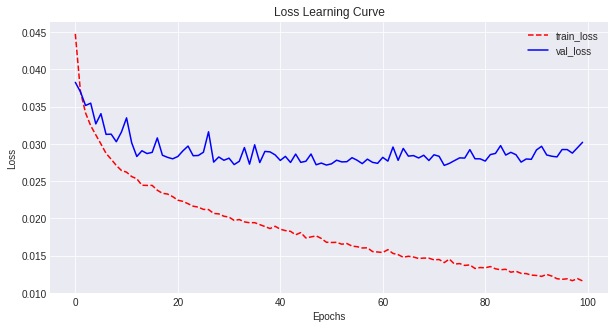

Test  Loss: 0.0282
Kappa List: [0.6469 0.5896 0.5482 0.7205 0.7157 0.8069 0.7036 0.48  ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6514
Test Quadratic Cohen Kappa Score (all essay set): 0.9749
Test Spearman Correlation Score  (all essay set): 0.9403

			 -------- Fold 2 --------
Total Training Time: 136.06 seconds
Train Loss: 0.0184
Val   Loss: 0.0305


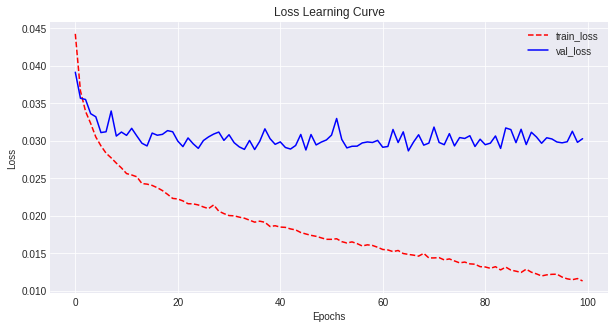

Test  Loss: 0.0266
Kappa List: [0.5274 0.5203 0.6087 0.7291 0.7174 0.768  0.5845 0.2458]
Test Quadratic Cohen Kappa Score (per essay set): 0.5877
Test Quadratic Cohen Kappa Score (all essay set): 0.9588
Test Spearman Correlation Score  (all essay set): 0.9411

			 -------- Fold 3 --------
Total Training Time: 136.81 seconds
Train Loss: 0.0188
Val   Loss: 0.0296


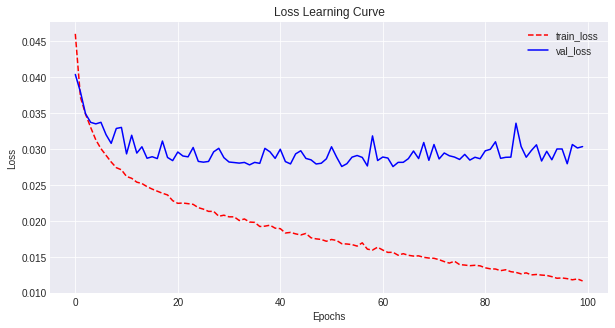

Test  Loss: 0.0265
Kappa List: [0.6366 0.5241 0.5684 0.771  0.7084 0.7118 0.6505 0.4118]
Test Quadratic Cohen Kappa Score (per essay set): 0.6229
Test Quadratic Cohen Kappa Score (all essay set): 0.9683
Test Spearman Correlation Score  (all essay set): 0.9299

			 -------- Fold 4 --------
Total Training Time: 138.14 seconds
Train Loss: 0.0187
Val   Loss: 0.0294


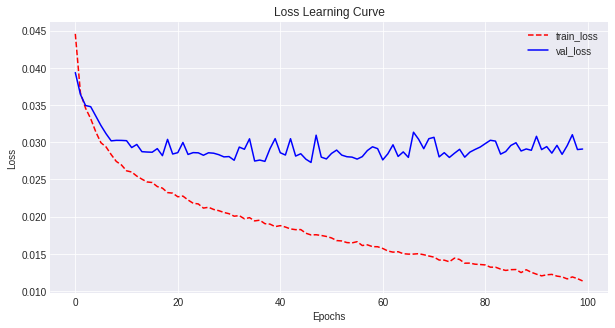

Test  Loss: 0.0254
Kappa List: [0.6545 0.469  0.5681 0.7935 0.6827 0.7393 0.662  0.4753]
Test Quadratic Cohen Kappa Score (per essay set): 0.6306
Test Quadratic Cohen Kappa Score (all essay set): 0.9722
Test Spearman Correlation Score  (all essay set): 0.9401

			 -------- Fold 5 --------
Total Training Time: 138.1 seconds
Train Loss: 0.0182
Val   Loss: 0.028


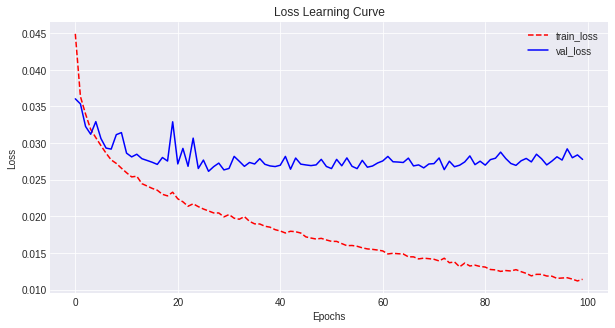

Test  Loss: 0.0287
Kappa List: [0.6606 0.5636 0.5368 0.7199 0.7002 0.7701 0.6162 0.4551]
Test Quadratic Cohen Kappa Score (per essay set): 0.6278
Test Quadratic Cohen Kappa Score (all essay set): 0.9758
Test Spearman Correlation Score  (all essay set): 0.9318


			Average Results:
Train Loss: 0.0185
Val   Loss: 0.0293
Test  Loss: 0.0271
QCK Score (per essay set): 0.6241
QCK Score (all essay set): 0.97
SCR Score (all essay set): 0.9366


			Epochs: 150


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 204.33 seconds
Train Loss: 0.0155
Val   Loss: 0.0288


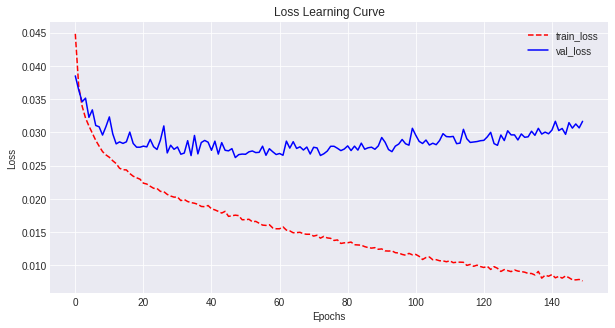

Test  Loss: 0.0311
Kappa List: [0.6257 0.5479 0.496  0.6975 0.6395 0.8029 0.6307 0.4105]
Test Quadratic Cohen Kappa Score (per essay set): 0.6063
Test Quadratic Cohen Kappa Score (all essay set): 0.97
Test Spearman Correlation Score  (all essay set): 0.9317

			 -------- Fold 2 --------
Total Training Time: 201.97 seconds
Train Loss: 0.0158
Val   Loss: 0.0314


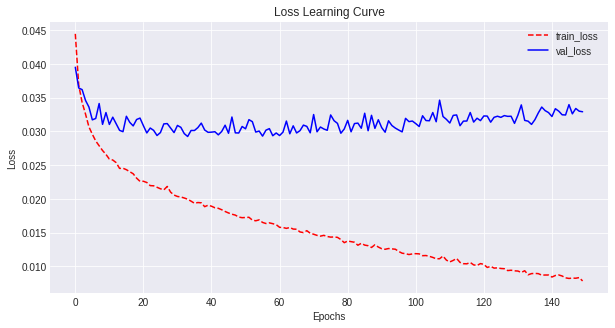

Test  Loss: 0.0286
Kappa List: [0.5403 0.426  0.5611 0.7052 0.7169 0.7263 0.5727 0.3554]
Test Quadratic Cohen Kappa Score (per essay set): 0.5755
Test Quadratic Cohen Kappa Score (all essay set): 0.9672
Test Spearman Correlation Score  (all essay set): 0.9379

			 -------- Fold 3 --------
Total Training Time: 204.71 seconds
Train Loss: 0.0157
Val   Loss: 0.0293


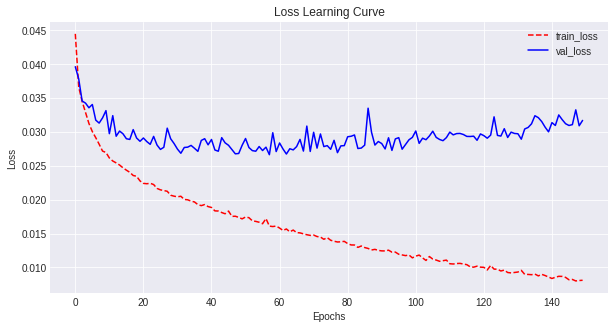

Test  Loss: 0.0272
Kappa List: [0.6301 0.5647 0.5961 0.7448 0.6934 0.7796 0.5914 0.551 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6439
Test Quadratic Cohen Kappa Score (all essay set): 0.9728
Test Spearman Correlation Score  (all essay set): 0.9362

			 -------- Fold 4 --------
Total Training Time: 200.54 seconds
Train Loss: 0.0158
Val   Loss: 0.0291


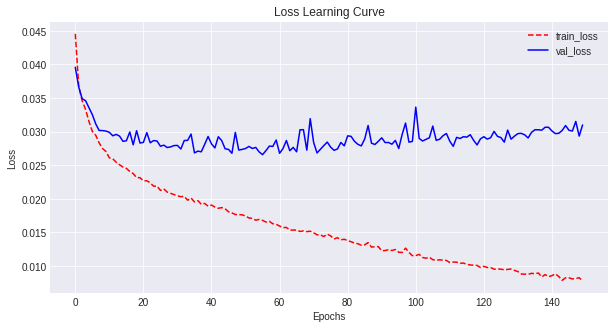

Test  Loss: 0.0283
Kappa List: [0.6578 0.4112 0.5217 0.7827 0.6427 0.7095 0.6276 0.4198]
Test Quadratic Cohen Kappa Score (per essay set): 0.5966
Test Quadratic Cohen Kappa Score (all essay set): 0.9686
Test Spearman Correlation Score  (all essay set): 0.9372

			 -------- Fold 5 --------
Total Training Time: 203.89 seconds
Train Loss: 0.0157
Val   Loss: 0.0289


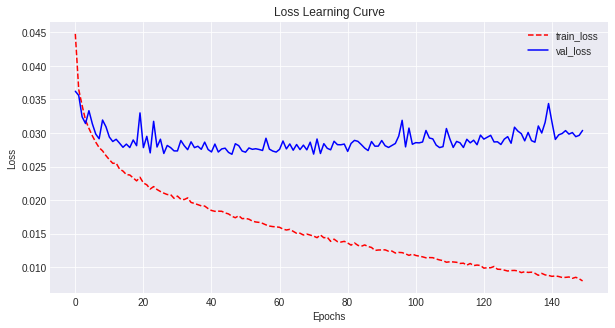

Test  Loss: 0.03
Kappa List: [0.6663 0.5971 0.531  0.7135 0.6719 0.7412 0.6188 0.3891]
Test Quadratic Cohen Kappa Score (per essay set): 0.6161
Test Quadratic Cohen Kappa Score (all essay set): 0.9723
Test Spearman Correlation Score  (all essay set): 0.9258


			Average Results:
Train Loss: 0.0157
Val   Loss: 0.0295
Test  Loss: 0.029
QCK Score (per essay set): 0.6077
QCK Score (all essay set): 0.9702
SCR Score (all essay set): 0.9338


			Epochs: 200


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 266.39 seconds
Train Loss: 0.0131
Val   Loss: 0.0294


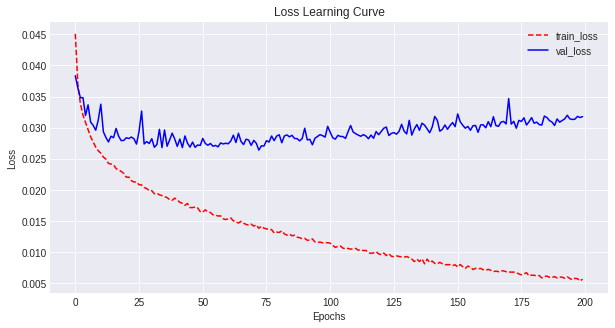

Test  Loss: 0.0323
Kappa List: [0.5919 0.5842 0.4608 0.698  0.6928 0.7956 0.6751 0.3839]
Test Quadratic Cohen Kappa Score (per essay set): 0.6103
Test Quadratic Cohen Kappa Score (all essay set): 0.9724
Test Spearman Correlation Score  (all essay set): 0.9339

			 -------- Fold 2 --------
Total Training Time: 267.72 seconds
Train Loss: 0.0131
Val   Loss: 0.0315


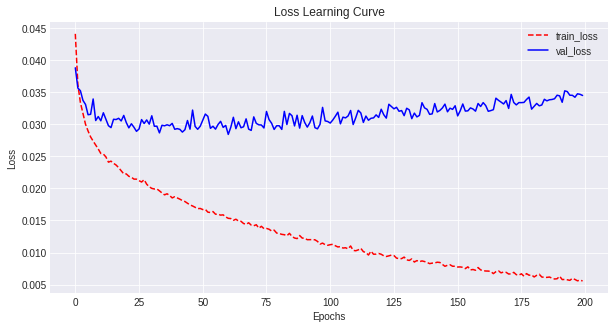

Test  Loss: 0.0293
Kappa List: [0.6249 0.4541 0.5757 0.7011 0.7251 0.739  0.5662 0.4066]
Test Quadratic Cohen Kappa Score (per essay set): 0.5991
Test Quadratic Cohen Kappa Score (all essay set): 0.9681
Test Spearman Correlation Score  (all essay set): 0.9359

			 -------- Fold 3 --------
Total Training Time: 267.77 seconds
Train Loss: 0.0135
Val   Loss: 0.0292


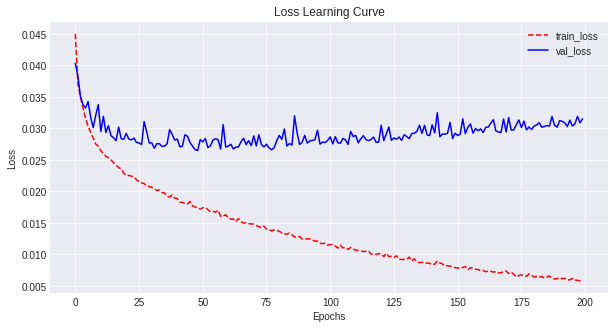

Test  Loss: 0.0294
Kappa List: [0.6296 0.5784 0.5674 0.7859 0.7042 0.6981 0.5955 0.3807]
Test Quadratic Cohen Kappa Score (per essay set): 0.6175
Test Quadratic Cohen Kappa Score (all essay set): 0.966
Test Spearman Correlation Score  (all essay set): 0.9334

			 -------- Fold 4 --------
Total Training Time: 267.49 seconds
Train Loss: 0.0133
Val   Loss: 0.0301


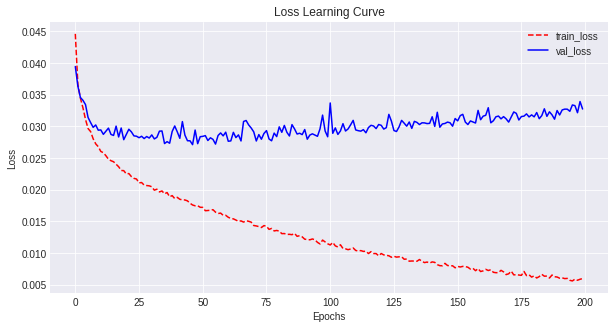

Test  Loss: 0.0291
Kappa List: [0.6125 0.449  0.5386 0.7668 0.6664 0.7131 0.6096 0.3819]
Test Quadratic Cohen Kappa Score (per essay set): 0.5922
Test Quadratic Cohen Kappa Score (all essay set): 0.9662
Test Spearman Correlation Score  (all essay set): 0.9375

			 -------- Fold 5 --------
Total Training Time: 273.85 seconds
Train Loss: 0.0133
Val   Loss: 0.0285


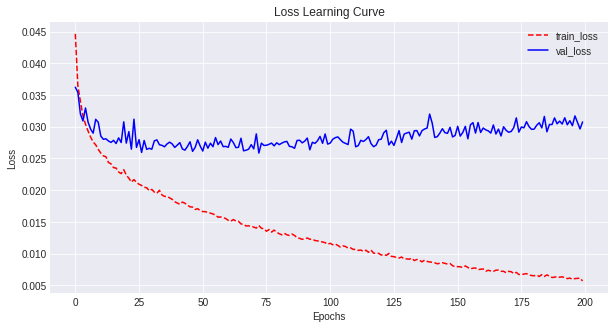

Test  Loss: 0.033
Kappa List: [0.6911 0.5544 0.4806 0.6968 0.645  0.7349 0.6277 0.3908]
Test Quadratic Cohen Kappa Score (per essay set): 0.6027
Test Quadratic Cohen Kappa Score (all essay set): 0.9731
Test Spearman Correlation Score  (all essay set): 0.9229


			Average Results:
Train Loss: 0.0133
Val   Loss: 0.0297
Test  Loss: 0.0306
QCK Score (per essay set): 0.6044
QCK Score (all essay set): 0.9692
SCR Score (all essay set): 0.9327


			Epochs: 250


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 339.51 seconds
Train Loss: 0.0115
Val   Loss: 0.0299


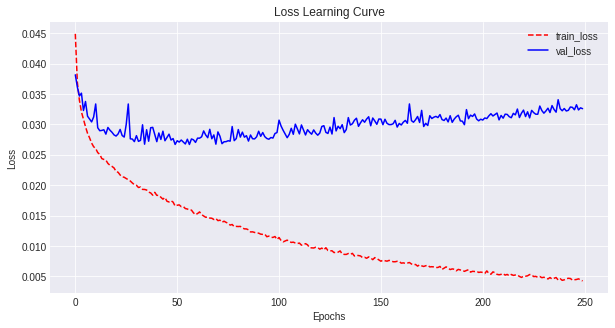

Test  Loss: 0.0341
Kappa List: [0.5562 0.5147 0.5032 0.6463 0.6811 0.7701 0.5723 0.3809]
Test Quadratic Cohen Kappa Score (per essay set): 0.5781
Test Quadratic Cohen Kappa Score (all essay set): 0.9679
Test Spearman Correlation Score  (all essay set): 0.9303

			 -------- Fold 2 --------
Total Training Time: 335.07 seconds
Train Loss: 0.0115
Val   Loss: 0.032


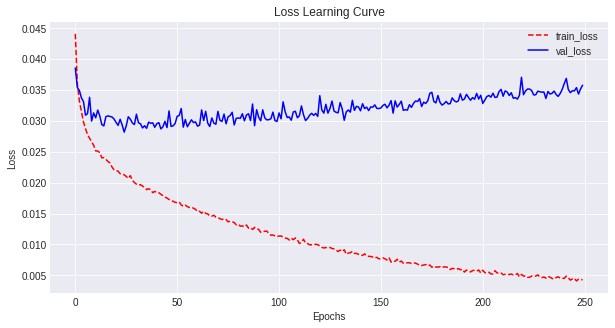

Test  Loss: 0.0308
Kappa List: [0.6171 0.5378 0.5428 0.7179 0.7132 0.6857 0.5724 0.4095]
Test Quadratic Cohen Kappa Score (per essay set): 0.5996
Test Quadratic Cohen Kappa Score (all essay set): 0.9654
Test Spearman Correlation Score  (all essay set): 0.9322

			 -------- Fold 3 --------


KeyboardInterrupt: ignored

In [21]:
# try more epochs to see if there's overfitting/underfitting
'''
    BEST COMBO: Epochs=100 -- more epochs = more overfitting, bad performance
Per Set Score: 0.6278
All Set Score: 0.9709
'''
epochs_list = [100, 150, 200, 250, 300, 500]
for epochs in epochs_list:
    print('\n\n\t\t\tEpochs:', epochs)
    cross_val_eval(dim=200, units=128, optimizer='adam', regularizer=None, 
                   batch_size=32, epochs=epochs, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 50, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Train on 9342 samples, validate on 1038 samples
Epoch 1/100
9342/9342 [==============================] - 4s 462us/sample - loss: 0.0511 - val_loss: 0.0473
Epoch 2/100
9342/9342 [==============================] - 2s 237us/sample - loss: 0.0456 - val_loss: 0.0444
Epoch 3/100
9342/9342 [==============================] - 2s 232us/sample - loss: 0.0429 - val_loss: 0.0429
Epoch 4/100
9342/9342 [==============================] - 2s 236us/sample - loss: 0.0413 - val_loss: 0.0420
Epoch 5/100
9342/9342 [==============================] - 2s 233us/sample - loss: 0.0407 - val_loss: 0.0420
Epoch 6/100
9342/9342 [==============================] - 2s 237us/sample - loss: 0.0402 - val_loss: 0.0418
Epoch 7/10

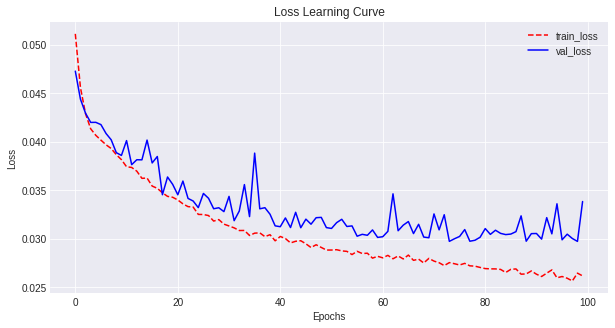

Test  Loss: 0.0327
Kappa List: [0.5693 0.5045 0.505  0.6716 0.7108 0.7601 0.6601 0.3473]
Test Quadratic Cohen Kappa Score (per essay set): 0.5911
Test Quadratic Cohen Kappa Score (all essay set): 0.9688
Test Spearman Correlation Score  (all essay set): 0.9333

			 -------- Fold 2 --------
Train on 9342 samples, validate on 1039 samples
Epoch 1/100
9342/9342 [==============================] - 4s 447us/sample - loss: 0.0516 - val_loss: 0.0503
Epoch 2/100
9342/9342 [==============================] - 2s 226us/sample - loss: 0.0460 - val_loss: 0.0457
Epoch 3/100
9342/9342 [==============================] - 2s 231us/sample - loss: 0.0432 - val_loss: 0.0446
Epoch 4/100
9342/9342 [==============================] - 2s 232us/sample - loss: 0.0417 - val_loss: 0.0433
Epoch 5/100
9342/9342 [==============================] - 2s 231us/sample - loss: 0.0407 - val_loss: 0.0418
Epoch 6/100
9342/9342 [==============================] - 2s 231us/sample - loss: 0.0400 - val_loss: 0.0410
Epoch 7/100
9342/934

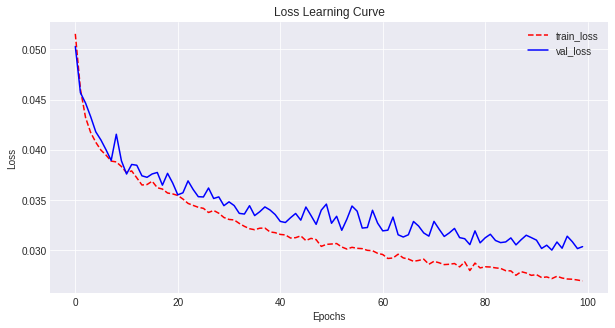

Test  Loss: 0.0284
Kappa List: [0.4466 0.5076 0.5516 0.6666 0.669  0.6571 0.4985 0.2626]
Test Quadratic Cohen Kappa Score (per essay set): 0.5325
Test Quadratic Cohen Kappa Score (all essay set): 0.9589
Test Spearman Correlation Score  (all essay set): 0.9304

			 -------- Fold 3 --------
Train on 9342 samples, validate on 1039 samples
Epoch 1/100
9342/9342 [==============================] - 4s 442us/sample - loss: 0.0516 - val_loss: 0.0492
Epoch 2/100
9342/9342 [==============================] - 2s 226us/sample - loss: 0.0464 - val_loss: 0.0457
Epoch 3/100
9342/9342 [==============================] - 2s 238us/sample - loss: 0.0441 - val_loss: 0.0453
Epoch 4/100
9342/9342 [==============================] - 2s 240us/sample - loss: 0.0423 - val_loss: 0.0429
Epoch 5/100
9342/9342 [==============================] - 2s 234us/sample - loss: 0.0415 - val_loss: 0.0429
Epoch 6/100
9342/9342 [==============================] - 2s 229us/sample - loss: 0.0409 - val_loss: 0.0421
Epoch 7/100
9342/934

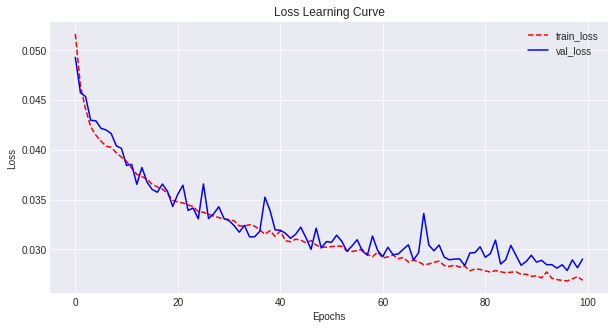

Test  Loss: 0.0286
Kappa List: [0.5918 0.4494 0.4932 0.7122 0.6192 0.7311 0.5344 0.3739]
Test Quadratic Cohen Kappa Score (per essay set): 0.5632
Test Quadratic Cohen Kappa Score (all essay set): 0.963
Test Spearman Correlation Score  (all essay set): 0.9286

			 -------- Fold 4 --------
Train on 9342 samples, validate on 1039 samples
Epoch 1/100
9342/9342 [==============================] - 4s 438us/sample - loss: 0.0512 - val_loss: 0.0499
Epoch 2/100
9342/9342 [==============================] - 2s 229us/sample - loss: 0.0460 - val_loss: 0.0457
Epoch 3/100
9342/9342 [==============================] - 2s 231us/sample - loss: 0.0434 - val_loss: 0.0436
Epoch 4/100
9342/9342 [==============================] - 2s 230us/sample - loss: 0.0419 - val_loss: 0.0434
Epoch 5/100
9342/9342 [==============================] - 2s 226us/sample - loss: 0.0412 - val_loss: 0.0423
Epoch 6/100
9342/9342 [==============================] - 2s 224us/sample - loss: 0.0407 - val_loss: 0.0422
Epoch 7/100
9342/9342

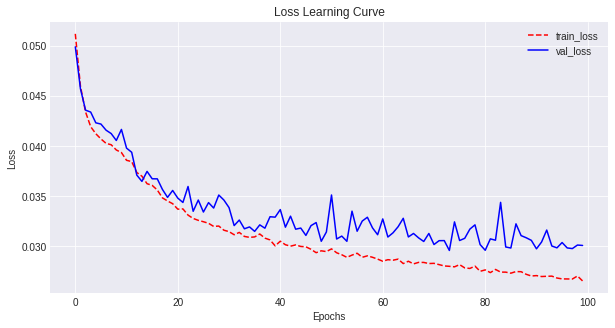

Test  Loss: 0.0284
Kappa List: [0.5338 0.5098 0.5572 0.7243 0.5529 0.7126 0.563  0.3901]
Test Quadratic Cohen Kappa Score (per essay set): 0.568
Test Quadratic Cohen Kappa Score (all essay set): 0.9652
Test Spearman Correlation Score  (all essay set): 0.9254

			 -------- Fold 5 --------
Train on 9342 samples, validate on 1039 samples
Epoch 1/100
9342/9342 [==============================] - 5s 500us/sample - loss: 0.0515 - val_loss: 0.0472
Epoch 2/100
9342/9342 [==============================] - 2s 227us/sample - loss: 0.0457 - val_loss: 0.0440
Epoch 3/100
9342/9342 [==============================] - 2s 229us/sample - loss: 0.0433 - val_loss: 0.0418
Epoch 4/100
9342/9342 [==============================] - 2s 230us/sample - loss: 0.0416 - val_loss: 0.0402
Epoch 5/100
9342/9342 [==============================] - 2s 228us/sample - loss: 0.0408 - val_loss: 0.0395
Epoch 6/100
9342/9342 [==============================] - 2s 225us/sample - loss: 0.0401 - val_loss: 0.0398
Epoch 7/100
9342/9342

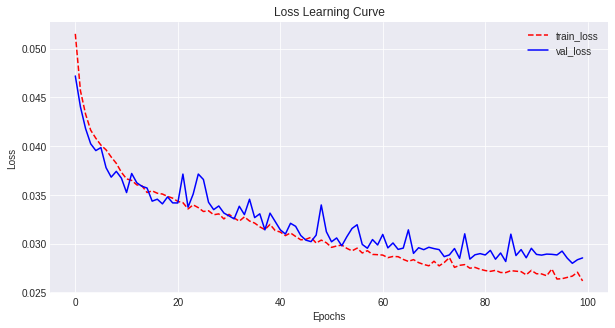

Test  Loss: 0.0305
Kappa List: [0.4961 0.3598 0.5541 0.6413 0.6255 0.7068 0.5495 0.2957]
Test Quadratic Cohen Kappa Score (per essay set): 0.5286
Test Quadratic Cohen Kappa Score (all essay set): 0.9639
Test Spearman Correlation Score  (all essay set): 0.9265


			Average Results:
Train Loss: 0.0314
Val   Loss: 0.0331
Test  Loss: 0.0297
QCK Score (per essay set): 0.5566
QCK Score (all essay set): 0.964
SCR Score (all essay set): 0.9289


In [49]:
# Try with return sequences = True -- reshape (batch_size, 200, 1) instead of (batch_size, 1, 200)
'''
No Overfitting -- controlled --> make 2 * number of units less than total dimension
Train Loss: 0.0314
Val   Loss: 0.0331
Test  Loss: 0.0297
QCK Score (per essay set): 0.5566
QCK Score (all essay set): 0.964
SCR Score (all essay set): 0.9289
'''
cross_val_eval(dim=50, units=20, denseLayerList=None, 
               batch_size=32, epochs=100, val_size=0.1, verbose=1, callbacks_list=None, isPlot=True)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 50, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 215.24 seconds
Train Loss: 0.0294
Val   Loss: 0.033


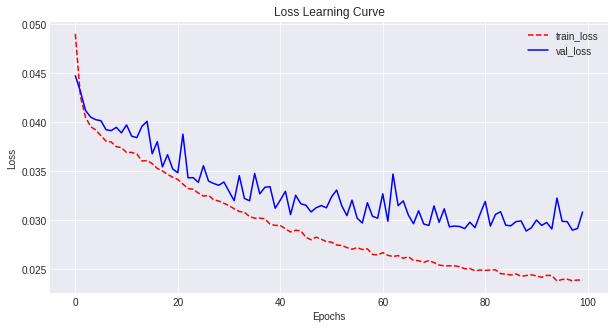

Test  Loss: 0.03
Kappa List: [0.5887 0.3928 0.5047 0.6948 0.7004 0.7773 0.6337 0.2955]
Test Quadratic Cohen Kappa Score (per essay set): 0.5735
Test Quadratic Cohen Kappa Score (all essay set): 0.9644
Test Spearman Correlation Score  (all essay set): 0.9345

			 -------- Fold 2 --------
Total Training Time: 211.31 seconds
Train Loss: 0.0292
Val   Loss: 0.0338


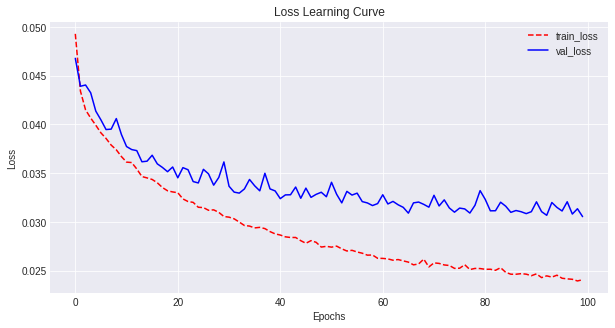

Test  Loss: 0.028
Kappa List: [0.6015 0.3907 0.4884 0.6812 0.6652 0.6662 0.4796 0.2653]
Test Quadratic Cohen Kappa Score (per essay set): 0.5298
Test Quadratic Cohen Kappa Score (all essay set): 0.9575
Test Spearman Correlation Score  (all essay set): 0.9322

			 -------- Fold 3 --------
Total Training Time: 211.46 seconds
Train Loss: 0.0279
Val   Loss: 0.0323


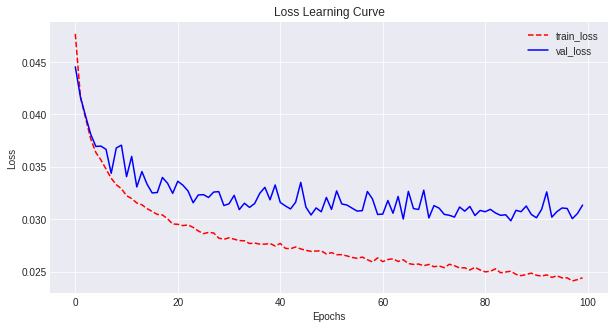

Test  Loss: 0.0299
Kappa List: [0.6276 0.5268 0.5455 0.6943 0.6543 0.748  0.5645 0.4384]
Test Quadratic Cohen Kappa Score (per essay set): 0.5999
Test Quadratic Cohen Kappa Score (all essay set): 0.9665
Test Spearman Correlation Score  (all essay set): 0.9312

			 -------- Fold 4 --------
Total Training Time: 209.02 seconds
Train Loss: 0.0282
Val   Loss: 0.0324


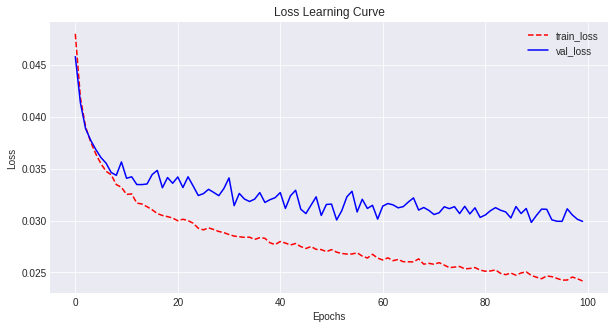

Test  Loss: 0.0276
Kappa List: [0.6486 0.4421 0.5107 0.7194 0.6512 0.6997 0.6229 0.5214]
Test Quadratic Cohen Kappa Score (per essay set): 0.602
Test Quadratic Cohen Kappa Score (all essay set): 0.9704
Test Spearman Correlation Score  (all essay set): 0.9307

			 -------- Fold 5 --------
Total Training Time: 204.27 seconds
Train Loss: 0.0278
Val   Loss: 0.031


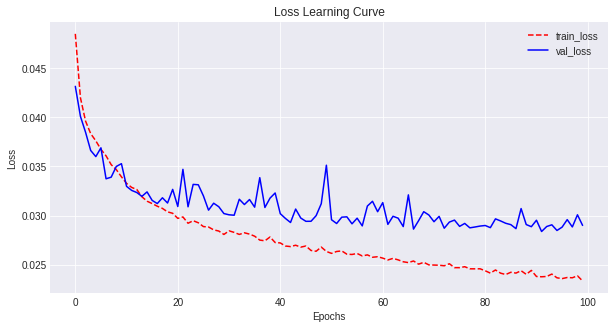

Test  Loss: 0.0316
Kappa List: [0.4687 0.5018 0.4894 0.6458 0.6077 0.7088 0.5381 0.3591]
Test Quadratic Cohen Kappa Score (per essay set): 0.5399
Test Quadratic Cohen Kappa Score (all essay set): 0.965
Test Spearman Correlation Score  (all essay set): 0.9177


			Average Results:
Train Loss: 0.0285
Val   Loss: 0.0325
Test  Loss: 0.0294
QCK Score (per essay set): 0.569
QCK Score (all essay set): 0.9648
SCR Score (all essay set): 0.9293


In [51]:
# Try a middle dense layer of 32 units with above configuration
'''
Improvement in Scores - but some overfitting -- try different dense layer units
Train Loss: 0.0285
Val   Loss: 0.0325
Test  Loss: 0.0294
QCK Score (per essay set): 0.569
QCK Score (all essay set): 0.9648
SCR Score (all essay set): 0.9293
'''
denseLayerList = Dense(units=32, activation='relu', kernel_initializer='he_normal')
cross_val_eval(dim=50, units=20, denseLayerList=denseLayerList, 
               batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 50, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 213.56 seconds
Train Loss: 0.026
Val   Loss: 0.0316


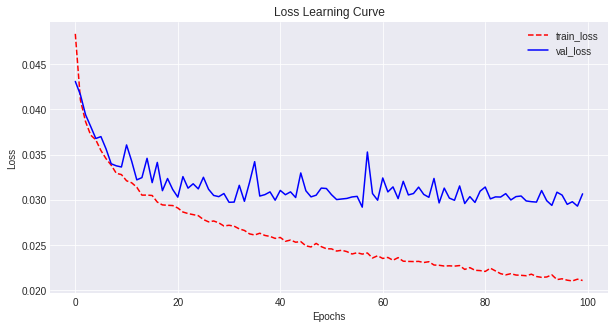

Test  Loss: 0.0291
Kappa List: [0.5648 0.4998 0.5257 0.7134 0.682  0.7635 0.6409 0.3351]
Test Quadratic Cohen Kappa Score (per essay set): 0.5907
Test Quadratic Cohen Kappa Score (all essay set): 0.971
Test Spearman Correlation Score  (all essay set): 0.9331

			 -------- Fold 2 --------
Total Training Time: 214.53 seconds
Train Loss: 0.0241
Val   Loss: 0.0322


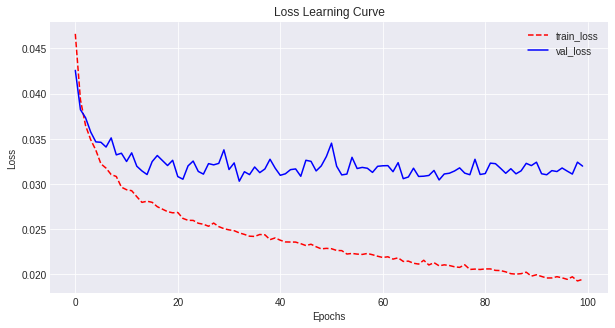

Test  Loss: 0.0281
Kappa List: [0.6154 0.4788 0.531  0.7025 0.6782 0.6906 0.5349 0.1948]
Test Quadratic Cohen Kappa Score (per essay set): 0.5533
Test Quadratic Cohen Kappa Score (all essay set): 0.9569
Test Spearman Correlation Score  (all essay set): 0.9316

			 -------- Fold 3 --------
Total Training Time: 211.18 seconds
Train Loss: 0.0241
Val   Loss: 0.0305


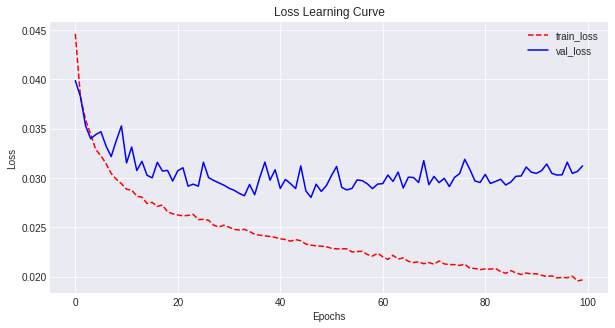

Test  Loss: 0.0294
Kappa List: [0.6332 0.4788 0.5347 0.7112 0.6642 0.7244 0.6471 0.4724]
Test Quadratic Cohen Kappa Score (per essay set): 0.6082
Test Quadratic Cohen Kappa Score (all essay set): 0.9724
Test Spearman Correlation Score  (all essay set): 0.9337

			 -------- Fold 4 --------
Total Training Time: 214.06 seconds
Train Loss: 0.0224
Val   Loss: 0.0308


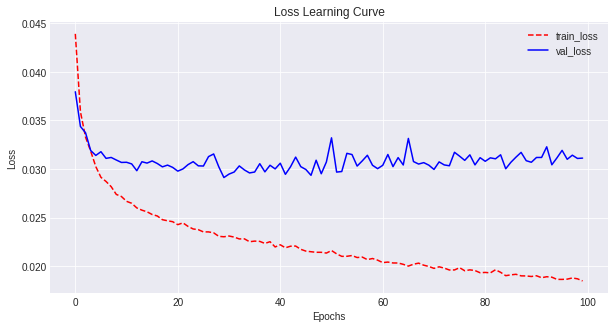

Test  Loss: 0.0257
Kappa List: [0.6472 0.544  0.5604 0.7632 0.6178 0.731  0.6569 0.4131]
Test Quadratic Cohen Kappa Score (per essay set): 0.6167
Test Quadratic Cohen Kappa Score (all essay set): 0.9655
Test Spearman Correlation Score  (all essay set): 0.9352

			 -------- Fold 5 --------
Total Training Time: 219.69 seconds
Train Loss: 0.0228
Val   Loss: 0.0292


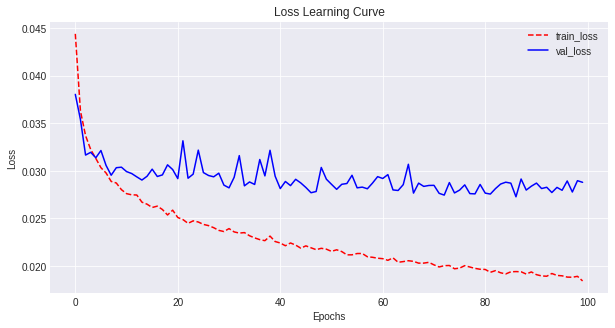

Test  Loss: 0.0295
Kappa List: [0.5781 0.5114 0.5354 0.6692 0.669  0.7577 0.5619 0.3701]
Test Quadratic Cohen Kappa Score (per essay set): 0.5816
Test Quadratic Cohen Kappa Score (all essay set): 0.9698
Test Spearman Correlation Score  (all essay set): 0.926


			Average Results:
Train Loss: 0.0239
Val   Loss: 0.0309
Test  Loss: 0.0284
QCK Score (per essay set): 0.5901
QCK Score (all essay set): 0.9671
SCR Score (all essay set): 0.9319


In [53]:
# Try two layers of Dense -- 64 and 32 units with above configuration
'''
Improvement in Scores - but some overfitting -- try without any dense layers -- increase dimension and units
Train Loss: 0.0239
Val   Loss: 0.0309
Test  Loss: 0.0284
QCK Score (per essay set): 0.5901
QCK Score (all essay set): 0.9671
SCR Score (all essay set): 0.9319
'''
denseLayerList = [Dense(units=64, activation='relu', kernel_initializer='he_normal'), 
                  Dense(units=32, activation='relu', kernel_initializer='he_normal')]
cross_val_eval(dim=50, units=20, denseLayerList=denseLayerList, 
               batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)


			Dimension: 50 	Hidden Units: 15


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 50, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 218.64 seconds
Train Loss: 0.0318
Val   Loss: 0.0334


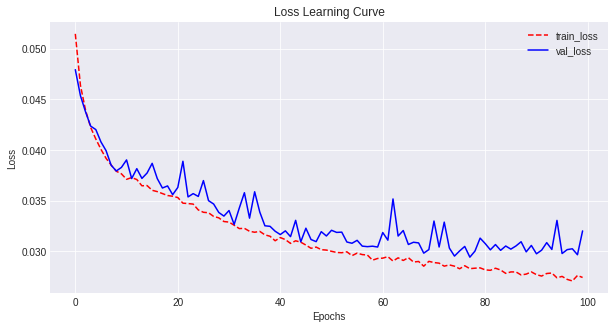

Test  Loss: 0.0322
Kappa List: [0.5519 0.4259 0.5136 0.6857 0.6721 0.7359 0.6058 0.4129]
Test Quadratic Cohen Kappa Score (per essay set): 0.5755
Test Quadratic Cohen Kappa Score (all essay set): 0.9695
Test Spearman Correlation Score  (all essay set): 0.9314

			 -------- Fold 2 --------
Total Training Time: 216.22 seconds
Train Loss: 0.0313
Val   Loss: 0.0347


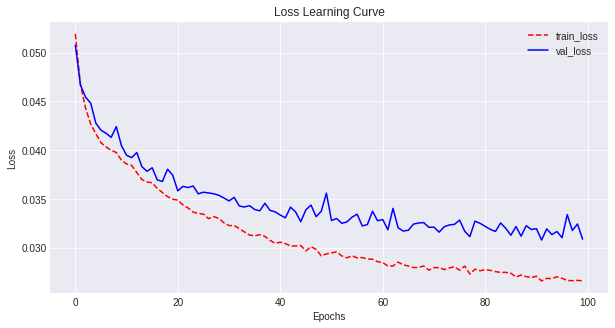

Test  Loss: 0.0282
Kappa List: [0.5363 0.5403 0.5179 0.6852 0.67   0.698  0.564  0.3104]
Test Quadratic Cohen Kappa Score (per essay set): 0.5652
Test Quadratic Cohen Kappa Score (all essay set): 0.9623
Test Spearman Correlation Score  (all essay set): 0.9278

			 -------- Fold 3 --------
Total Training Time: 209.46 seconds
Train Loss: 0.0323
Val   Loss: 0.0332


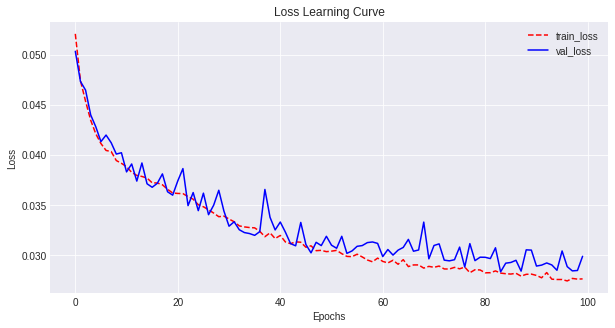

Test  Loss: 0.0296
Kappa List: [0.5751 0.4598 0.5305 0.7093 0.6451 0.7319 0.5628 0.3129]
Test Quadratic Cohen Kappa Score (per essay set): 0.5659
Test Quadratic Cohen Kappa Score (all essay set): 0.9579
Test Spearman Correlation Score  (all essay set): 0.9302

			 -------- Fold 4 --------
Total Training Time: 209.18 seconds
Train Loss: 0.0327
Val   Loss: 0.0341


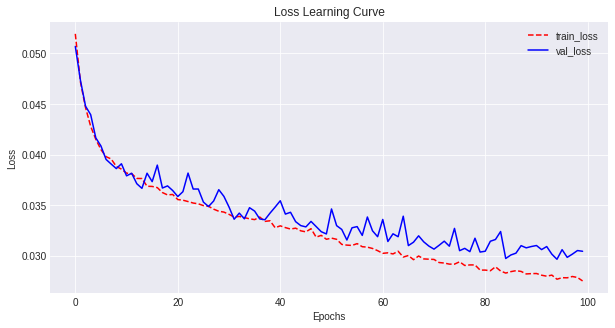

Test  Loss: 0.0291
Kappa List: [0.5018 0.381  0.542  0.7323 0.5537 0.6972 0.6395 0.3696]
Test Quadratic Cohen Kappa Score (per essay set): 0.5521
Test Quadratic Cohen Kappa Score (all essay set): 0.9684
Test Spearman Correlation Score  (all essay set): 0.9269

			 -------- Fold 5 --------
Total Training Time: 209.66 seconds
Train Loss: 0.0316
Val   Loss: 0.0321


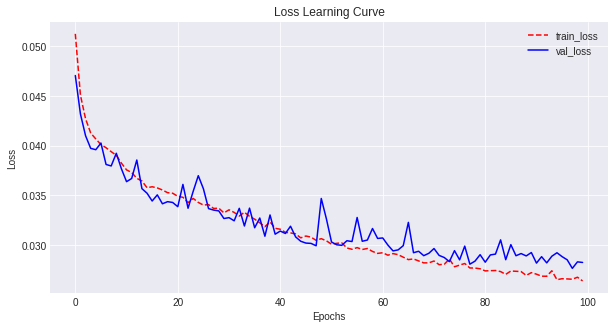

Test  Loss: 0.03
Kappa List: [0.4666 0.4366 0.552  0.6023 0.6562 0.7323 0.5272 0.3044]
Test Quadratic Cohen Kappa Score (per essay set): 0.5347
Test Quadratic Cohen Kappa Score (all essay set): 0.962
Test Spearman Correlation Score  (all essay set): 0.9244


			Average Results:
Train Loss: 0.0319
Val   Loss: 0.0335
Test  Loss: 0.0298
QCK Score (per essay set): 0.5587
QCK Score (all essay set): 0.964
SCR Score (all essay set): 0.9282

			Dimension: 100 	Hidden Units: 40


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 100, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 276.87 seconds
Train Loss: 0.0298
Val   Loss: 0.0332


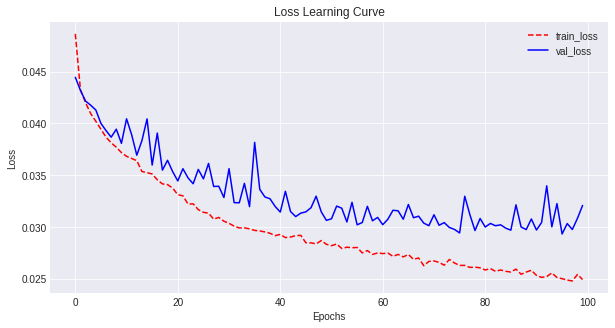

Test  Loss: 0.0316
Kappa List: [0.5984 0.3366 0.4928 0.7057 0.6784 0.7629 0.5674 0.4148]
Test Quadratic Cohen Kappa Score (per essay set): 0.5696
Test Quadratic Cohen Kappa Score (all essay set): 0.9693
Test Spearman Correlation Score  (all essay set): 0.9325

			 -------- Fold 2 --------
Total Training Time: 277.62 seconds
Train Loss: 0.03
Val   Loss: 0.0342


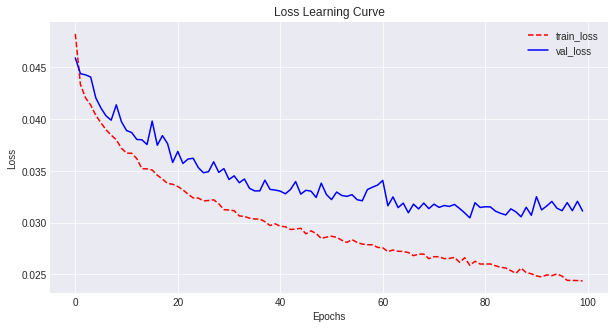

Test  Loss: 0.0273
Kappa List: [0.5565 0.5077 0.5569 0.6954 0.7225 0.7143 0.5466 0.1599]
Test Quadratic Cohen Kappa Score (per essay set): 0.5575
Test Quadratic Cohen Kappa Score (all essay set): 0.9432
Test Spearman Correlation Score  (all essay set): 0.9313

			 -------- Fold 3 --------
Total Training Time: 272.94 seconds
Train Loss: 0.0303
Val   Loss: 0.0334


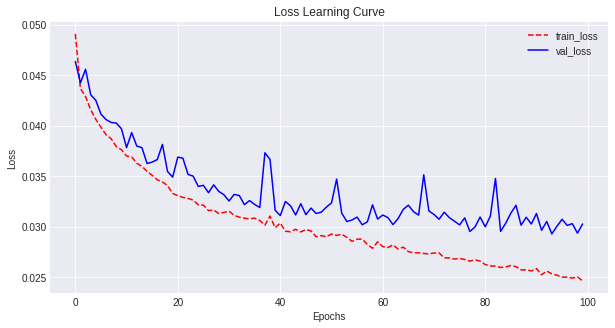

Test  Loss: 0.0268
Kappa List: [0.6469 0.5061 0.5474 0.7217 0.6527 0.6947 0.5808 0.3458]
Test Quadratic Cohen Kappa Score (per essay set): 0.587
Test Quadratic Cohen Kappa Score (all essay set): 0.9624
Test Spearman Correlation Score  (all essay set): 0.9346

			 -------- Fold 4 --------
Total Training Time: 276.46 seconds
Train Loss: 0.0305
Val   Loss: 0.0335


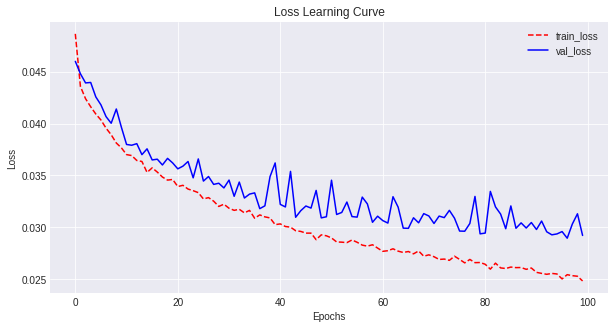

Test  Loss: 0.0285
Kappa List: [0.6188 0.4115 0.5156 0.7177 0.6205 0.7003 0.5996 0.3753]
Test Quadratic Cohen Kappa Score (per essay set): 0.5699
Test Quadratic Cohen Kappa Score (all essay set): 0.9678
Test Spearman Correlation Score  (all essay set): 0.9289

			 -------- Fold 5 --------
Total Training Time: 275.21 seconds
Train Loss: 0.0301
Val   Loss: 0.032


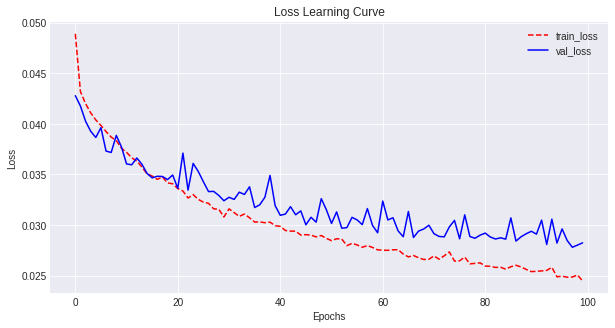

Test  Loss: 0.0291
Kappa List: [0.5789 0.5307 0.569  0.6354 0.6582 0.7363 0.4757 0.418 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.5753
Test Quadratic Cohen Kappa Score (all essay set): 0.966
Test Spearman Correlation Score  (all essay set): 0.9264


			Average Results:
Train Loss: 0.0302
Val   Loss: 0.0333
Test  Loss: 0.0287
QCK Score (per essay set): 0.5719
QCK Score (all essay set): 0.9617
SCR Score (all essay set): 0.9307

			Dimension: 200 	Hidden Units: 90


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 200, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 584.3 seconds
Train Loss: 0.0289
Val   Loss: 0.0316


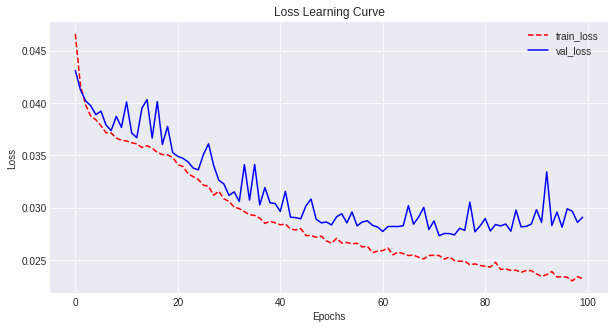

Test  Loss: 0.0288
Kappa List: [0.5847 0.4465 0.5064 0.7141 0.6843 0.7904 0.6339 0.4096]
Test Quadratic Cohen Kappa Score (per essay set): 0.5962
Test Quadratic Cohen Kappa Score (all essay set): 0.9714
Test Spearman Correlation Score  (all essay set): 0.9366

			 -------- Fold 2 --------
Total Training Time: 585.03 seconds
Train Loss: 0.0283
Val   Loss: 0.0321


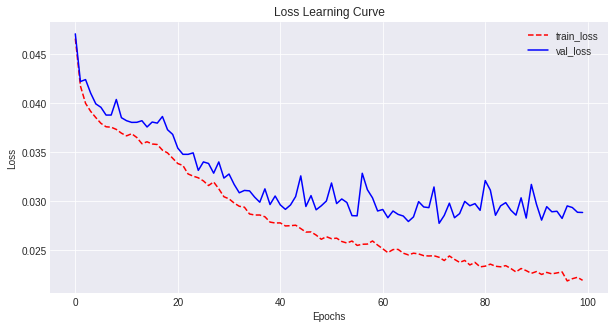

Test  Loss: 0.0267
Kappa List: [0.5658 0.5441 0.5853 0.7264 0.7459 0.7176 0.5755 0.2343]
Test Quadratic Cohen Kappa Score (per essay set): 0.5869
Test Quadratic Cohen Kappa Score (all essay set): 0.9508
Test Spearman Correlation Score  (all essay set): 0.936

			 -------- Fold 3 --------
Total Training Time: 584.27 seconds
Train Loss: 0.0295
Val   Loss: 0.0314


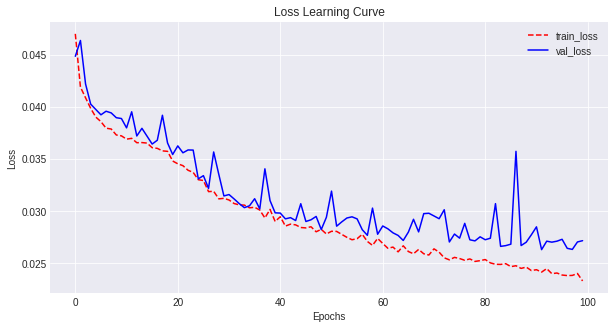

Test  Loss: 0.0258
Kappa List: [0.5614 0.5047 0.5851 0.7423 0.6716 0.754  0.5734 0.3238]
Test Quadratic Cohen Kappa Score (per essay set): 0.5895
Test Quadratic Cohen Kappa Score (all essay set): 0.9587
Test Spearman Correlation Score  (all essay set): 0.9346

			 -------- Fold 4 --------
Total Training Time: 584.44 seconds
Train Loss: 0.0292
Val   Loss: 0.0318


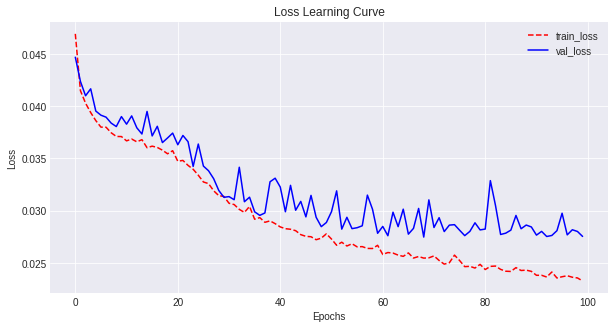

Test  Loss: 0.0257
Kappa List: [0.6084 0.4814 0.5444 0.7812 0.637  0.7597 0.6408 0.4425]
Test Quadratic Cohen Kappa Score (per essay set): 0.6119
Test Quadratic Cohen Kappa Score (all essay set): 0.9695
Test Spearman Correlation Score  (all essay set): 0.9386

			 -------- Fold 5 --------
Total Training Time: 583.69 seconds
Train Loss: 0.0285
Val   Loss: 0.0306


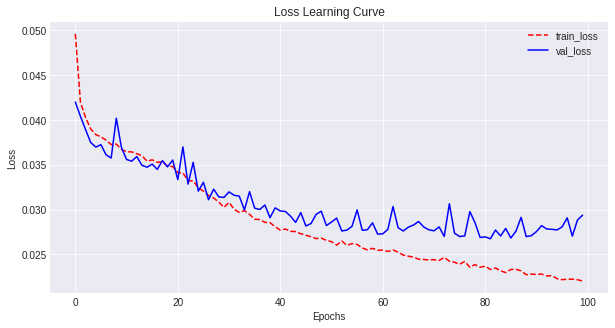

Test  Loss: 0.0296
Kappa List: [0.5723 0.4265 0.5678 0.6764 0.6254 0.7385 0.4821 0.3959]
Test Quadratic Cohen Kappa Score (per essay set): 0.5606
Test Quadratic Cohen Kappa Score (all essay set): 0.9642
Test Spearman Correlation Score  (all essay set): 0.9309


			Average Results:
Train Loss: 0.0289
Val   Loss: 0.0315
Test  Loss: 0.0273
QCK Score (per essay set): 0.589
QCK Score (all essay set): 0.9629
SCR Score (all essay set): 0.9353

			Dimension: 300 	Hidden Units: 140


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 300)
Shape of TEST X:  (1298, 300)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 300, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 865.84 seconds
Train Loss: 0.0301
Val   Loss: 0.0334


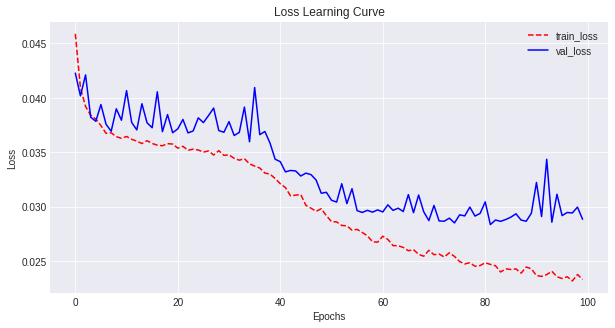

Test  Loss: 0.0277
Kappa List: [0.621  0.3574 0.5582 0.6955 0.725  0.7753 0.6132 0.3773]
Test Quadratic Cohen Kappa Score (per essay set): 0.5904
Test Quadratic Cohen Kappa Score (all essay set): 0.971
Test Spearman Correlation Score  (all essay set): 0.9376

			 -------- Fold 2 --------
Total Training Time: 864.85 seconds
Train Loss: 0.0301
Val   Loss: 0.0342


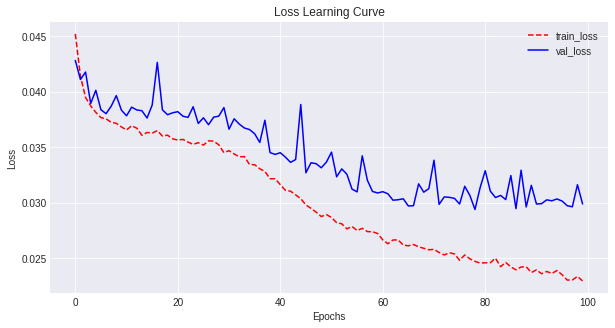

Test  Loss: 0.0264
Kappa List: [0.4606 0.4875 0.5806 0.729  0.721  0.7258 0.4583 0.1707]
Test Quadratic Cohen Kappa Score (per essay set): 0.5417
Test Quadratic Cohen Kappa Score (all essay set): 0.9423
Test Spearman Correlation Score  (all essay set): 0.9345

			 -------- Fold 3 --------
Total Training Time: 868.3 seconds
Train Loss: 0.0298
Val   Loss: 0.0331


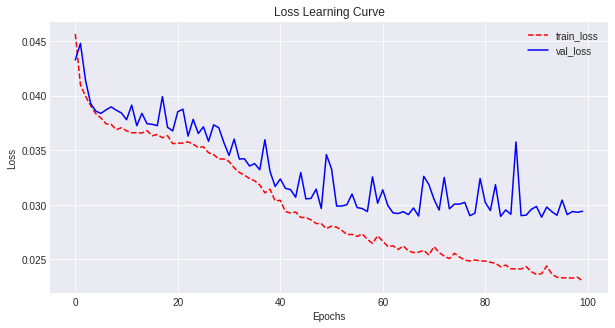

Test  Loss: 0.0259
Kappa List: [0.6363 0.4888 0.589  0.7446 0.682  0.6948 0.5621 0.3204]
Test Quadratic Cohen Kappa Score (per essay set): 0.5897
Test Quadratic Cohen Kappa Score (all essay set): 0.9585
Test Spearman Correlation Score  (all essay set): 0.9389

			 -------- Fold 4 --------
Total Training Time: 877.74 seconds
Train Loss: 0.0304
Val   Loss: 0.0337


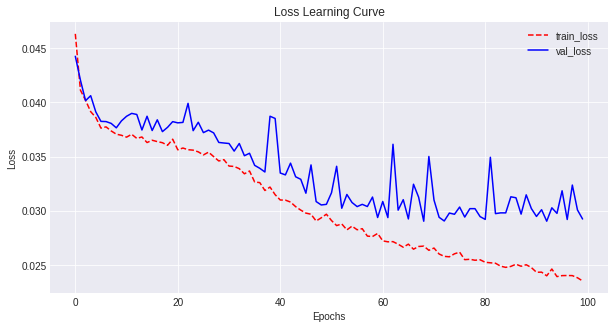

Test  Loss: 0.0258
Kappa List: [0.6011 0.4574 0.5516 0.7389 0.6492 0.736  0.631  0.3561]
Test Quadratic Cohen Kappa Score (per essay set): 0.5902
Test Quadratic Cohen Kappa Score (all essay set): 0.9673
Test Spearman Correlation Score  (all essay set): 0.9357

			 -------- Fold 5 --------
Total Training Time: 873.95 seconds
Train Loss: 0.0293
Val   Loss: 0.0316


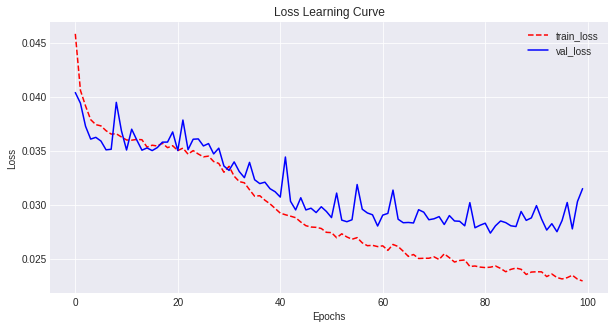

Test  Loss: 0.031
Kappa List: [0.5545 0.5065 0.5556 0.6435 0.6497 0.7515 0.5209 0.4065]
Test Quadratic Cohen Kappa Score (per essay set): 0.5736
Test Quadratic Cohen Kappa Score (all essay set): 0.9673
Test Spearman Correlation Score  (all essay set): 0.929


			Average Results:
Train Loss: 0.0299
Val   Loss: 0.0332
Test  Loss: 0.0273
QCK Score (per essay set): 0.5771
QCK Score (all essay set): 0.9613
SCR Score (all essay set): 0.9352

			Dimension: 500 	Hidden Units: 240


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 500)
Shape of TEST X:  (1298, 500)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 500, 1)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------


KeyboardInterrupt: ignored

In [63]:
# try different units/dimension combination
'''
    BEST COMBINATION: 200 dim and 90 units
Train Loss: 0.0289
Val   Loss: 0.0315
Test  Loss: 0.0273
QCK Score (per essay set): 0.589
QCK Score (all essay set): 0.9629
SCR Score (all essay set): 0.9353
'''
denseLayerList = None
dim_list = [50, 100, 200, 300, 500]
for dim in dim_list:
    units = int(dim/2 - 10)
    print('\n\t\t\tDimension:', dim, '\tHidden Units:', units)
    cross_val_eval(dim=dim, units=units, denseLayerList=None, 
                   batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)


			Dimension: 50 	Hidden Units: 15


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 50)
Shape of TEST X:  (1298, 50)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 50)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 141.09 seconds
Train Loss: 0.028
Val   Loss: 0.0319


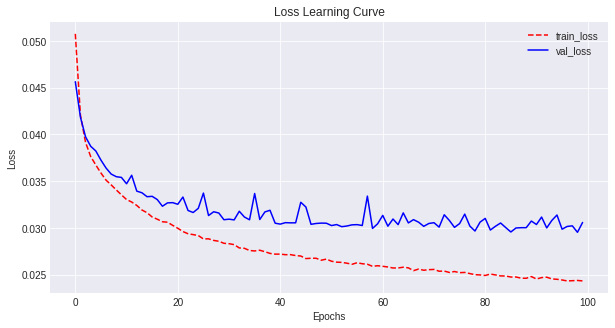

Test  Loss: 0.0299
Kappa List: [0.4857 0.368  0.4894 0.6625 0.6805 0.7783 0.6378 0.3771]
Test Quadratic Cohen Kappa Score (per essay set): 0.5599
Test Quadratic Cohen Kappa Score (all essay set): 0.9708
Test Spearman Correlation Score  (all essay set): 0.9258

			 -------- Fold 2 --------
Total Training Time: 139.36 seconds
Train Loss: 0.0301
Val   Loss: 0.0337


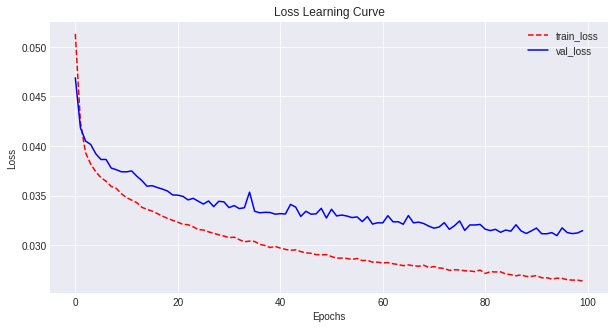

Test  Loss: 0.0291
Kappa List: [0.4348 0.459  0.4665 0.6522 0.6095 0.7223 0.4725 0.1475]
Test Quadratic Cohen Kappa Score (per essay set): 0.4955
Test Quadratic Cohen Kappa Score (all essay set): 0.9463
Test Spearman Correlation Score  (all essay set): 0.9273

			 -------- Fold 3 --------
Total Training Time: 141.29 seconds
Train Loss: 0.0289
Val   Loss: 0.0322


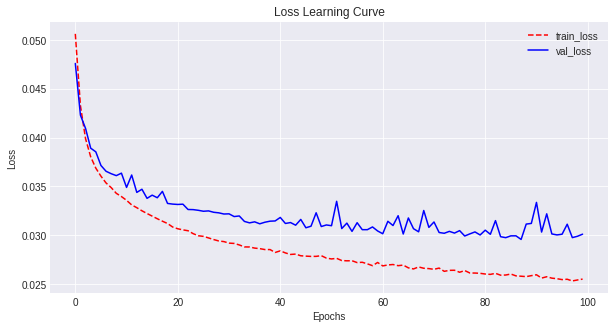

Test  Loss: 0.0291
Kappa List: [0.6511 0.4746 0.5599 0.6993 0.6098 0.7188 0.5607 0.4023]
Test Quadratic Cohen Kappa Score (per essay set): 0.5846
Test Quadratic Cohen Kappa Score (all essay set): 0.9652
Test Spearman Correlation Score  (all essay set): 0.9308

			 -------- Fold 4 --------
Total Training Time: 140.72 seconds
Train Loss: 0.0292
Val   Loss: 0.0331


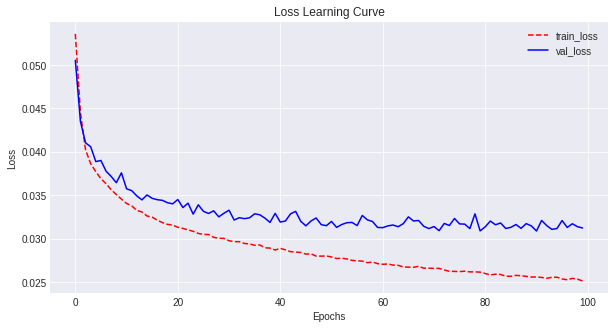

Test  Loss: 0.0282
Kappa List: [0.689  0.388  0.5417 0.6944 0.5758 0.7158 0.6125 0.3816]
Test Quadratic Cohen Kappa Score (per essay set): 0.5748
Test Quadratic Cohen Kappa Score (all essay set): 0.9688
Test Spearman Correlation Score  (all essay set): 0.9306

			 -------- Fold 5 --------
Total Training Time: 140.06 seconds
Train Loss: 0.0279
Val   Loss: 0.0308


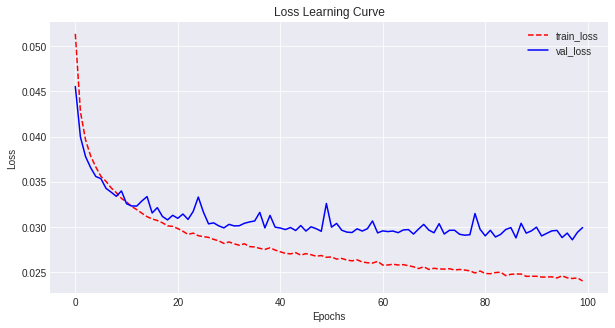

Test  Loss: 0.0305
Kappa List: [0.5203 0.4977 0.5218 0.6681 0.6234 0.6945 0.5173 0.3309]
Test Quadratic Cohen Kappa Score (per essay set): 0.5467
Test Quadratic Cohen Kappa Score (all essay set): 0.967
Test Spearman Correlation Score  (all essay set): 0.9189


			Average Results:
Train Loss: 0.0288
Val   Loss: 0.0324
Test  Loss: 0.0294
QCK Score (per essay set): 0.5523
QCK Score (all essay set): 0.9636
SCR Score (all essay set): 0.9267

			Dimension: 100 	Hidden Units: 40


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 100)
Shape of TEST X:  (1298, 100)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 100)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 139.29 seconds
Train Loss: 0.0236
Val   Loss: 0.0302


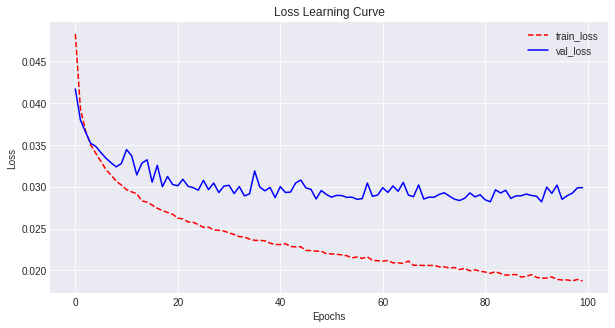

Test  Loss: 0.0296
Kappa List: [0.6075 0.4587 0.4707 0.7029 0.7096 0.7861 0.6645 0.3502]
Test Quadratic Cohen Kappa Score (per essay set): 0.5938
Test Quadratic Cohen Kappa Score (all essay set): 0.9695
Test Spearman Correlation Score  (all essay set): 0.935

			 -------- Fold 2 --------
Total Training Time: 142.5 seconds
Train Loss: 0.023
Val   Loss: 0.0302


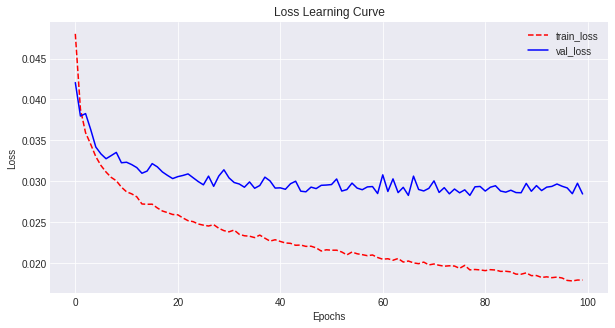

Test  Loss: 0.0259
Kappa List: [0.4245 0.4022 0.5931 0.7178 0.7303 0.7613 0.6388 0.2905]
Test Quadratic Cohen Kappa Score (per essay set): 0.5698
Test Quadratic Cohen Kappa Score (all essay set): 0.961
Test Spearman Correlation Score  (all essay set): 0.9391

			 -------- Fold 3 --------
Total Training Time: 139.09 seconds
Train Loss: 0.0239
Val   Loss: 0.0295


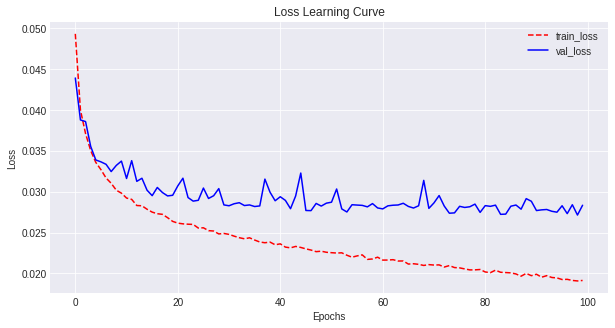

Test  Loss: 0.0265
Kappa List: [0.6402 0.5602 0.5474 0.7387 0.7057 0.7657 0.6709 0.3754]
Test Quadratic Cohen Kappa Score (per essay set): 0.6255
Test Quadratic Cohen Kappa Score (all essay set): 0.9668
Test Spearman Correlation Score  (all essay set): 0.9373

			 -------- Fold 4 --------
Total Training Time: 140.54 seconds
Train Loss: 0.0233
Val   Loss: 0.03


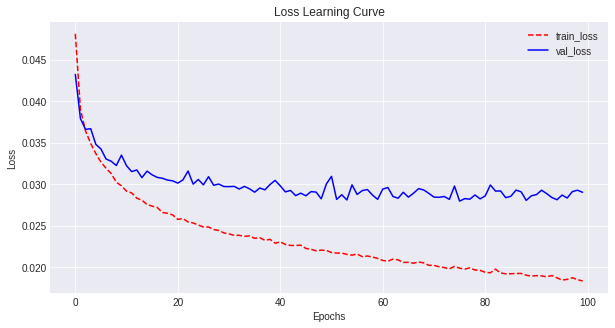

Test  Loss: 0.0263
Kappa List: [0.7179 0.5154 0.5563 0.7753 0.6742 0.7543 0.6308 0.428 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6315
Test Quadratic Cohen Kappa Score (all essay set): 0.9709
Test Spearman Correlation Score  (all essay set): 0.9375

			 -------- Fold 5 --------
Total Training Time: 143.34 seconds
Train Loss: 0.0234
Val   Loss: 0.029


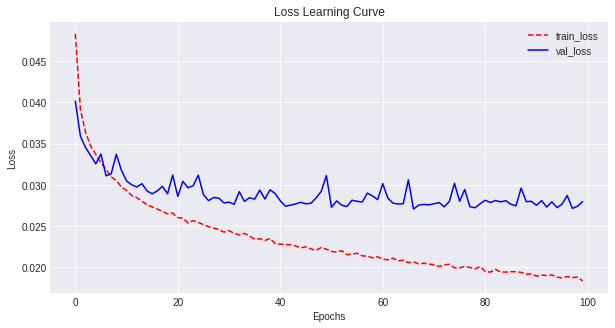

Test  Loss: 0.0292
Kappa List: [0.5953 0.5273 0.5357 0.6476 0.6401 0.7537 0.56   0.4257]
Test Quadratic Cohen Kappa Score (per essay set): 0.5857
Test Quadratic Cohen Kappa Score (all essay set): 0.9717
Test Spearman Correlation Score  (all essay set): 0.9277


			Average Results:
Train Loss: 0.0235
Val   Loss: 0.0298
Test  Loss: 0.0275
QCK Score (per essay set): 0.6013
QCK Score (all essay set): 0.968
SCR Score (all essay set): 0.9353

			Dimension: 200 	Hidden Units: 90


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 139.6 seconds
Train Loss: 0.0192
Val   Loss: 0.029


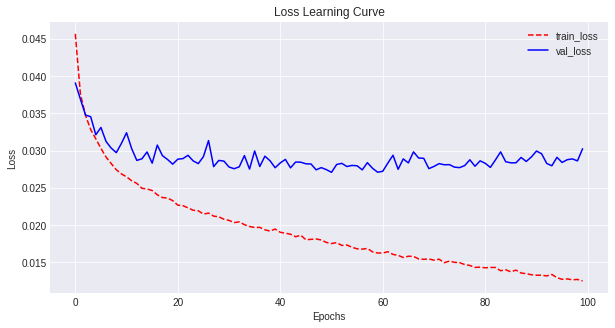

Test  Loss: 0.0294
Kappa List: [0.6433 0.4959 0.5571 0.7082 0.7171 0.7844 0.7005 0.4247]
Test Quadratic Cohen Kappa Score (per essay set): 0.6289
Test Quadratic Cohen Kappa Score (all essay set): 0.9731
Test Spearman Correlation Score  (all essay set): 0.9393

			 -------- Fold 2 --------
Total Training Time: 142.26 seconds
Train Loss: 0.0195
Val   Loss: 0.0305


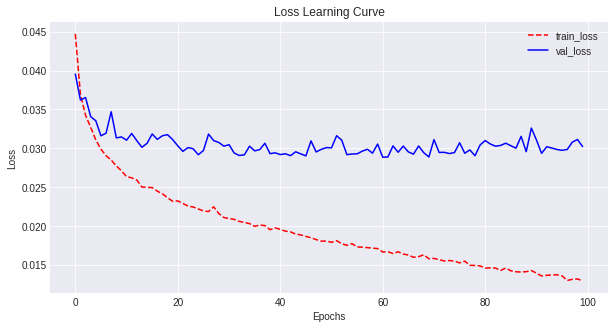

Test  Loss: 0.026
Kappa List: [0.5405 0.5344 0.5797 0.7255 0.7479 0.7791 0.6156 0.3147]
Test Quadratic Cohen Kappa Score (per essay set): 0.6047
Test Quadratic Cohen Kappa Score (all essay set): 0.9657
Test Spearman Correlation Score  (all essay set): 0.9418

			 -------- Fold 3 --------
Total Training Time: 138.2 seconds
Train Loss: 0.0196
Val   Loss: 0.0291


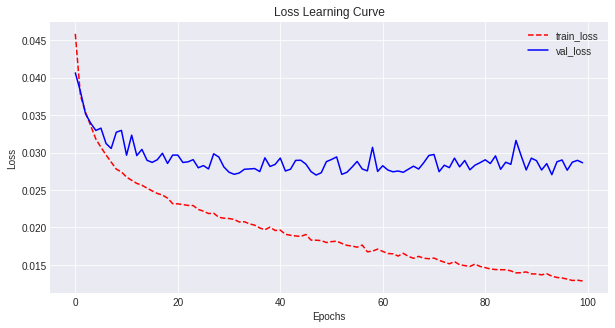

Test  Loss: 0.0264
Kappa List: [0.5319 0.5799 0.5577 0.7655 0.7128 0.7594 0.6408 0.4027]
Test Quadratic Cohen Kappa Score (per essay set): 0.6189
Test Quadratic Cohen Kappa Score (all essay set): 0.9674
Test Spearman Correlation Score  (all essay set): 0.9393

			 -------- Fold 4 --------
Total Training Time: 139.93 seconds
Train Loss: 0.0199
Val   Loss: 0.0295


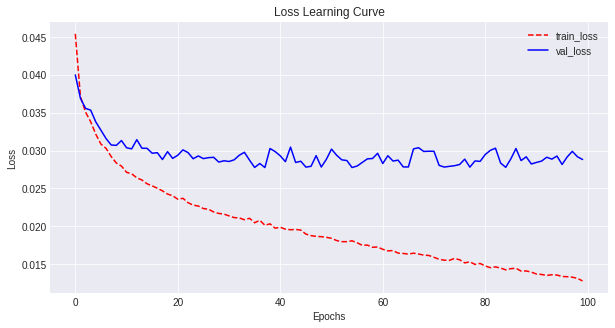

Test  Loss: 0.0254
Kappa List: [0.6689 0.4961 0.5842 0.7966 0.6633 0.7358 0.674  0.476 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6369
Test Quadratic Cohen Kappa Score (all essay set): 0.9737
Test Spearman Correlation Score  (all essay set): 0.9392

			 -------- Fold 5 --------
Total Training Time: 142.98 seconds
Train Loss: 0.0194
Val   Loss: 0.0283


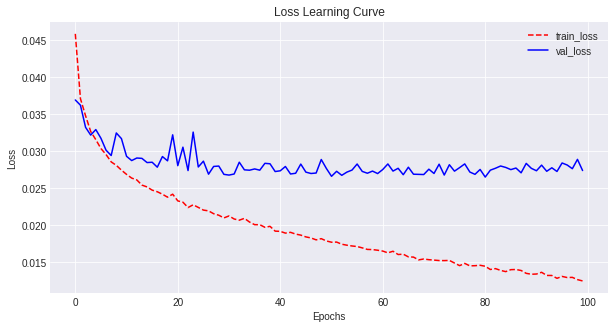

Test  Loss: 0.0285
Kappa List: [0.6319 0.5592 0.5663 0.696  0.6574 0.7558 0.6128 0.4044]
Test Quadratic Cohen Kappa Score (per essay set): 0.6105
Test Quadratic Cohen Kappa Score (all essay set): 0.9738
Test Spearman Correlation Score  (all essay set): 0.9237


			Average Results:
Train Loss: 0.0195
Val   Loss: 0.0293
Test  Loss: 0.0271
QCK Score (per essay set): 0.62
QCK Score (all essay set): 0.9707
SCR Score (all essay set): 0.9367

			Dimension: 300 	Hidden Units: 140


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 300)
Shape of TEST X:  (1298, 300)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 300)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 142.38 seconds
Train Loss: 0.0192
Val   Loss: 0.0291


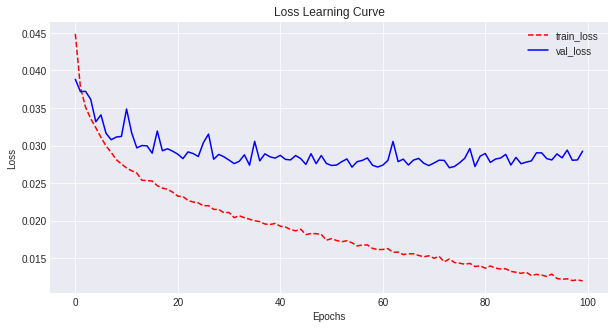

Test  Loss: 0.0292
Kappa List: [0.6315 0.5529 0.55   0.7298 0.699  0.785  0.6899 0.4214]
Test Quadratic Cohen Kappa Score (per essay set): 0.6324
Test Quadratic Cohen Kappa Score (all essay set): 0.9711
Test Spearman Correlation Score  (all essay set): 0.9371

			 -------- Fold 2 --------
Total Training Time: 143.74 seconds
Train Loss: 0.0185
Val   Loss: 0.0307


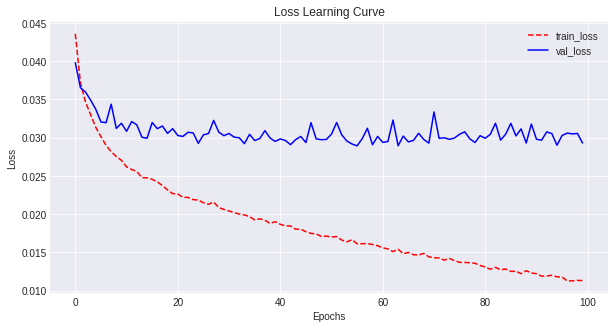

Test  Loss: 0.0264
Kappa List: [0.5868 0.5342 0.5861 0.687  0.7138 0.7384 0.6242 0.4134]
Test Quadratic Cohen Kappa Score (per essay set): 0.6105
Test Quadratic Cohen Kappa Score (all essay set): 0.9688
Test Spearman Correlation Score  (all essay set): 0.9399

			 -------- Fold 3 --------
Total Training Time: 143.44 seconds
Train Loss: 0.0187
Val   Loss: 0.0299


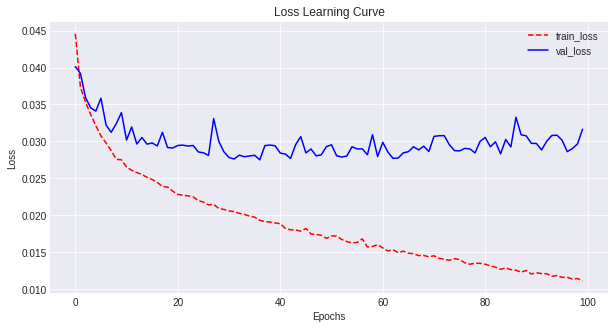

Test  Loss: 0.029
Kappa List: [0.6016 0.546  0.5213 0.76   0.6694 0.6695 0.6112 0.3558]
Test Quadratic Cohen Kappa Score (per essay set): 0.5918
Test Quadratic Cohen Kappa Score (all essay set): 0.9661
Test Spearman Correlation Score  (all essay set): 0.9293

			 -------- Fold 4 --------
Total Training Time: 143.29 seconds
Train Loss: 0.0188
Val   Loss: 0.0298


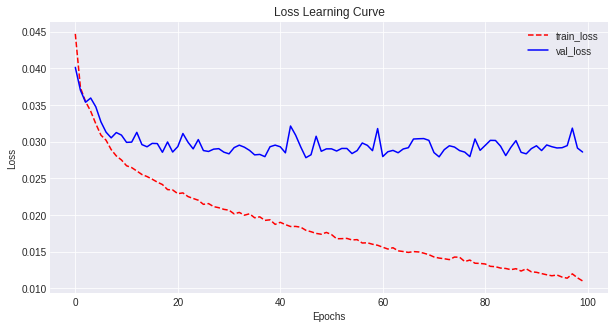

Test  Loss: 0.0252
Kappa List: [0.6756 0.4378 0.5755 0.7933 0.6992 0.7427 0.6613 0.5175]
Test Quadratic Cohen Kappa Score (per essay set): 0.6379
Test Quadratic Cohen Kappa Score (all essay set): 0.9724
Test Spearman Correlation Score  (all essay set): 0.9409

			 -------- Fold 5 --------
Total Training Time: 145.65 seconds
Train Loss: 0.0185
Val   Loss: 0.0291


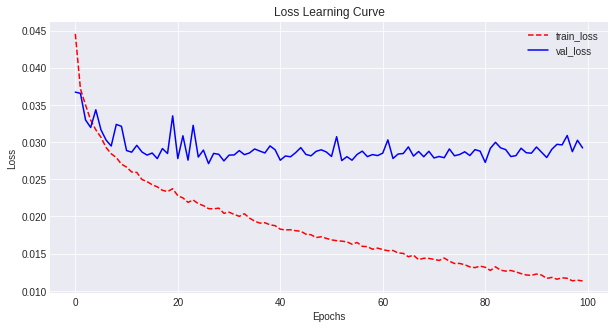

Test  Loss: 0.028
Kappa List: [0.6236 0.5768 0.571  0.7197 0.6716 0.7719 0.6114 0.4374]
Test Quadratic Cohen Kappa Score (per essay set): 0.6229
Test Quadratic Cohen Kappa Score (all essay set): 0.9744
Test Spearman Correlation Score  (all essay set): 0.9296


			Average Results:
Train Loss: 0.0187
Val   Loss: 0.0297
Test  Loss: 0.0276
QCK Score (per essay set): 0.6191
QCK Score (all essay set): 0.9706
SCR Score (all essay set): 0.9354

			Dimension: 500 	Hidden Units: 240


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 500)
Shape of TEST X:  (1298, 500)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 500)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------


KeyboardInterrupt: ignored

In [69]:
# try same with return sequences = False and original relu activation
'''
    BEST COMBINATION: Dim = 200 / Units = 90
Train Loss: 0.0195
Val   Loss: 0.0293
Test  Loss: 0.0271
QCK Score (per essay set): 0.62
QCK Score (all essay set): 0.9707
SCR Score (all essay set): 0.9367
'''
dim_list = [50, 100, 200, 300, 500]
for dim in dim_list:
    units = int(dim/2 - 10)
    print('\n\t\t\tDimension:', dim, '\tHidden Units:', units)
    cross_val_eval(dim=dim, units=units, optimizer='adam', regularizer=None, 
                   batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)

# BiLSTM - Try Combination of Essay Sets with Final Parameters

In [0]:
def BiLSTM(input_shape, units):
    bilstm_model = Sequential(name='bi-lstm')
    bilstm_model.add(Input(shape=input_shape))
    bilstm_model.add(Bidirectional(LSTM(units=units, return_sequences=False, activation='relu', kernel_initializer='he_normal'), merge_mode='concat'))
    bilstm_model.add(Dense(units=1, activation='sigmoid', name='output'))
    bilstm_model.compile(optimizer='adam', loss='mse')
    return bilstm_model

In [0]:
def scalePred(results_df):
    score_range_df = results_df.groupby('essay_set')['target_score'].agg(['min', 'max'])
    score_ranges = list(zip(score_range_df['min'], score_range_df['max']))
    rescaled_y_pred_arr = []
    for topic_number in range(len(score_ranges)):
        scaler = MinMaxScaler(score_ranges[topic_number])
        rescaled_y_pred = scaler.fit_transform(results_df[results_df['essay_set'] == (topic_number + 1)]['y_pred'].to_frame()).round(0).astype('int')
        rescaled_y_pred_arr = np.append(rescaled_y_pred_arr, rescaled_y_pred)
    results_df['rescaled_y_pred'] = rescaled_y_pred_arr
    return results_df

In [0]:
def calculate_kappa_score(results_df):
    kappa_list = []
    for topic_number in list(np.unique(results_df.essay_set.values)):
        kappa_list.append(kappa(results_df[results_df.essay_set == topic_number]['target_score'], 
                                results_df[results_df.essay_set == topic_number]['rescaled_y_pred'], 
                                weights='quadratic'))
    print('Kappa List:', np.round(kappa_list, 4))
    return np.mean(kappa_list)

In [0]:
# performs cross validation training for better model parameter tuning
def cross_val_eval(df, dim, units, batch_size, epochs, val_size, verbose, callbacks_list, isPlot):
    # get word_model and data for given dimension
    word_model = Word2Vec.load('./DATA/custom_word2vec_models/' + str(dim) + '_noSW_word2vec_model')
    data = Data(df=df, useStopWord=False, model=word_model, dim=dim, test_size=0.1).getTrainTestSplit(isTokenizer=False)
    # reshape input to shape (batch_size, number of timesteps, sequence length for timesteps) -- (1000, 1, 300)
    data['train_x'] = np.reshape(data['train_x'], (data['train_x'].shape[0], 1, data['train_x'].shape[1]))
    data['test_x'] = np.reshape(data['test_x'], (data['test_x'].shape[0], 1, data['test_x'].shape[1]))
    # combine train and test data into one big array/dataframe
    X = np.concatenate([data['train_x'], data['test_x']])
    Y = np.concatenate([data['train_y'], data['test_y']])
    SCORE_INFO = pd.concat([data['train_score_info'], data['test_score_info']], axis=0)
    print('New X Shape:', X.shape)
    print('New Y Shape:', Y.shape)
    print('New SCORE INFO Shape:', SCORE_INFO.shape)
    # split data into 5 folds
    kf = KFold(n_splits=5, shuffle=True, random_state=42)
    count = 0
    train_loss = []
    val_loss = []
    test_loss = []
    kappa_list_per_topic = []
    kappa_list_all_topic = []
    spearman_list_all_topic = []
    for train_index, test_index in kf.split(X):
        count += 1
        print('\n\t\t\t -------- Fold {} --------'.format(count))
        train_x, test_x = X[train_index, :, :], X[test_index, :, :]
        train_y, test_y = Y[train_index], Y[test_index]
        train_score_info, test_score_info = SCORE_INFO.iloc[train_index], SCORE_INFO.iloc[test_index]
        # build model
        model = BiLSTM(input_shape=(1, dim), units=units)
        # fit model
        start = time.time()
        history = model.fit(train_x, train_y, batch_size=batch_size, epochs=epochs, 
                            validation_split=val_size, verbose=verbose, callbacks=callbacks_list)
        end = time.time() - start
        print('Total Training Time:', np.round(end, 2), 'seconds')
        print('Train Loss:', np.round(np.mean(history.history['loss']), 4))
        print('Val   Loss:', np.round(np.mean(history.history['val_loss']), 4))
        train_loss.append(np.mean(history.history['loss']))
        val_loss.append(np.mean(history.history['val_loss']))
        if isPlot == True:
            plt.figure(figsize=(10, 5))
            plt.plot(history.history['loss'], 'r--', label='train_loss')
            plt.plot(history.history['val_loss'], 'b-', label='val_loss')
            plt.xlabel('Epochs')
            plt.ylabel('Loss')
            plt.title('Loss Learning Curve')
            plt.legend(loc='best')
            plt.show()
        # evaluate model
        tst_loss = model.evaluate(test_x, test_y, verbose=0)
        print('Test  Loss:', np.round(tst_loss, 4))
        test_loss.append(tst_loss)
        y_pred = pd.DataFrame(model.predict(test_x).reshape(-1))
        results = test_score_info.reset_index(drop=True).join(y_pred).rename(columns={0:'y_pred'}).sort_values(by='essay_set').reset_index(drop=True)
        results = scalePred(results)
        per_topic_kappa_score = calculate_kappa_score(results)
        print('Test Quadratic Cohen Kappa Score (per essay set):', np.round(per_topic_kappa_score, 4))
        all_topic_kappa_score = kappa(results['target_score'], results['rescaled_y_pred'], weights='quadratic')
        print('Test Quadratic Cohen Kappa Score (all essay set):', np.round(all_topic_kappa_score, 4))
        all_topic_spearman_score = spearmanr(results['target_score'].values, results['rescaled_y_pred'].values)[0]
        print('Test Spearman Correlation Score  (all essay set):', np.round(all_topic_spearman_score, 4))
        kappa_list_per_topic.append(per_topic_kappa_score)
        kappa_list_all_topic.append(all_topic_kappa_score)
        spearman_list_all_topic.append(all_topic_spearman_score)

    print('\n\n\t\t\tAverage Results:')
    print('Train Loss:', np.round(np.mean(train_loss), 4))
    print('Val   Loss:', np.round(np.mean(val_loss), 4))
    print('Test  Loss:', np.round(np.mean(test_loss), 4))
    print('QCK Score (per essay set):', np.round(np.mean(kappa_list_per_topic), 4))
    print('QCK Score (all essay set):', np.round(np.mean(kappa_list_all_topic), 4))
    print('SCR Score (all essay set):', np.round(np.mean(spearman_list_all_topic), 4))



			Essays Sets Between [ 1, 1 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (1604, 200)
Shape of TEST X:  (179, 200)
Shape of TRAIN Y: (1604,)
Shape of TEST Y:  (179,)
Shape of TRAIN SCORE INFO: (1604, 3)
Shape of TEST SCORE INFO:  (179, 3)
New X Shape: (1783, 1, 200)
New Y Shape: (1783,)
New SCORE INFO Shape: (1783, 3)

			 -------- Fold 1 --------
Total Training Time: 21.48 seconds
Train Loss: 0.0111
Val   Loss: 0.0146


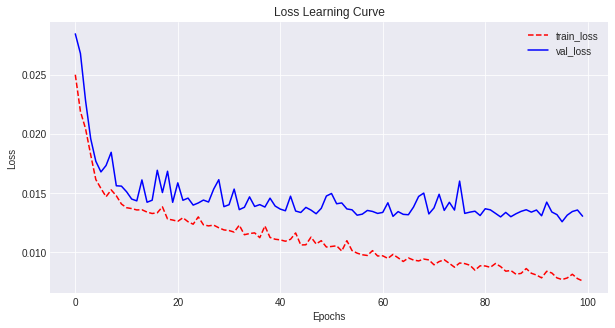

Test  Loss: 0.0122
Kappa List: [0.6324]
Test Quadratic Cohen Kappa Score (per essay set): 0.6324
Test Quadratic Cohen Kappa Score (all essay set): 0.6324
Test Spearman Correlation Score  (all essay set): 0.6054

			 -------- Fold 2 --------
Total Training Time: 21.48 seconds
Train Loss: 0.011
Val   Loss: 0.0141


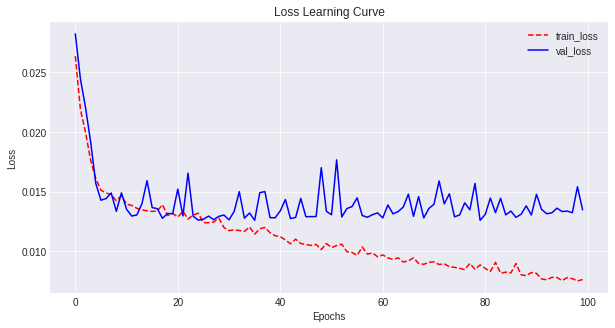

Test  Loss: 0.0135
Kappa List: [0.6025]
Test Quadratic Cohen Kappa Score (per essay set): 0.6025
Test Quadratic Cohen Kappa Score (all essay set): 0.6025
Test Spearman Correlation Score  (all essay set): 0.6237

			 -------- Fold 3 --------
Total Training Time: 21.56 seconds
Train Loss: 0.0111
Val   Loss: 0.0149


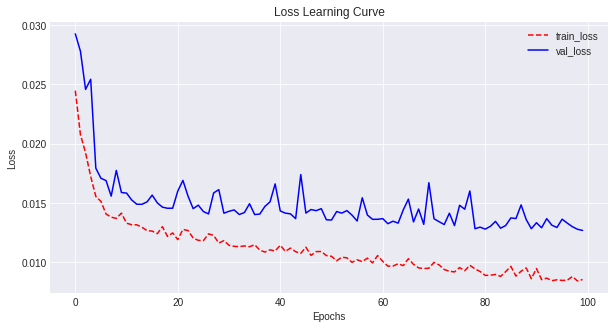

Test  Loss: 0.014
Kappa List: [0.694]
Test Quadratic Cohen Kappa Score (per essay set): 0.694
Test Quadratic Cohen Kappa Score (all essay set): 0.694
Test Spearman Correlation Score  (all essay set): 0.6716

			 -------- Fold 4 --------
Total Training Time: 22.06 seconds
Train Loss: 0.0113
Val   Loss: 0.0139


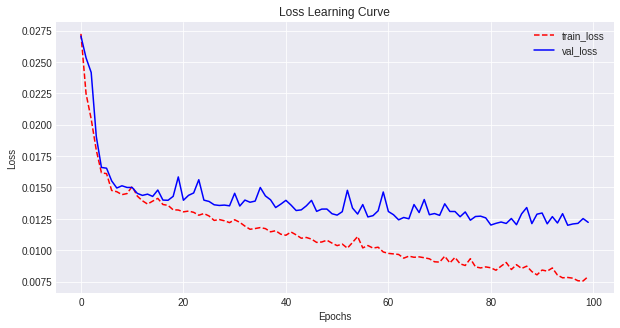

Test  Loss: 0.0117
Kappa List: [0.5943]
Test Quadratic Cohen Kappa Score (per essay set): 0.5943
Test Quadratic Cohen Kappa Score (all essay set): 0.5943
Test Spearman Correlation Score  (all essay set): 0.5913

			 -------- Fold 5 --------
Total Training Time: 21.64 seconds
Train Loss: 0.0114
Val   Loss: 0.0143


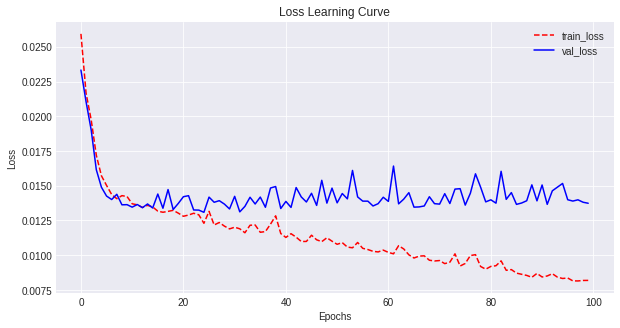

Test  Loss: 0.014
Kappa List: [0.5574]
Test Quadratic Cohen Kappa Score (per essay set): 0.5574
Test Quadratic Cohen Kappa Score (all essay set): 0.5574
Test Spearman Correlation Score  (all essay set): 0.6372


			Average Results:
Train Loss: 0.0112
Val   Loss: 0.0143
Test  Loss: 0.0131
QCK Score (per essay set): 0.6161
QCK Score (all essay set): 0.6161
SCR Score (all essay set): 0.6258

********************************************************************************


			Essays Sets Between [ 1, 2 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (3224, 200)
Shape of TEST X:  (359, 200)
Shape of TRAIN Y: (3224,)
Shape of TEST Y:  (359,)
Shape of TRAIN SCORE INFO: (3224, 3)
Shape of TEST SCORE INFO:  (359, 3)
New X Shape: (3583, 1, 200)
New Y Shape: (3583,)
New SCORE INFO Shape: (3583, 3)

			 -------- Fold 1 --------
Total Training Time: 41.0 seconds
Train Loss: 0.0114
Val   Loss: 0.0146


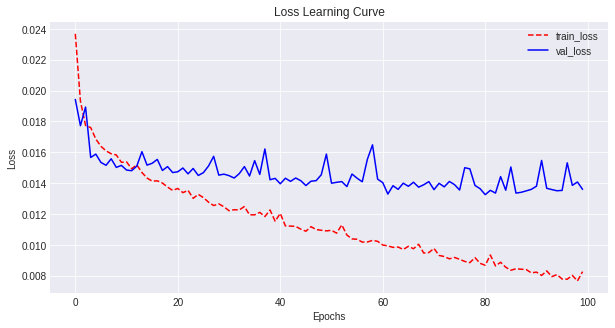

Test  Loss: 0.014
Kappa List: [0.6008 0.5158]
Test Quadratic Cohen Kappa Score (per essay set): 0.5583
Test Quadratic Cohen Kappa Score (all essay set): 0.9247
Test Spearman Correlation Score  (all essay set): 0.9021

			 -------- Fold 2 --------
Total Training Time: 40.74 seconds
Train Loss: 0.0114
Val   Loss: 0.0147


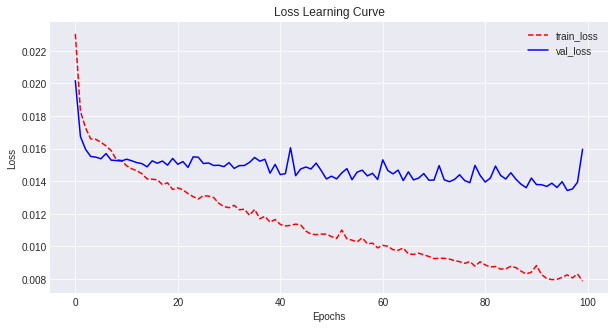

Test  Loss: 0.0155
Kappa List: [0.6921 0.4382]
Test Quadratic Cohen Kappa Score (per essay set): 0.5652
Test Quadratic Cohen Kappa Score (all essay set): 0.916
Test Spearman Correlation Score  (all essay set): 0.8925

			 -------- Fold 3 --------
Total Training Time: 40.74 seconds
Train Loss: 0.0116
Val   Loss: 0.0145


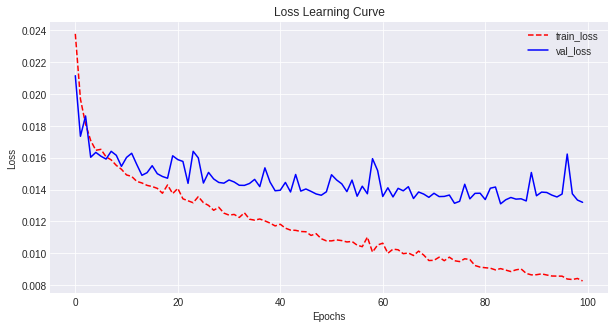

Test  Loss: 0.0138
Kappa List: [0.6798 0.5968]
Test Quadratic Cohen Kappa Score (per essay set): 0.6383
Test Quadratic Cohen Kappa Score (all essay set): 0.9369
Test Spearman Correlation Score  (all essay set): 0.9051

			 -------- Fold 4 --------
Total Training Time: 40.99 seconds
Train Loss: 0.0118
Val   Loss: 0.0143


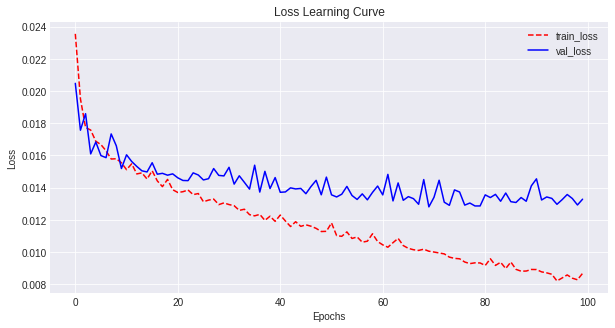

Test  Loss: 0.0142
Kappa List: [0.6559 0.4592]
Test Quadratic Cohen Kappa Score (per essay set): 0.5575
Test Quadratic Cohen Kappa Score (all essay set): 0.9132
Test Spearman Correlation Score  (all essay set): 0.892

			 -------- Fold 5 --------
Total Training Time: 40.99 seconds
Train Loss: 0.0117
Val   Loss: 0.0163


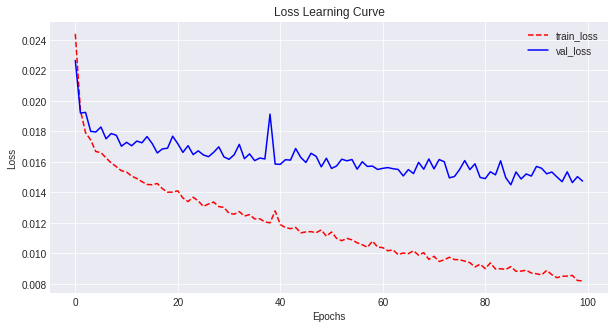

Test  Loss: 0.0136
Kappa List: [0.6591 0.5079]
Test Quadratic Cohen Kappa Score (per essay set): 0.5835
Test Quadratic Cohen Kappa Score (all essay set): 0.93
Test Spearman Correlation Score  (all essay set): 0.8973


			Average Results:
Train Loss: 0.0116
Val   Loss: 0.0149
Test  Loss: 0.0142
QCK Score (per essay set): 0.5805
QCK Score (all essay set): 0.9241
SCR Score (all essay set): 0.8978

********************************************************************************


			Essays Sets Between [ 1, 3 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (4778, 200)
Shape of TEST X:  (531, 200)
Shape of TRAIN Y: (4778,)
Shape of TEST Y:  (531,)
Shape of TRAIN SCORE INFO: (4778, 3)
Shape of TEST SCORE INFO:  (531, 3)
New X Shape: (5309, 1, 200)
New Y Shape: (5309,)
New SCORE INFO Shape: (5309, 3)

			 -------- Fold 1 --------
Total Training Time: 59.56 seconds
Train Loss: 0.0178
Val   Loss: 0.0295


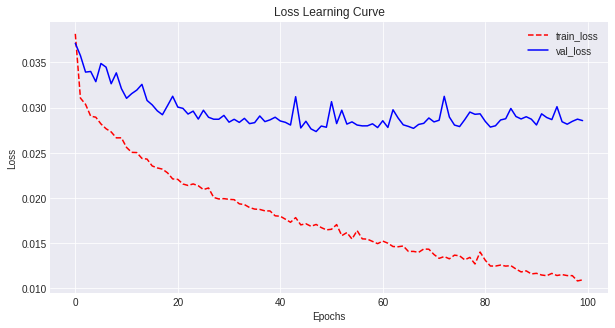

Test  Loss: 0.0251
Kappa List: [0.5762 0.4632 0.5735]
Test Quadratic Cohen Kappa Score (per essay set): 0.5376
Test Quadratic Cohen Kappa Score (all essay set): 0.9486
Test Spearman Correlation Score  (all essay set): 0.9288

			 -------- Fold 2 --------
Total Training Time: 60.51 seconds
Train Loss: 0.0179
Val   Loss: 0.0248


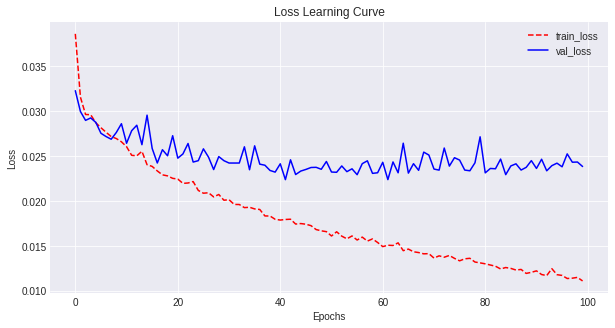

Test  Loss: 0.029
Kappa List: [0.6755 0.6051 0.5002]
Test Quadratic Cohen Kappa Score (per essay set): 0.5936
Test Quadratic Cohen Kappa Score (all essay set): 0.9517
Test Spearman Correlation Score  (all essay set): 0.9246

			 -------- Fold 3 --------
Total Training Time: 59.55 seconds
Train Loss: 0.0175
Val   Loss: 0.0302


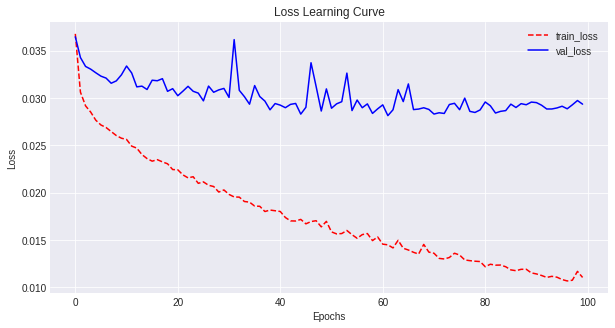

Test  Loss: 0.0278
Kappa List: [0.6365 0.4517 0.5463]
Test Quadratic Cohen Kappa Score (per essay set): 0.5448
Test Quadratic Cohen Kappa Score (all essay set): 0.9477
Test Spearman Correlation Score  (all essay set): 0.8981

			 -------- Fold 4 --------
Total Training Time: 59.63 seconds
Train Loss: 0.0178
Val   Loss: 0.0286


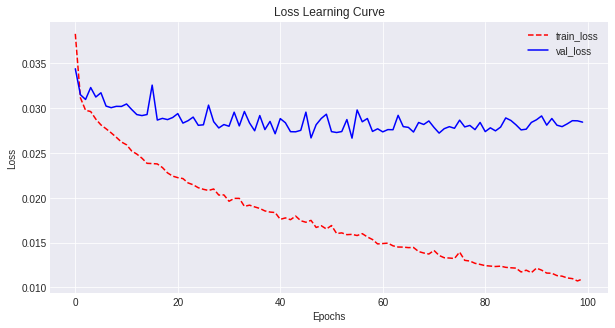

Test  Loss: 0.0251
Kappa List: [0.611  0.6109 0.562 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.5946
Test Quadratic Cohen Kappa Score (all essay set): 0.9506
Test Spearman Correlation Score  (all essay set): 0.9246

			 -------- Fold 5 --------
Total Training Time: 59.9 seconds
Train Loss: 0.0181
Val   Loss: 0.0284


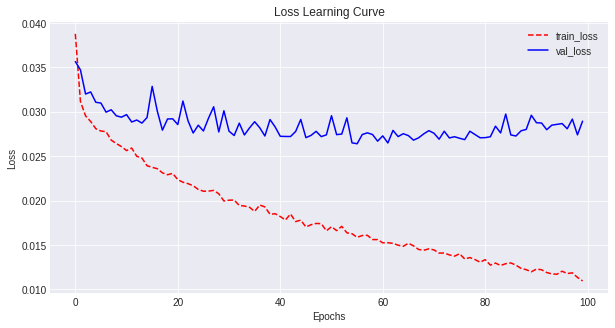

Test  Loss: 0.0263
Kappa List: [0.5981 0.5752 0.5418]
Test Quadratic Cohen Kappa Score (per essay set): 0.5717
Test Quadratic Cohen Kappa Score (all essay set): 0.9459
Test Spearman Correlation Score  (all essay set): 0.9304


			Average Results:
Train Loss: 0.0178
Val   Loss: 0.0283
Test  Loss: 0.0267
QCK Score (per essay set): 0.5685
QCK Score (all essay set): 0.9489
SCR Score (all essay set): 0.9213

********************************************************************************


			Essays Sets Between [ 1, 4 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (6371, 200)
Shape of TEST X:  (708, 200)
Shape of TRAIN Y: (6371,)
Shape of TEST Y:  (708,)
Shape of TRAIN SCORE INFO: (6371, 3)
Shape of TEST SCORE INFO:  (708, 3)
New X Shape: (7079, 1, 200)
New Y Shape: (7079,)
New SCORE INFO Shape: (7079, 3)

			 -------- Fold 1 --------
Total Training Time: 79.74 seconds
Train Loss: 0.0202
Val   Loss: 0.0323


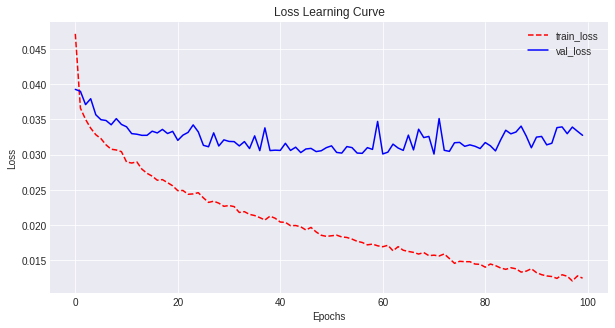

Test  Loss: 0.0307
Kappa List: [0.6165 0.5499 0.4798 0.7183]
Test Quadratic Cohen Kappa Score (per essay set): 0.5911
Test Quadratic Cohen Kappa Score (all essay set): 0.9521
Test Spearman Correlation Score  (all essay set): 0.9182

			 -------- Fold 2 --------
Total Training Time: 79.8 seconds
Train Loss: 0.0204
Val   Loss: 0.0317


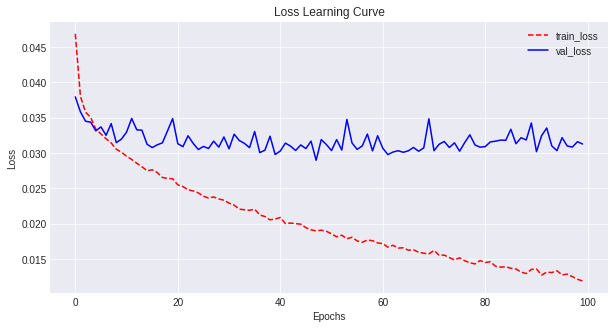

Test  Loss: 0.0303
Kappa List: [0.3725 0.5063 0.5426 0.773 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.5486
Test Quadratic Cohen Kappa Score (all essay set): 0.9429
Test Spearman Correlation Score  (all essay set): 0.9135

			 -------- Fold 3 --------
Total Training Time: 80.6 seconds
Train Loss: 0.02
Val   Loss: 0.0311


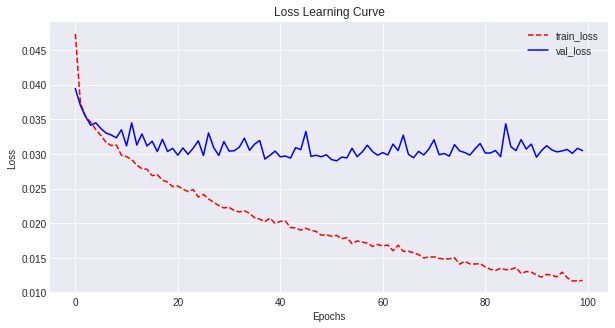

Test  Loss: 0.0297
Kappa List: [0.5973 0.4961 0.5381 0.7645]
Test Quadratic Cohen Kappa Score (per essay set): 0.599
Test Quadratic Cohen Kappa Score (all essay set): 0.949
Test Spearman Correlation Score  (all essay set): 0.925

			 -------- Fold 4 --------
Total Training Time: 78.81 seconds
Train Loss: 0.0202
Val   Loss: 0.0349


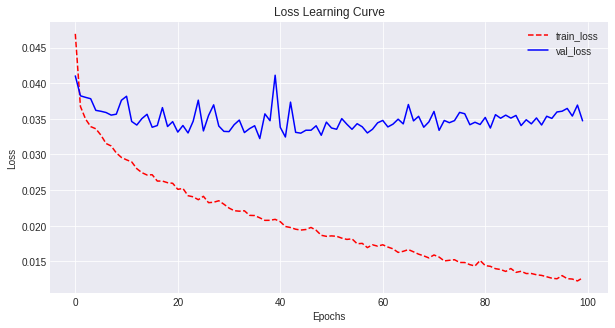

Test  Loss: 0.0298
Kappa List: [0.5896 0.5181 0.5971 0.6951]
Test Quadratic Cohen Kappa Score (per essay set): 0.6
Test Quadratic Cohen Kappa Score (all essay set): 0.951
Test Spearman Correlation Score  (all essay set): 0.9284

			 -------- Fold 5 --------
Total Training Time: 79.96 seconds
Train Loss: 0.0196
Val   Loss: 0.0325


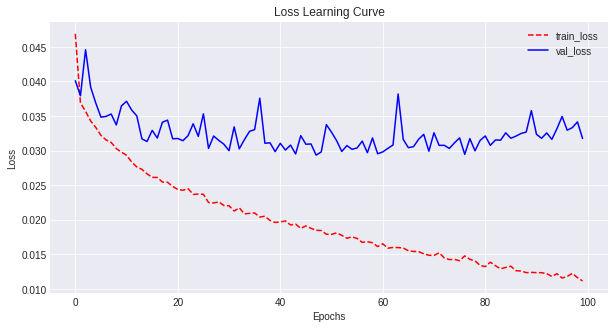

Test  Loss: 0.0318
Kappa List: [0.6759 0.544  0.5084 0.687 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6038
Test Quadratic Cohen Kappa Score (all essay set): 0.9548
Test Spearman Correlation Score  (all essay set): 0.9226


			Average Results:
Train Loss: 0.0201
Val   Loss: 0.0325
Test  Loss: 0.0305
QCK Score (per essay set): 0.5885
QCK Score (all essay set): 0.95
SCR Score (all essay set): 0.9215

********************************************************************************


			Essays Sets Between [ 1, 5 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (7995, 200)
Shape of TEST X:  (889, 200)
Shape of TRAIN Y: (7995,)
Shape of TEST Y:  (889,)
Shape of TRAIN SCORE INFO: (7995, 3)
Shape of TEST SCORE INFO:  (889, 3)
New X Shape: (8884, 1, 200)
New Y Shape: (8884,)
New SCORE INFO Shape: (8884, 3)

			 -------- Fold 1 --------
Total Training Time: 99.17 seconds
Train Loss: 0.0203
Val   Loss: 0.027


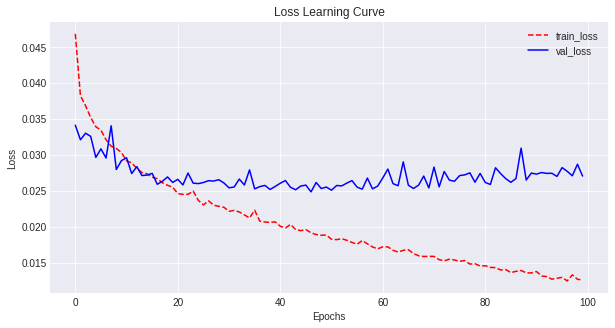

Test  Loss: 0.0315
Kappa List: [0.5799 0.4918 0.556  0.7155 0.6584]
Test Quadratic Cohen Kappa Score (per essay set): 0.6003
Test Quadratic Cohen Kappa Score (all essay set): 0.9442
Test Spearman Correlation Score  (all essay set): 0.9009

			 -------- Fold 2 --------
Total Training Time: 97.19 seconds
Train Loss: 0.0205
Val   Loss: 0.0294


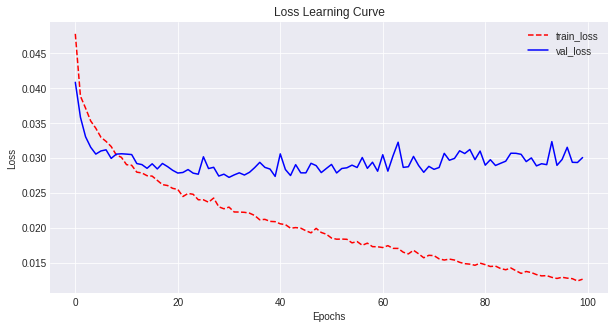

Test  Loss: 0.0305
Kappa List: [0.6157 0.537  0.5589 0.7025 0.6952]
Test Quadratic Cohen Kappa Score (per essay set): 0.6219
Test Quadratic Cohen Kappa Score (all essay set): 0.9507
Test Spearman Correlation Score  (all essay set): 0.8978

			 -------- Fold 3 --------
Total Training Time: 97.89 seconds
Train Loss: 0.0202
Val   Loss: 0.0288


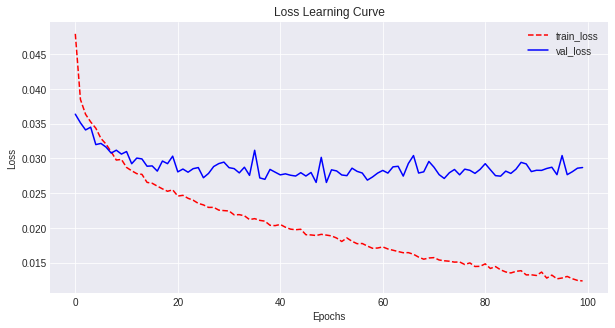

Test  Loss: 0.0294
Kappa List: [0.6521 0.4666 0.5864 0.7417 0.6963]
Test Quadratic Cohen Kappa Score (per essay set): 0.6286
Test Quadratic Cohen Kappa Score (all essay set): 0.9489
Test Spearman Correlation Score  (all essay set): 0.9066

			 -------- Fold 4 --------
Total Training Time: 98.09 seconds
Train Loss: 0.02
Val   Loss: 0.0304


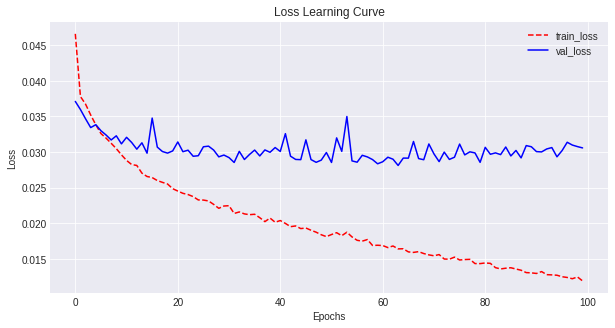

Test  Loss: 0.0293
Kappa List: [0.7265 0.4707 0.5648 0.7449 0.7204]
Test Quadratic Cohen Kappa Score (per essay set): 0.6454
Test Quadratic Cohen Kappa Score (all essay set): 0.9517
Test Spearman Correlation Score  (all essay set): 0.9128

			 -------- Fold 5 --------
Total Training Time: 97.88 seconds
Train Loss: 0.02
Val   Loss: 0.0286


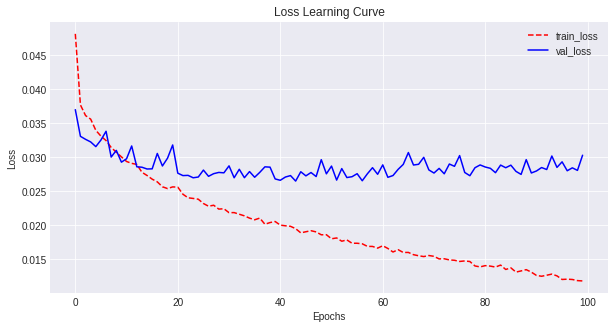

Test  Loss: 0.0307
Kappa List: [0.5795 0.4533 0.5403 0.7601 0.6963]
Test Quadratic Cohen Kappa Score (per essay set): 0.6059
Test Quadratic Cohen Kappa Score (all essay set): 0.9474
Test Spearman Correlation Score  (all essay set): 0.9065


			Average Results:
Train Loss: 0.0202
Val   Loss: 0.0289
Test  Loss: 0.0303
QCK Score (per essay set): 0.6204
QCK Score (all essay set): 0.9486
SCR Score (all essay set): 0.9049

********************************************************************************


			Essays Sets Between [ 1, 6 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (9615, 200)
Shape of TEST X:  (1069, 200)
Shape of TRAIN Y: (9615,)
Shape of TEST Y:  (1069,)
Shape of TRAIN SCORE INFO: (9615, 3)
Shape of TEST SCORE INFO:  (1069, 3)
New X Shape: (10684, 1, 200)
New Y Shape: (10684,)
New SCORE INFO Shape: (10684, 3)

			 -------- Fold 1 --------
Total Training Time: 119.31 seconds
Train Loss: 0.0197
Val   Loss: 0.0276


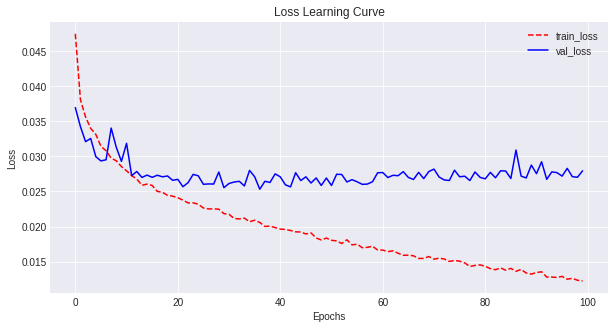

Test  Loss: 0.0285
Kappa List: [0.6789 0.5353 0.5908 0.7279 0.7075 0.7157]
Test Quadratic Cohen Kappa Score (per essay set): 0.6594
Test Quadratic Cohen Kappa Score (all essay set): 0.9476
Test Spearman Correlation Score  (all essay set): 0.8792

			 -------- Fold 2 --------
Total Training Time: 117.36 seconds
Train Loss: 0.0201
Val   Loss: 0.0279


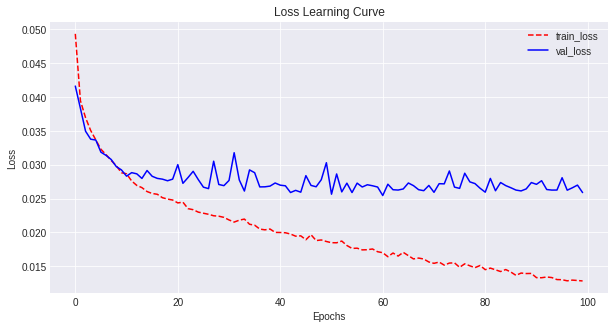

Test  Loss: 0.0282
Kappa List: [0.5572 0.5501 0.4744 0.7609 0.668  0.741 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6253
Test Quadratic Cohen Kappa Score (all essay set): 0.9431
Test Spearman Correlation Score  (all essay set): 0.9011

			 -------- Fold 3 --------
Total Training Time: 116.41 seconds
Train Loss: 0.0195
Val   Loss: 0.0291


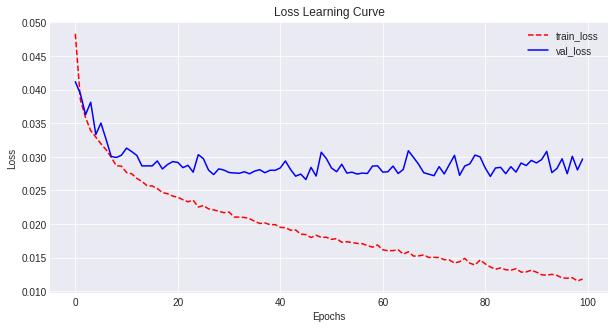

Test  Loss: 0.0281
Kappa List: [0.6321 0.5539 0.6118 0.7327 0.6647 0.7651]
Test Quadratic Cohen Kappa Score (per essay set): 0.66
Test Quadratic Cohen Kappa Score (all essay set): 0.9449
Test Spearman Correlation Score  (all essay set): 0.8921

			 -------- Fold 4 --------
Total Training Time: 116.09 seconds
Train Loss: 0.0196
Val   Loss: 0.0285


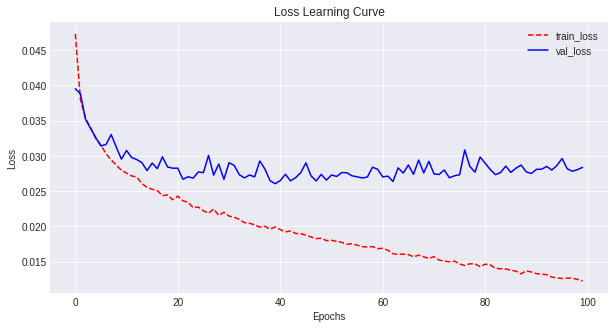

Test  Loss: 0.0287
Kappa List: [0.6936 0.4885 0.587  0.7279 0.6794 0.7867]
Test Quadratic Cohen Kappa Score (per essay set): 0.6605
Test Quadratic Cohen Kappa Score (all essay set): 0.9435
Test Spearman Correlation Score  (all essay set): 0.893

			 -------- Fold 5 --------
Total Training Time: 113.01 seconds
Train Loss: 0.0196
Val   Loss: 0.027


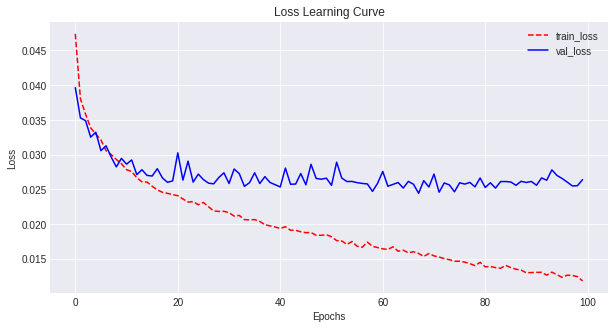

Test  Loss: 0.028
Kappa List: [0.6411 0.465  0.5654 0.7621 0.7235 0.7578]
Test Quadratic Cohen Kappa Score (per essay set): 0.6525
Test Quadratic Cohen Kappa Score (all essay set): 0.9482
Test Spearman Correlation Score  (all essay set): 0.8874


			Average Results:
Train Loss: 0.0197
Val   Loss: 0.028
Test  Loss: 0.0283
QCK Score (per essay set): 0.6515
QCK Score (all essay set): 0.9455
SCR Score (all essay set): 0.8905

********************************************************************************


			Essays Sets Between [ 1, 7 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11027, 200)
Shape of TEST X:  (1226, 200)
Shape of TRAIN Y: (11027,)
Shape of TEST Y:  (1226,)
Shape of TRAIN SCORE INFO: (11027, 3)
Shape of TEST SCORE INFO:  (1226, 3)
New X Shape: (12253, 1, 200)
New Y Shape: (12253,)
New SCORE INFO Shape: (12253, 3)

			 -------- Fold 1 --------
Total Training Time: 133.08 seconds
Train Loss: 0.0188
Val   Loss: 0.0271


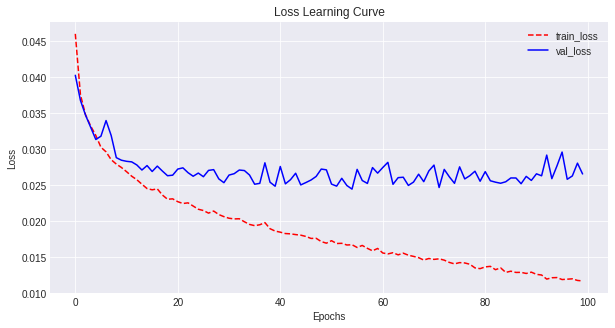

Test  Loss: 0.0286
Kappa List: [0.6621 0.4743 0.5906 0.702  0.6882 0.7255 0.695 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6482
Test Quadratic Cohen Kappa Score (all essay set): 0.9569
Test Spearman Correlation Score  (all essay set): 0.9236

			 -------- Fold 2 --------
Total Training Time: 132.43 seconds
Train Loss: 0.019
Val   Loss: 0.0275


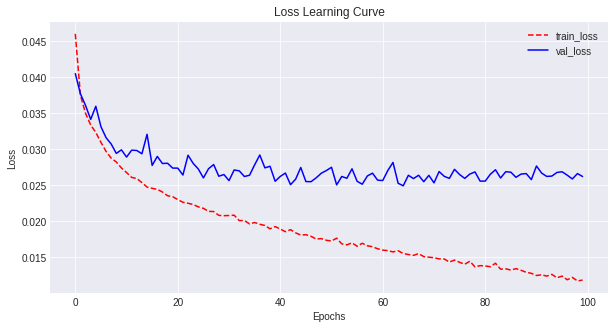

Test  Loss: 0.0289
Kappa List: [0.6026 0.5038 0.4287 0.747  0.7043 0.7704 0.651 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6297
Test Quadratic Cohen Kappa Score (all essay set): 0.9594
Test Spearman Correlation Score  (all essay set): 0.9279

			 -------- Fold 3 --------
Total Training Time: 130.77 seconds
Train Loss: 0.019
Val   Loss: 0.0284


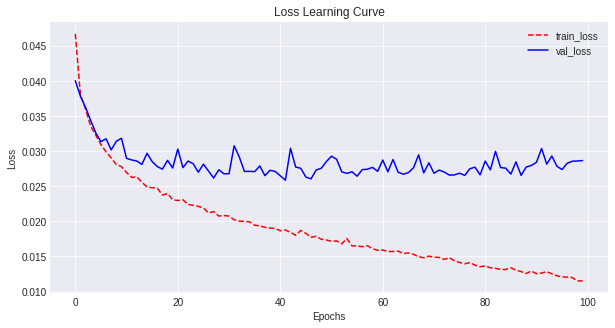

Test  Loss: 0.0295
Kappa List: [0.7071 0.4924 0.5815 0.7176 0.6634 0.7576 0.6999]
Test Quadratic Cohen Kappa Score (per essay set): 0.6599
Test Quadratic Cohen Kappa Score (all essay set): 0.957
Test Spearman Correlation Score  (all essay set): 0.9229

			 -------- Fold 4 --------
Total Training Time: 130.77 seconds
Train Loss: 0.0191
Val   Loss: 0.0268


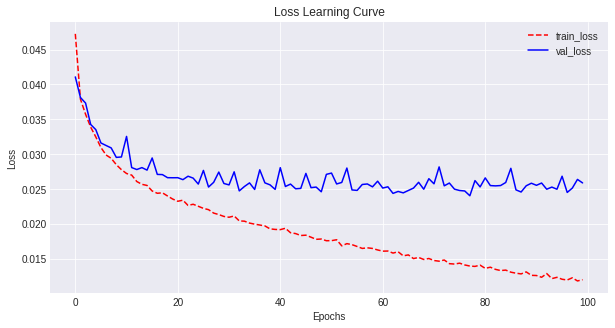

Test  Loss: 0.0277
Kappa List: [0.6755 0.4305 0.5341 0.7374 0.6858 0.7963 0.7565]
Test Quadratic Cohen Kappa Score (per essay set): 0.6595
Test Quadratic Cohen Kappa Score (all essay set): 0.967
Test Spearman Correlation Score  (all essay set): 0.9244

			 -------- Fold 5 --------
Total Training Time: 129.4 seconds
Train Loss: 0.0189
Val   Loss: 0.0255


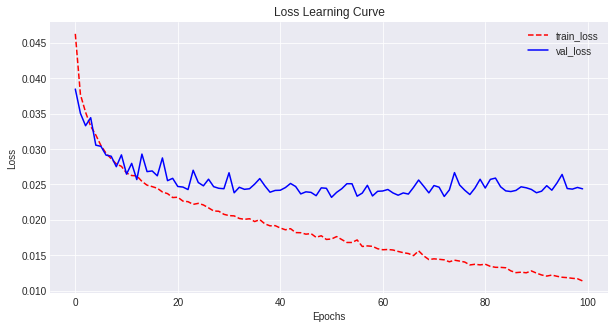

Test  Loss: 0.0285
Kappa List: [0.5914 0.5487 0.576  0.71   0.731  0.7303 0.669 ]
Test Quadratic Cohen Kappa Score (per essay set): 0.6509
Test Quadratic Cohen Kappa Score (all essay set): 0.9563
Test Spearman Correlation Score  (all essay set): 0.9237


			Average Results:
Train Loss: 0.019
Val   Loss: 0.027
Test  Loss: 0.0287
QCK Score (per essay set): 0.6496
QCK Score (all essay set): 0.9593
SCR Score (all essay set): 0.9245

********************************************************************************


			Essays Sets Between [ 1, 8 ]


/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL


Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)
New X Shape: (12976, 1, 200)
New Y Shape: (12976,)
New SCORE INFO Shape: (12976, 3)

			 -------- Fold 1 --------
Total Training Time: 139.79 seconds
Train Loss: 0.0185
Val   Loss: 0.0282


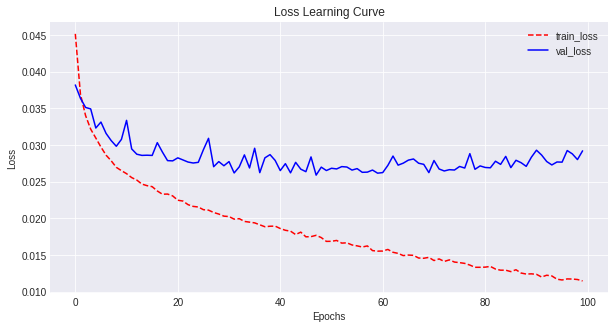

Test  Loss: 0.0289
Kappa List: [0.6186 0.5538 0.5418 0.7286 0.7099 0.8057 0.7025 0.4293]
Test Quadratic Cohen Kappa Score (per essay set): 0.6363
Test Quadratic Cohen Kappa Score (all essay set): 0.9748
Test Spearman Correlation Score  (all essay set): 0.9408

			 -------- Fold 2 --------
Total Training Time: 138.72 seconds
Train Loss: 0.0185
Val   Loss: 0.0306


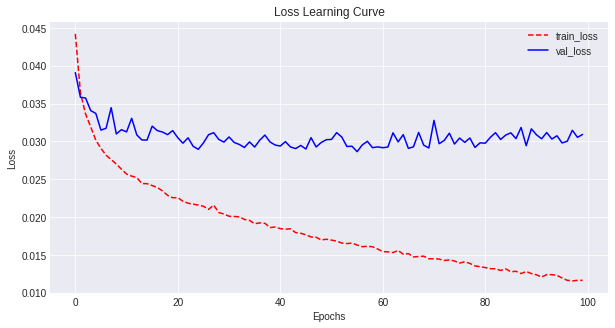

Test  Loss: 0.027
Kappa List: [0.551  0.5328 0.5461 0.7034 0.7274 0.7668 0.5778 0.2842]
Test Quadratic Cohen Kappa Score (per essay set): 0.5862
Test Quadratic Cohen Kappa Score (all essay set): 0.962
Test Spearman Correlation Score  (all essay set): 0.9375

			 -------- Fold 3 --------
Total Training Time: 140.15 seconds
Train Loss: 0.019
Val   Loss: 0.0287


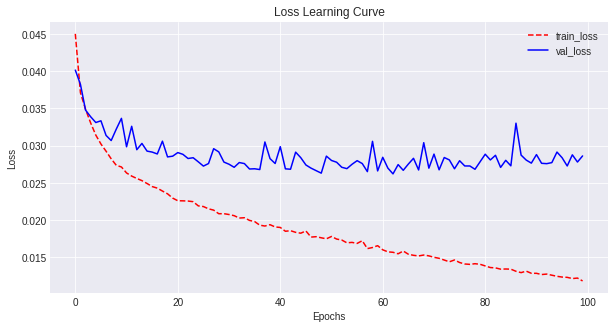

Test  Loss: 0.0261
Kappa List: [0.6398 0.5345 0.5354 0.7688 0.6949 0.7345 0.6751 0.4095]
Test Quadratic Cohen Kappa Score (per essay set): 0.6241
Test Quadratic Cohen Kappa Score (all essay set): 0.9694
Test Spearman Correlation Score  (all essay set): 0.9324

			 -------- Fold 4 --------
Total Training Time: 136.52 seconds
Train Loss: 0.0187
Val   Loss: 0.0294


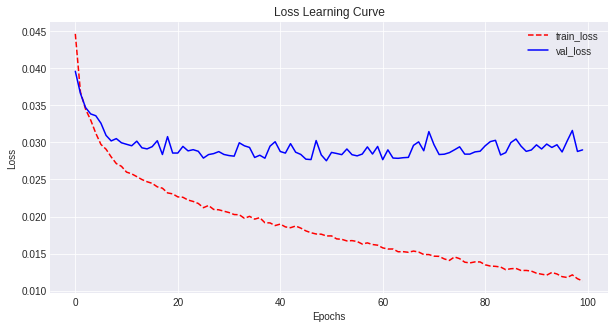

Test  Loss: 0.0257
Kappa List: [0.6463 0.4534 0.5565 0.8101 0.6391 0.7423 0.661  0.4262]
Test Quadratic Cohen Kappa Score (per essay set): 0.6169
Test Quadratic Cohen Kappa Score (all essay set): 0.971
Test Spearman Correlation Score  (all essay set): 0.9394

			 -------- Fold 5 --------
Total Training Time: 137.27 seconds
Train Loss: 0.0183
Val   Loss: 0.0282


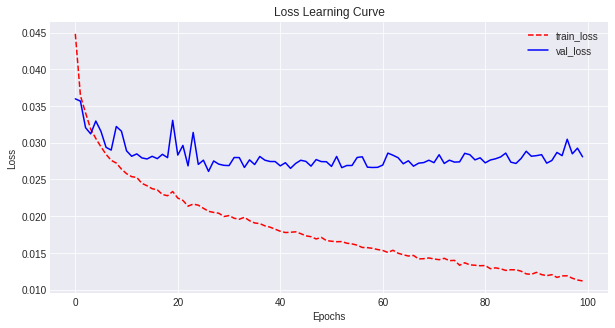

Test  Loss: 0.029
Kappa List: [0.6399 0.5643 0.5686 0.7117 0.633  0.7591 0.6207 0.4463]
Test Quadratic Cohen Kappa Score (per essay set): 0.618
Test Quadratic Cohen Kappa Score (all essay set): 0.975
Test Spearman Correlation Score  (all essay set): 0.9271


			Average Results:
Train Loss: 0.0186
Val   Loss: 0.029
Test  Loss: 0.0273
QCK Score (per essay set): 0.6163
QCK Score (all essay set): 0.9705
SCR Score (all essay set): 0.9354

********************************************************************************


In [103]:
# try different combinations of essay set starting from 1, 1-2, 1-3, ..., 1-8
for topic_number in range(1, 9):
    print('\n\n\t\t\tEssays Sets Between [ 1,', topic_number, ']')
    temp_df = df[(df['essay_set'] >= 1) & (df['essay_set'] <= topic_number)]
    cross_val_eval(df=temp_df, dim=200, units=128, batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)
    print('\n********************************************************************************')

/usr/local/lib/python3.6/dist-packages/smart_open/smart_open_lib.py:402: UserWarning: This function is deprecated, use smart_open.open instead. See the migration notes for details: https://github.com/RaRe-Technologies/smart_open/blob/master/README.rst#migrating-to-the-new-open-function
  'See the migration notes for details: %s' % _MIGRATION_NOTES_URL




			Essays Sets Between [ 1, 1 ]
Shape of TRAIN X: (1604, 200)
Shape of TEST X:  (179, 200)
Shape of TRAIN Y: (1604,)
Shape of TEST Y:  (179,)
Shape of TRAIN SCORE INFO: (1604, 3)
Shape of TEST SCORE INFO:  (179, 3)

	Total Training Time: 23.46 seconds
Train Loss: 0.0107
Val   Loss: 0.0148


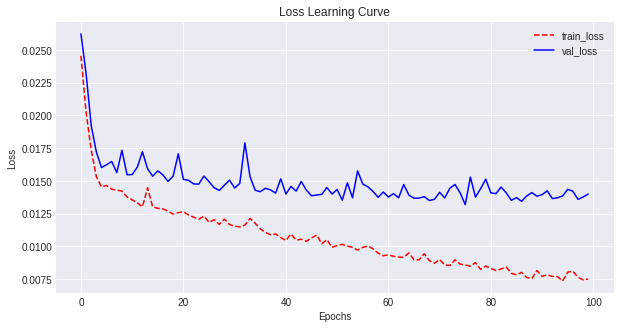

Test Loss: 0.0127
Kappa List: [0.5934]
Test Quadratic Cohen Kappa Score: 0.5934


			Essays Sets Between [ 1, 2 ]
Shape of TRAIN X: (3224, 200)
Shape of TEST X:  (359, 200)
Shape of TRAIN Y: (3224,)
Shape of TEST Y:  (359,)
Shape of TRAIN SCORE INFO: (3224, 3)
Shape of TEST SCORE INFO:  (359, 3)

	Total Training Time: 45.58 seconds
Train Loss: 0.0115
Val   Loss: 0.0144


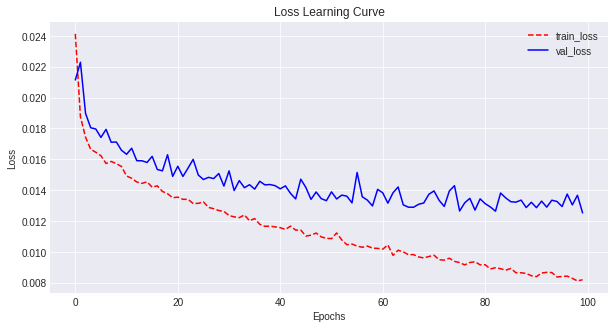

Test Loss: 0.0136
Kappa List: [0.6317 0.5623]
Test Quadratic Cohen Kappa Score: 0.597


			Essays Sets Between [ 1, 3 ]
Shape of TRAIN X: (4778, 200)
Shape of TEST X:  (531, 200)
Shape of TRAIN Y: (4778,)
Shape of TEST Y:  (531,)
Shape of TRAIN SCORE INFO: (4778, 3)
Shape of TEST SCORE INFO:  (531, 3)

	Total Training Time: 65.81 seconds
Train Loss: 0.0179
Val   Loss: 0.0243


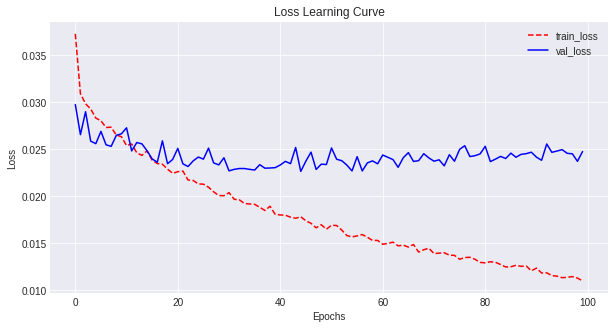

Test Loss: 0.0274
Kappa List: [0.6638 0.5298 0.572 ]
Test Quadratic Cohen Kappa Score: 0.5885


			Essays Sets Between [ 1, 4 ]
Shape of TRAIN X: (6371, 200)
Shape of TEST X:  (708, 200)
Shape of TRAIN Y: (6371,)
Shape of TEST Y:  (708,)
Shape of TRAIN SCORE INFO: (6371, 3)
Shape of TEST SCORE INFO:  (708, 3)

	Total Training Time: 87.83 seconds
Train Loss: 0.0204
Val   Loss: 0.0279


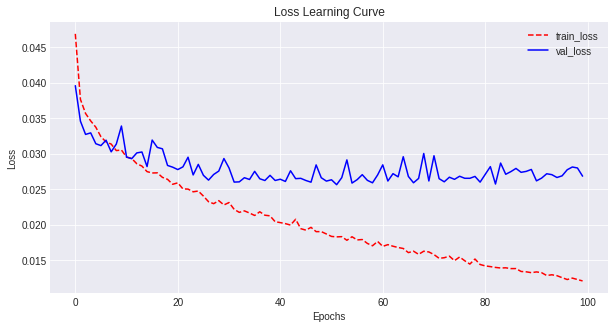

Test Loss: 0.0336
Kappa List: [0.614  0.485  0.5064 0.7126]
Test Quadratic Cohen Kappa Score: 0.5795


			Essays Sets Between [ 1, 5 ]
Shape of TRAIN X: (7995, 200)
Shape of TEST X:  (889, 200)
Shape of TRAIN Y: (7995,)
Shape of TEST Y:  (889,)
Shape of TRAIN SCORE INFO: (7995, 3)
Shape of TEST SCORE INFO:  (889, 3)

	Total Training Time: 107.52 seconds
Train Loss: 0.02
Val   Loss: 0.0304


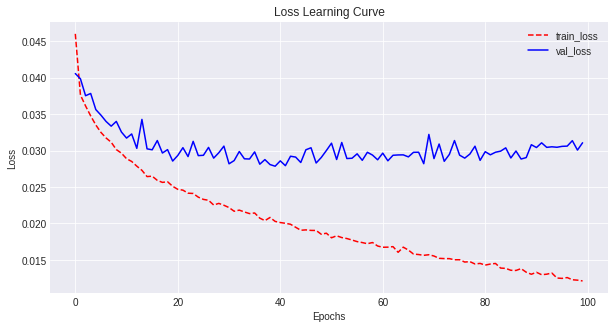

Test Loss: 0.0294
Kappa List: [0.5944 0.429  0.5427 0.7663 0.671 ]
Test Quadratic Cohen Kappa Score: 0.6007


			Essays Sets Between [ 1, 6 ]
Shape of TRAIN X: (9615, 200)
Shape of TEST X:  (1069, 200)
Shape of TRAIN Y: (9615,)
Shape of TEST Y:  (1069,)
Shape of TRAIN SCORE INFO: (9615, 3)
Shape of TEST SCORE INFO:  (1069, 3)

	Total Training Time: 129.14 seconds
Train Loss: 0.0193
Val   Loss: 0.0299


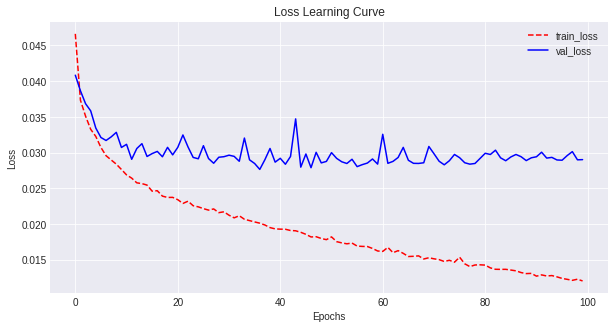

Test Loss: 0.0277
Kappa List: [0.7052 0.5941 0.6383 0.6983 0.6978 0.6608]
Test Quadratic Cohen Kappa Score: 0.6658


			Essays Sets Between [ 1, 7 ]
Shape of TRAIN X: (11027, 200)
Shape of TEST X:  (1226, 200)
Shape of TRAIN Y: (11027,)
Shape of TEST Y:  (1226,)
Shape of TRAIN SCORE INFO: (11027, 3)
Shape of TEST SCORE INFO:  (1226, 3)

	Total Training Time: 149.45 seconds
Train Loss: 0.0191
Val   Loss: 0.0297


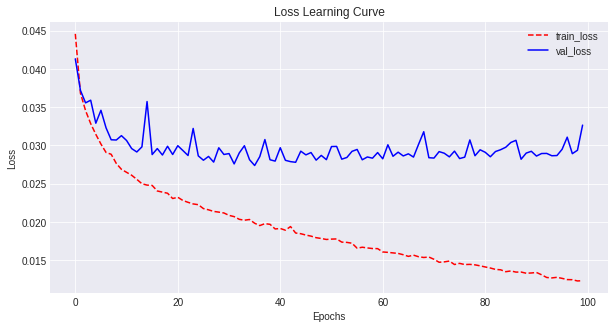

Test Loss: 0.0279
Kappa List: [0.6731 0.6219 0.6348 0.7677 0.7347 0.7506 0.7475]
Test Quadratic Cohen Kappa Score: 0.7043


			Essays Sets Between [ 1, 8 ]
Shape of TRAIN X: (11678, 200)
Shape of TEST X:  (1298, 200)
Shape of TRAIN Y: (11678,)
Shape of TEST Y:  (1298,)
Shape of TRAIN SCORE INFO: (11678, 3)
Shape of TEST SCORE INFO:  (1298, 3)

	Total Training Time: 157.18 seconds
Train Loss: 0.0185
Val   Loss: 0.0283


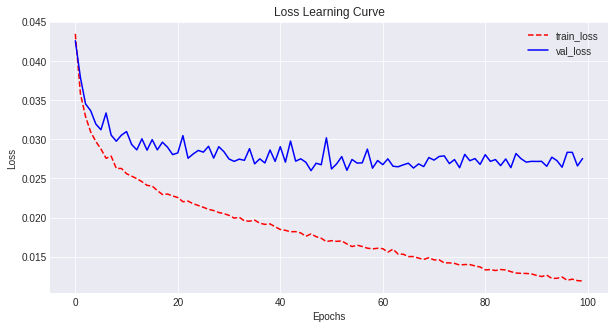

Test Loss: 0.0293
Kappa List: [0.5799 0.5424 0.4844 0.6595 0.7562 0.7334 0.6744 0.5504]
Test Quadratic Cohen Kappa Score: 0.6226


In [105]:
# run the same loop without cross validation
word_model = Word2Vec.load('./DATA/custom_word2vec_models/200_noSW_word2vec_model')
for topic_number in range(1, 9):
    print('\n\n\t\t\tEssays Sets Between [ 1,', topic_number, ']')
    temp_df = df[(df['essay_set'] >= 1) & (df['essay_set'] <= topic_number)]
    data = Data(df=temp_df, useStopWord=False, model=word_model, dim=200, test_size=0.1).getTrainTestSplit(isTokenizer=False)
    data['train_x'] = np.reshape(data['train_x'], (data['train_x'].shape[0], 1, data['train_x'].shape[1]))
    data['test_x'] = np.reshape(data['test_x'], (data['test_x'].shape[0], 1, data['test_x'].shape[1]))
    model = BiLSTM(input_shape=(1, 200), units=128)
    history, model = fitModel(model, data, batch_size=32, epochs=100, val_size=0.1, verbose=0, callbacks_list=None, isPlot=True)
    results = evaluateModel(model, data)

In [0]:
'''
[1, 1] 
    Train Loss: 0.0107
    Val   Loss: 0.0148
    Test Loss: 0.0127
    Test Quadratic Cohen Kappa Score: 0.5934
[1, 2] 
    Train Loss: 0.0115
    Val   Loss: 0.0144
    Test Loss: 0.0136
    Test Quadratic Cohen Kappa Score: 0.597
[1, 3] 
    Train Loss: 0.0179
    Val   Loss: 0.0243
    Test Loss: 0.0274
    Test Quadratic Cohen Kappa Score: 0.5885
[1, 4] 
    Train Loss: 0.0204
    Val   Loss: 0.0279
    Test Loss: 0.0336
    Test Quadratic Cohen Kappa Score: 0.5795
[1, 5] 
    Train Loss: 0.02
    Val   Loss: 0.0304
    Test Loss: 0.0294
    Test Quadratic Cohen Kappa Score: 0.6007
[1, 6] 
    Train Loss: 0.0193
    Val   Loss: 0.0299
    Test Loss: 0.0277
    Test Quadratic Cohen Kappa Score: 0.6658
[1, 7] 
    Train Loss: 0.0191
    Val   Loss: 0.0297
    Test Loss: 0.0279
    Test Quadratic Cohen Kappa Score: 0.7043
[1, 8] 
    Train Loss: 0.0185
    Val   Loss: 0.0283
    Test Loss: 0.0293
    Test Quadratic Cohen Kappa Score: 0.6226
'''
pass

In [110]:
# calculate rater1 and rater2 score for each essay set combination
for topic_number in range(1, 9):
    print('\nEssays Sets Between [ 1,', topic_number, ']')
    temp_df = df[(df['essay_set'] >= 1) & (df['essay_set'] <= topic_number)]
    kappa_list = []
    for topic_number in list(np.unique(temp_df.essay_set.values)):
        kappa_list.append(kappa(temp_df[temp_df.essay_set == topic_number]['rater1_domain1'], 
                                temp_df[temp_df.essay_set == topic_number]['rater2_domain1'], 
                                weights='quadratic'))
    print('\tRater Kappa:', np.round(np.mean(kappa_list), 4))


Essays Sets Between [ 1, 1 ]
	Rater Kappa: 0.721

Essays Sets Between [ 1, 2 ]
	Rater Kappa: 0.7675

Essays Sets Between [ 1, 3 ]
	Rater Kappa: 0.7681

Essays Sets Between [ 1, 4 ]
	Rater Kappa: 0.7888

Essays Sets Between [ 1, 5 ]
	Rater Kappa: 0.7816

Essays Sets Between [ 1, 6 ]
	Rater Kappa: 0.7807

Essays Sets Between [ 1, 7 ]
	Rater Kappa: 0.7723

Essays Sets Between [ 1, 8 ]
	Rater Kappa: 0.7544
